In [8]:
import pandas as pd


In [10]:

file_path = '/Users/armughan/Downloads/greenphire_preprocessed.parquet'
dtype_map = {
        'cite_inv_id' :'Int64',
        'gp_inv_id'	: 'Int64',
        'cite_trial_id' : 'Int64',
        'gp_study_id' : 'str',
        'gp_study_name' : 'str',
        'gp_study_protocol' : 'str',
        'amount' : 'Float64',	
        'currency' : 'str',
        'description' : 'str',
        'payment_id	milestone' :'str',
        'milestone_config_id' : 'Int64',
        'payment_schedule_id' : 'Int64',
        'record_number' : 'str',
        'status' : 'str',
        'subject_id' : 'str'
}
df = pd.read_parquet(file_path)

df.head(2)


,cite_inv_id,gp_inv_id,cite_trial_id,gp_study_id,gp_study_name,gp_study_protocol,activity_completion_date,amount,currency,description,...,milestone_config_id,payment_schedule_id,record_number,status,subject_id,amount_usd,category,tt_therapeutic_area,tt_disease,tt_phase
0,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-09-30,1500.0,USD,Pharmacy Set-Up Fee,...,51725,46470745,None,released,None,1500.0,Administrative,Cardiovascular,Coronary Artery Disease,III
1,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-09-30,2500.0,USD,Site preparation fee for initial submission of...,...,51725,52084990,None,released,None,2500.0,Administrative,Cardiovascular,Coronary Artery Disease,III


In [12]:
import pandas as pd

trial_path = "/Users/armughan/Downloads/investigator_trial_metadata_tt_all_newdata.csv"  

# Reading the Excel file
df_trial = pd.read_excel(trial_path)

print("Columns in the dataset:")
print(df_trial.columns)


Columns in the dataset:
Index(['tt_id', 'industry', 'tt_phase', 'tt_status', 'tt_therapeutic_area',
       'tt_disease', 'actual_acctual', 'tt_created_date',
       'tt_primary_completion_date', 'tt_start_date', 'organization_id',
       'country_name', 'person_id', 'ctc_created_date', 'ctc_mod_date'],
      dtype='object')


In [14]:
df_trial_small = df_trial.groupby('tt_id').agg({
    'tt_therapeutic_area': 'first',
    'tt_disease': 'first',
    'tt_phase': 'first',
    'industry': 'first',  
    'tt_status': 'first',  
    'actual_acctual': 'first',  
    'tt_created_date': 'first',  
    'tt_primary_completion_date': 'first', 
    'tt_start_date': 'first',  
    'organization_id': 'first',  
    'country_name': 'first',  
    'person_id': 'first',  
    'ctc_created_date': 'first', 
    'ctc_mod_date': 'first'  
})


In [16]:
df.to_csv('/Users/armughan/Downloads/Dataset_merged_data.csv', index=False)


In [17]:
df = df.merge(df_trial_small, left_on ='cite_trial_id',right_on = 'tt_id', how = 'left')
df.head()

,cite_inv_id,gp_inv_id,cite_trial_id,gp_study_id,gp_study_name,gp_study_protocol,activity_completion_date,amount,currency,description,...,tt_status,actual_acctual,tt_created_date,tt_primary_completion_date,tt_start_date,organization_id,country_name,person_id,ctc_created_date,ctc_mod_date
0,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-09-30,1500.0,USD,Pharmacy Set-Up Fee,...,Closed,12301.0,2019-03-13,2025-05-26,2019-06-11,41,Belgium,92084,2022-06-09,2024-01-23
1,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-09-30,2500.0,USD,Site preparation fee for initial submission of...,...,Closed,12301.0,2019-03-13,2025-05-26,2019-06-11,41,Belgium,92084,2022-06-09,2024-01-23
2,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-09-30,2500.0,USD,Study Start-Up Fee,...,Closed,12301.0,2019-03-13,2025-05-26,2019-06-11,41,Belgium,92084,2022-06-09,2024-01-23
3,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-10-11,0.0,USD,"Document Storage, Archiving Total Cost for dur...",...,Closed,12301.0,2019-03-13,2025-05-26,2019-06-11,41,Belgium,92084,2022-06-09,2024-01-23
4,182,18828,345142,747257b52dc84b4b93294ecf1bcdf770,Amgen_20170625,20170625,2019-12-16,1874.0,USD,Screen Failure,...,Closed,12301.0,2019-03-13,2025-05-26,2019-06-11,41,Belgium,92084,2022-06-09,2024-01-23


In [30]:
import pandas as pd
import re


# Convert descriptions to lowercase
df['description'] = df['description'].astype(str).str.lower()

# Updated ontologies with additional categories
ontologies = {
    'Administrative Fees': [
        'admin', 'administrative', 'site administrative'
    ],
    'IRB/EC Fees': [
        'irb', 'iec', 'ec', 'ethics committee'
    ],
    'Pharmacy Fees': [
        'pharmacy'
    ],
    'Screening Fees': [
        'screen', 'screening'
    ],
    'Followup Fees': [
        'follow', 'follow-up'
    ],
    'Covid Fees': [
        'covid-19', 'covid'
    ],
    'Payment Adjustments and Refunds': [
        'overpayment', 'returned payment', 'payment adjustment'
    ],
    'Setup and Start-Up Fees': [
        'start-up', 'startup', 'set-up', 'setup'
    ],
    'Amendment Fees': [
        'amendment', 'modification'
    ],
    'Travel Reimbursement': [
        'travel', 'transportation', 'mileage reimbursement'
    ],
    'Telephone Fees': [
        'telephone', 'phone'
    ],
    'Primary Therapy Fees': [
        'primary therapy', 'therapy'
    ],
    'Periodic Visits Fees': [
        'periodic visit', 'regular visit', 'check-up', 'day', 'week', 'visit'
    ],
    'Imaging Fees': [
        'imaging', 'mri', 'ct scan', 'x-ray'
    ],
    'Non-Trial Procedures Fees': [
        'non-trial procedure', 'non trial procedure'
    ],
    'Procedures Fees': [
        'procedure', 'surgery'
    ],
    'Safety Monitoring Fees': [
        'safety monitoring', 'monitoring'
    ],
    'Tests Fees': [
        'test', 'testing', 'lab test', 'blood test'
    ],
    'Miscellaneous Fees': []
}

# Function to classify descriptions
def classify_description(description, ontologies):
    for category, keywords in ontologies.items():
        if any(re.search(r'\b' + re.escape(keyword) + r'\b', description) for keyword in keywords):
            return category
    return 'Miscellaneous Fees'

# Apply the classification function
df['category'] = df['description'].apply(classify_description, args=(ontologies,))

# Save the updated data
output_path = '/Users/armughan/Downloads/updatedNew_Data.csv'
df.to_csv(output_path, index=False)

# Display the description and category columns
print(df[['description', 'category']])


                                               description  \
0                                      pharmacy set-up fee   
1        site preparation fee for initial submission of...   
2                                       study start-up fee   
3        document storage, archiving total cost for dur...   
4                                           screen failure   
...                                                    ...   
1945481                                     visit 5 week 6   
1945482                                     visit 6 week 8   
1945483                                    visit 7 week 10   
1945484                               visit 8 / et week 12   
1945485                                    follow-up visit   

                        category  
0                  Pharmacy Fees  
1                    IRB/EC Fees  
2        Setup and Start-Up Fees  
3             Miscellaneous Fees  
4                 Screening Fees  
...                          ...  
1945481   

In [40]:

# Apply filtering based on the given criteria
conditions = (
    ~((df['category'].isin(['Screening Fees', 'Telephone Fees', 'Miscellaneous Fees']) & (df['activity_completion_date'] < '2015-01-01')) |
      (df['category'].isin(['Pharmacy Fees', 'Travel Reimbursement', 'Tests Fees']) & (df['activity_completion_date'] < '2015-01-01')) |
      (df['category'].isin(['Followup Fees', 'Covid Fees']) & (df['activity_completion_date'] < '2020-01-01')))
)


filtered_data = df[conditions]


In [41]:
print(filtered_data[['description', 'category', 'activity_completion_date']])


                                               description  \
0                                      pharmacy set-up fee   
1        site preparation fee for initial submission of...   
2                                       study start-up fee   
3        document storage, archiving total cost for dur...   
4                                           screen failure   
...                                                    ...   
1945481                                     visit 5 week 6   
1945482                                     visit 6 week 8   
1945483                                    visit 7 week 10   
1945484                               visit 8 / et week 12   
1945485                                    follow-up visit   

                        category activity_completion_date  
0                  Pharmacy Fees               2019-09-30  
1                    IRB/EC Fees               2019-09-30  
2        Setup and Start-Up Fees               2019-09-30  
3             M

In [44]:
output_path = '/Users/armughan/Downloads/Analyze_New_Data.csv'
filtered_data.to_csv(output_path, index=False)

In [46]:




# Check for missing values in the filtered dataframe
missing_values = filtered_data.isnull().sum()
missing_percentage = (missing_values / len(filtered_data)) * 100

# Create a summary of missing values and their percentages
missing_summary = pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})
print("\nSummary of Missing Values (After Filtering):")
print(missing_summary)

# Calculate the total number of missing values
total_missing_values = missing_values.sum()
total_missing_percentage = (total_missing_values / (filtered_data.shape[0] * filtered_data.shape[1])) * 100
print(f"\nTotal Missing Values After Filtering: {total_missing_values} ({total_missing_percentage:.2f}% of data)")


/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/2762624867.py:5: DtypeWarning: Columns (14,16) have mixed types. Specify dtype option on import or set low_memory=False.
  filtered_data = pd.read_csv(file_path)



Summary of Missing Values (After Filtering):
                            Missing Values  Percentage
cite_inv_id                              0    0.000000
gp_inv_id                                0    0.000000
cite_trial_id                            0    0.000000
gp_study_id                              0    0.000000
gp_study_name                            0    0.000000
gp_study_protocol                        0    0.000000
activity_completion_date             30648    1.579781
amount                                   0    0.000000
currency                                 6    0.000309
description                              0    0.000000
payment_id                               0    0.000000
milestone                           350133   18.047944
milestone_config_id                      0    0.000000
payment_schedule_id                      0    0.000000
record_number                      1494915   77.056839
status                                   0    0.000000
subject_id         

In [52]:
# Function to calculate missing values and their percentages
def missing_data_summary(df):
    missing_values = df.isnull().sum()
    missing_percentage = (missing_values / len(df)) * 100
    return pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})

# Calculate missing values summary for each category
def calculate_missing_by_category(df):
    grouped = df.groupby('category')
    summary = {}
    for category, group in grouped:
        summary[category] = missing_data_summary(group)
    return summary

# Get missing data summary for each ontology category
missing_summary_by_category = calculate_missing_by_category(filtered_data)

# Print the summary for each category
for category, summary in missing_summary_by_category.items():
    print(f"\nCategory: {category}")
    print(summary)


Category: Administrative Fees
                            Missing Values  Percentage
cite_inv_id                              0    0.000000
gp_inv_id                                0    0.000000
cite_trial_id                            0    0.000000
gp_study_id                              0    0.000000
gp_study_name                            0    0.000000
gp_study_protocol                        0    0.000000
activity_completion_date                 0    0.000000
amount                                   0    0.000000
currency                                 0    0.000000
description                              0    0.000000
payment_id                               0    0.000000
milestone                             6266   56.051525
milestone_config_id                      0    0.000000
payment_schedule_id                      0    0.000000
record_number                         7365   65.882458
status                                   0    0.000000
subject_id                        

In [54]:



# Function to calculate missing values and their percentages
def missing_data_summary(df):
    missing_values = df.isnull().sum()
    missing_percentage = (missing_values / len(df)) * 100
    return pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})

# Calculate missing values summary for each category
def calculate_missing_by_category(df):
    grouped = df.groupby('category')
    summary = {}
    for category, group in grouped:
        summary[category] = missing_data_summary(group)
    return summary

# Get missing data summary for each ontology category
missing_summary_by_category = calculate_missing_by_category(filtered_data)

# Function to calculate percentage of data loss for each category
def calculate_data_loss_percentage(summary_dict):
    data_loss_percentage = {}
    total_rows = len(filtered_data)
    
    for category, summary in summary_dict.items():
        category_rows = len(filtered_data[filtered_data['category'] == category])
        total_missing = summary['Missing Values'].sum()
        percentage_data_loss = (total_missing / (category_rows * len(summary))) * 100
        data_loss_percentage[category] = percentage_data_loss
    
    return data_loss_percentage

# Calculate data loss percentage for each category
data_loss_percentage_by_category = calculate_data_loss_percentage(missing_summary_by_category)

# Calculate overall data loss percentage
total_missing = sum([summary['Missing Values'].sum() for summary in missing_summary_by_category.values()])
overall_data_loss_percentage = (total_missing / (len(filtered_data) * len(filtered_data.columns))) * 100

# Print data loss percentage for each category
print("Percentage of Data Loss by Ontology (Category):")
for category, percentage in data_loss_percentage_by_category.items():
    print(f"{category}: {percentage:.2f}%")

# Print overall data loss percentage
print(f"\nOverall Percentage of Data Loss: {overall_data_loss_percentage:.2f}%")


Percentage of Data Loss by Ontology (Category):
Administrative Fees: 5.47%
Amendment Fees: 8.71%
Covid Fees: 3.02%
Followup Fees: 3.50%
IRB/EC Fees: 8.71%
Imaging Fees: 4.37%
Miscellaneous Fees: 4.67%
Payment Adjustments and Refunds: 9.02%
Periodic Visits Fees: 2.36%
Pharmacy Fees: 7.75%
Primary Therapy Fees: 4.77%
Procedures Fees: 5.17%
Safety Monitoring Fees: 7.40%
Screening Fees: 2.72%
Setup and Start-Up Fees: 8.17%
Telephone Fees: 2.75%
Tests Fees: 4.12%
Travel Reimbursement: 5.09%

Overall Percentage of Data Loss: 3.61%


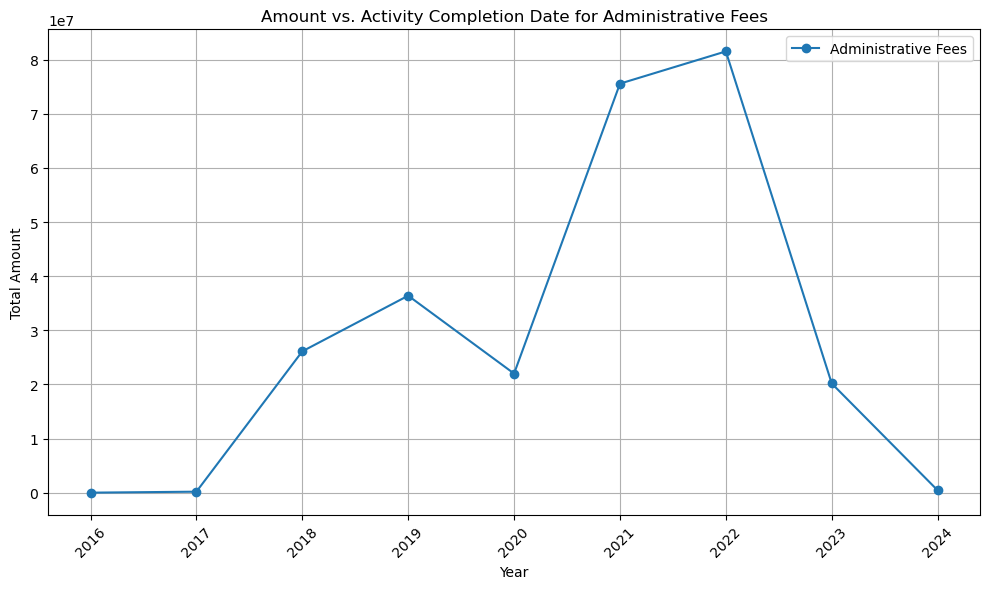

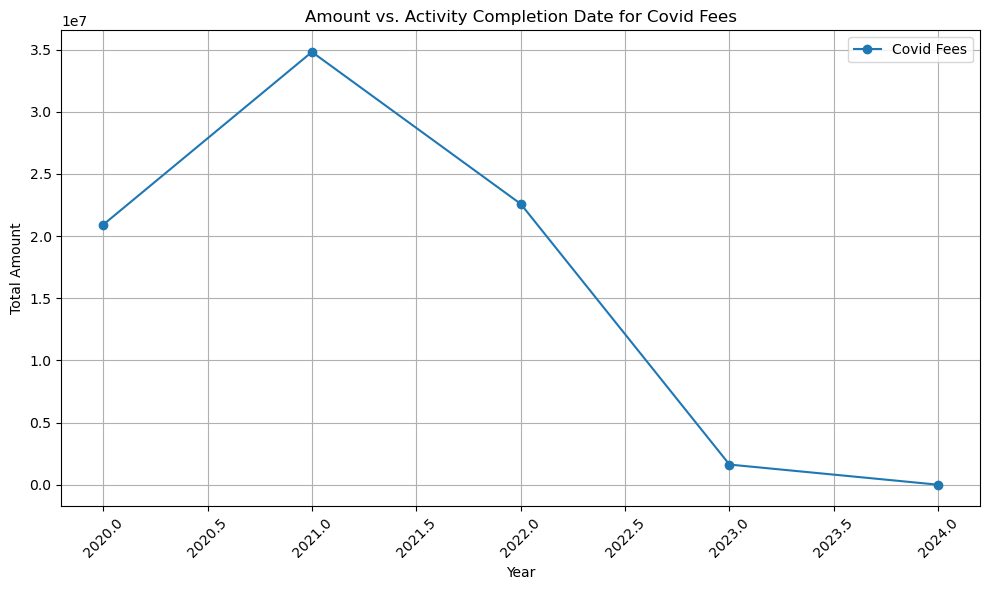

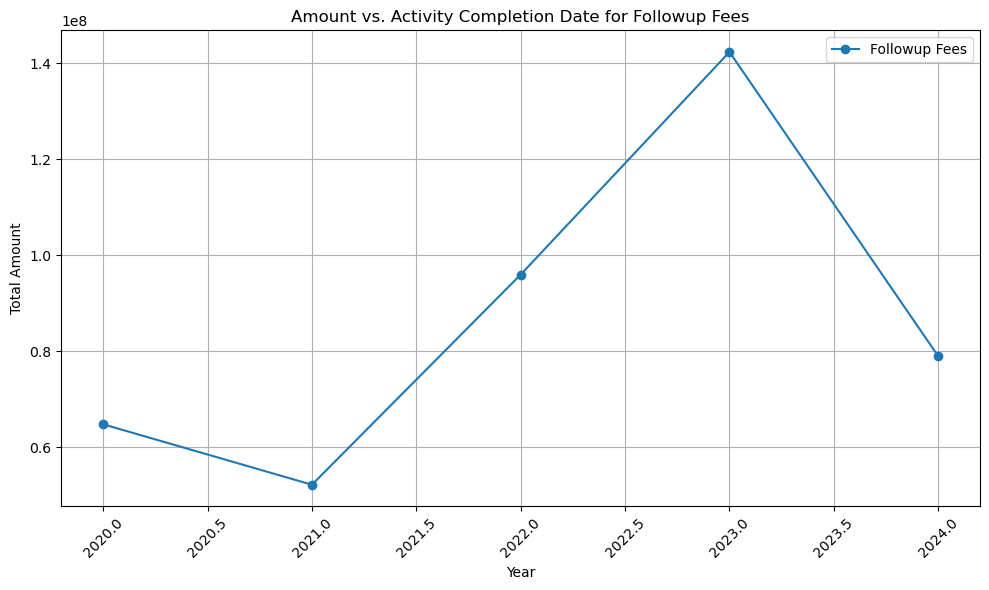

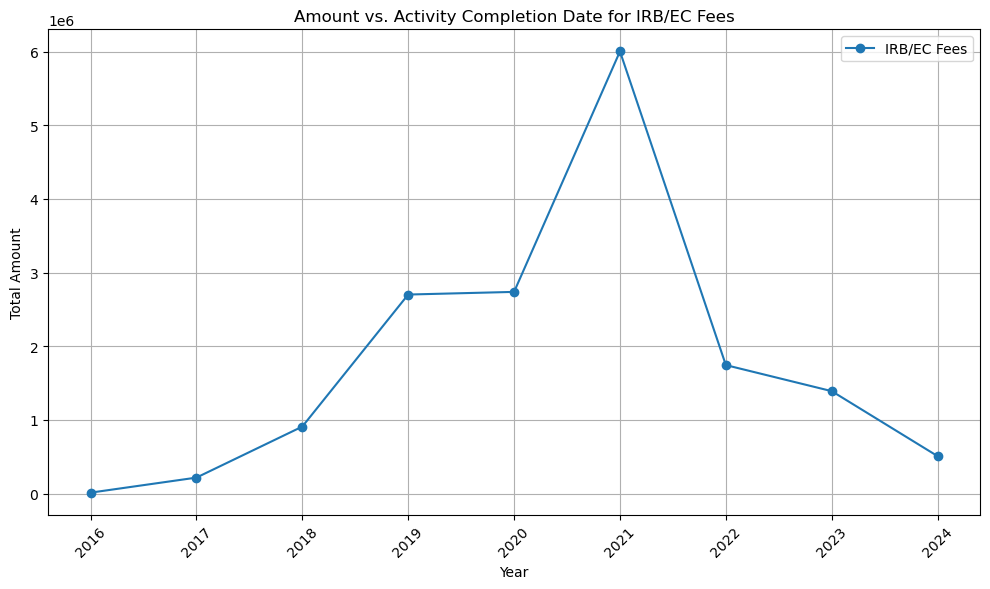

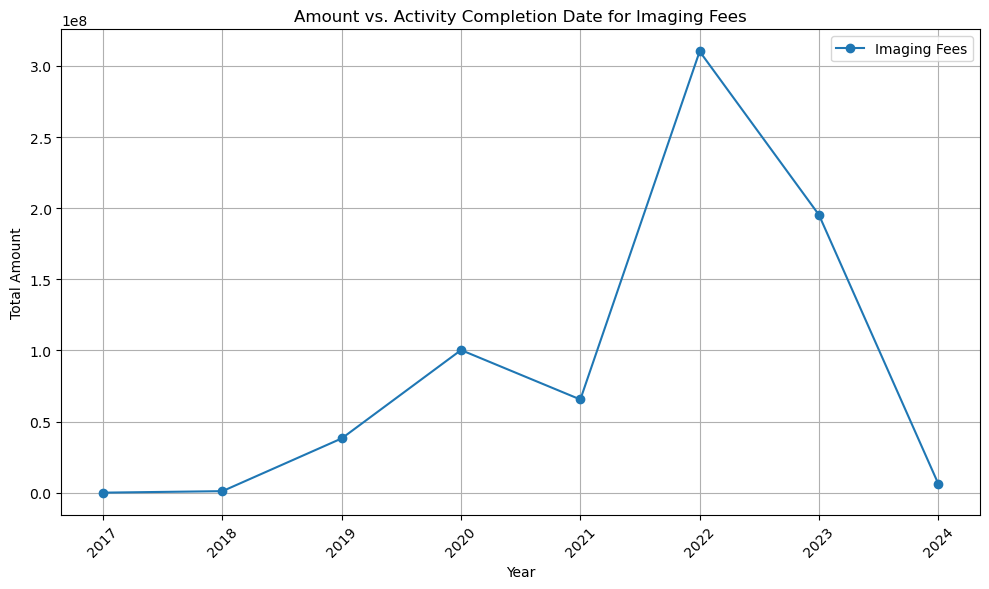

...

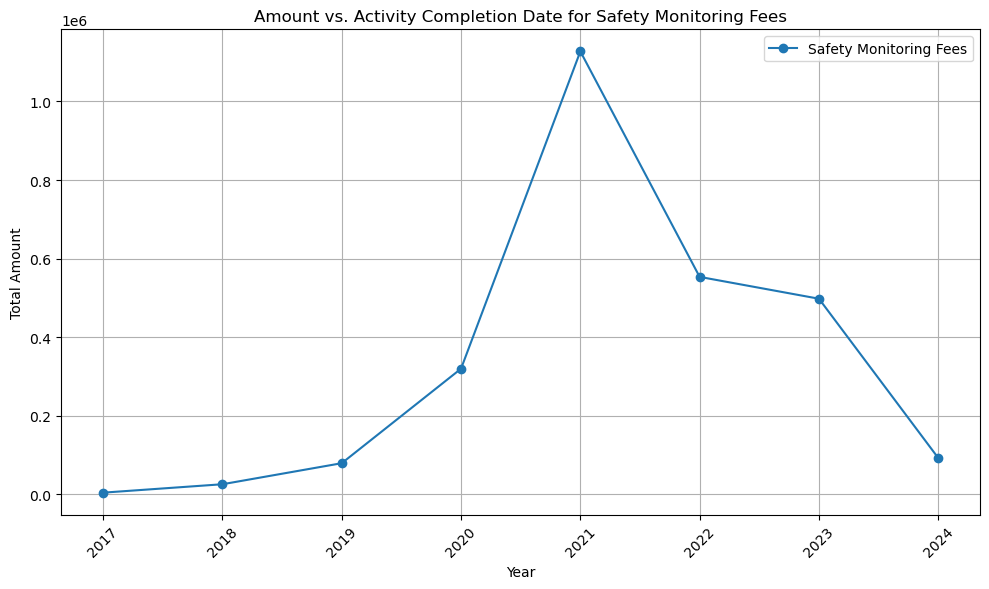

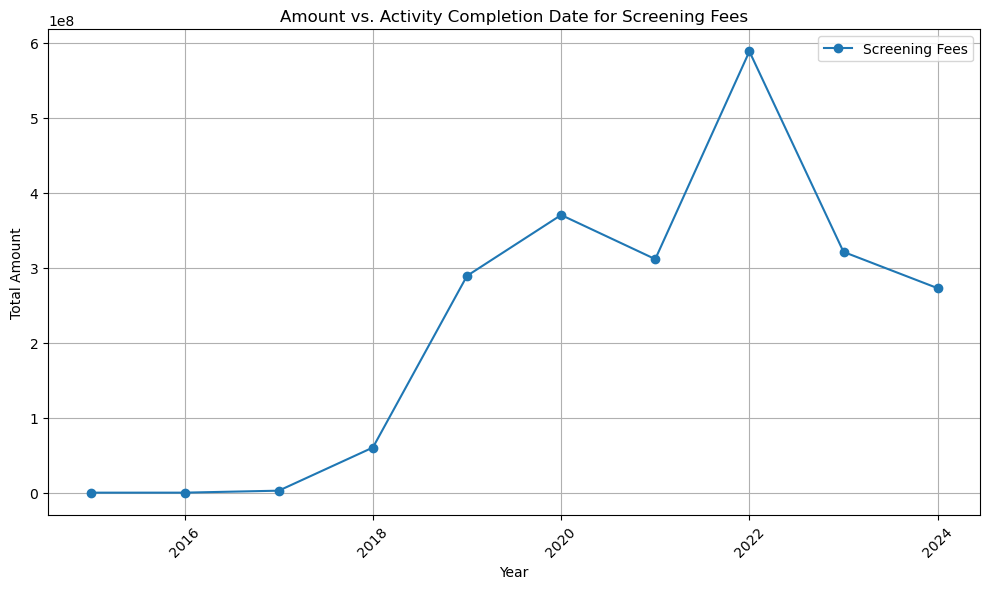

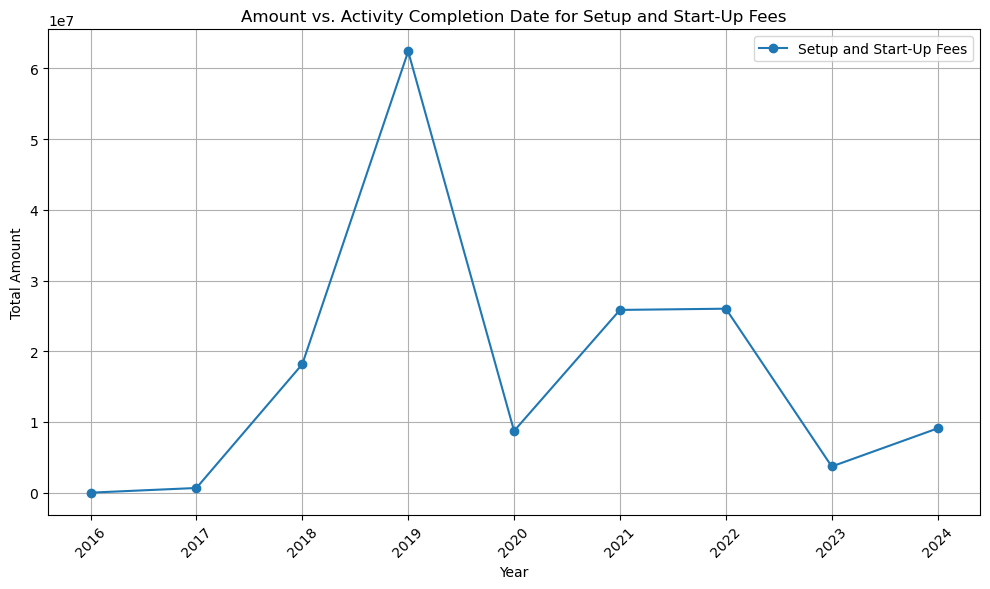

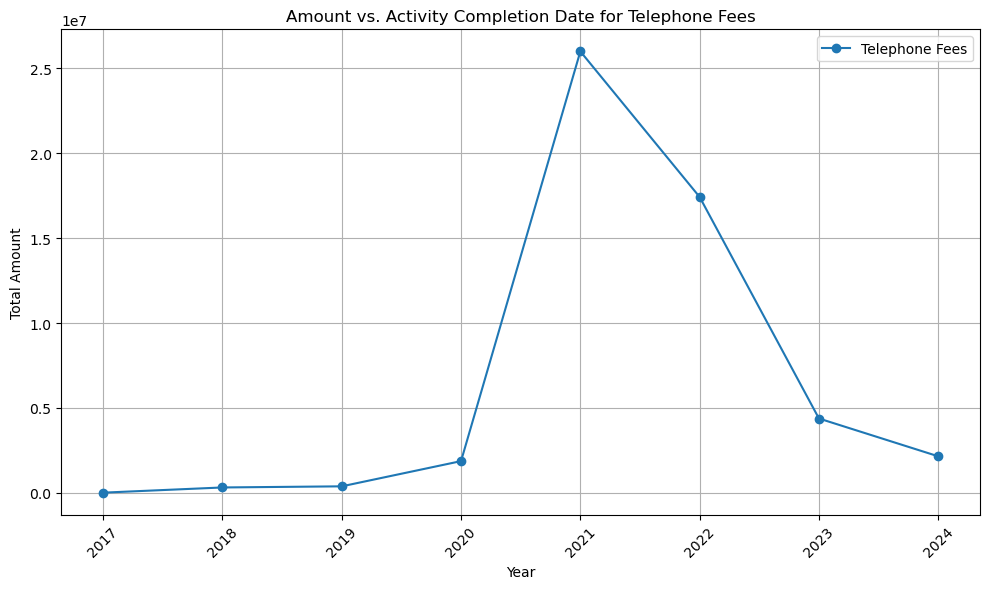

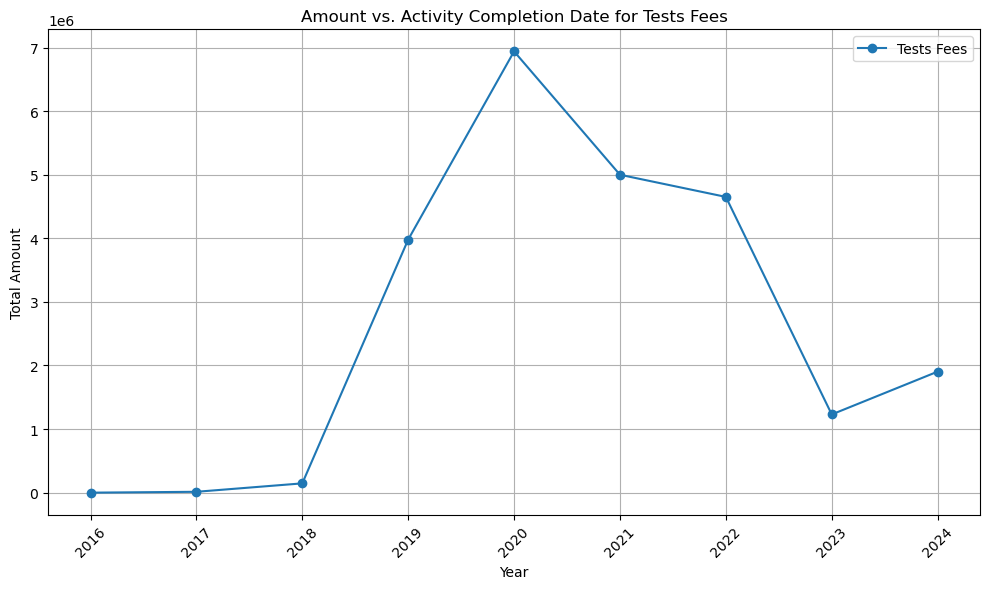

In [68]:
# Convert 'activity_completion_date' to datetime and extract year
filtered_data['activity_completion_date'] = pd.to_datetime(filtered_data['activity_completion_date'], errors='coerce')
filtered_data['year'] = filtered_data['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Plot data for each ontology separately
for category in ontologies_to_plot:
    plt.figure(figsize=(10, 6))
    data_category = filtered_data[filtered_data['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount'].sum().reset_index()
    
    # Plot the line chart
    plt.plot(data_yearly['year'], data_yearly['amount'], marker='o', label=category)
    
    plt.xlabel('Year')
    plt.ylabel('Total Amount')
    plt.title(f'Amount vs. Activity Completion Date for {category}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

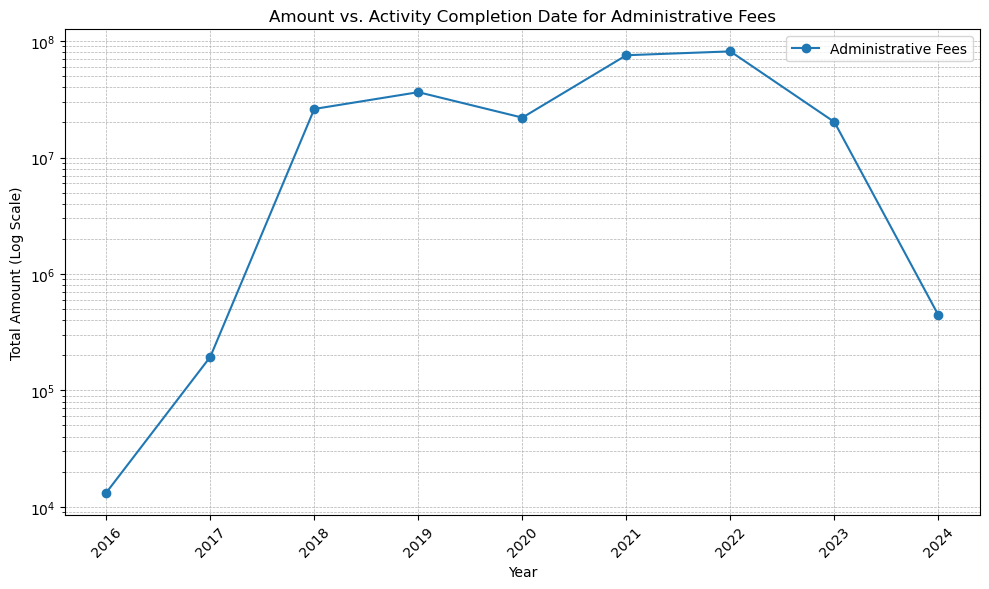

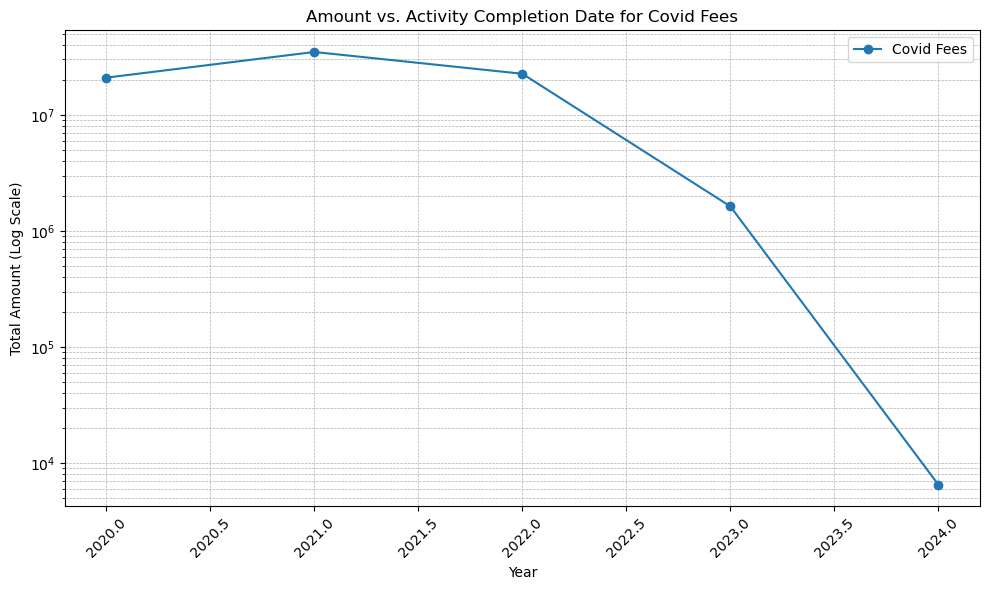

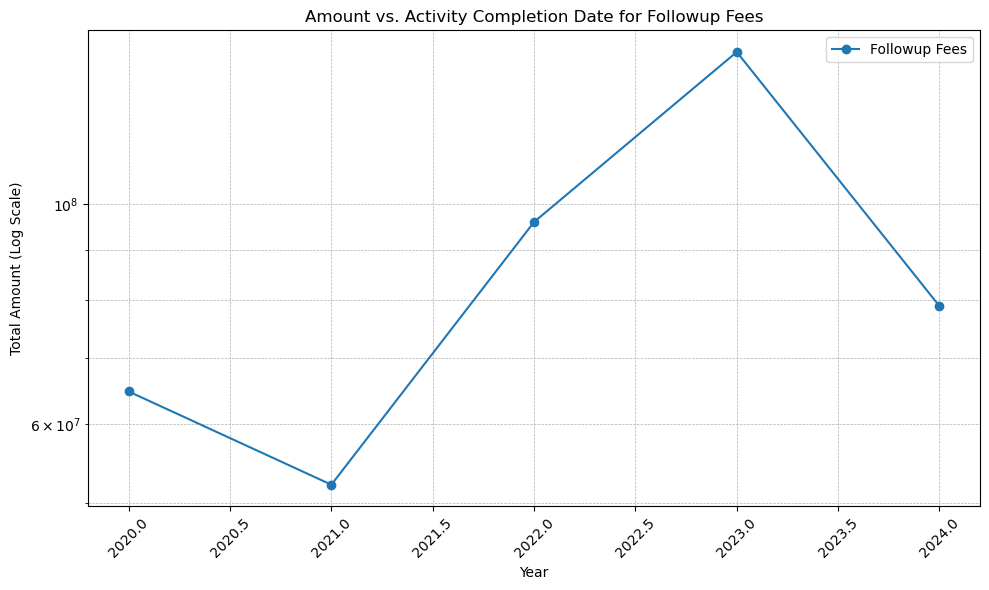

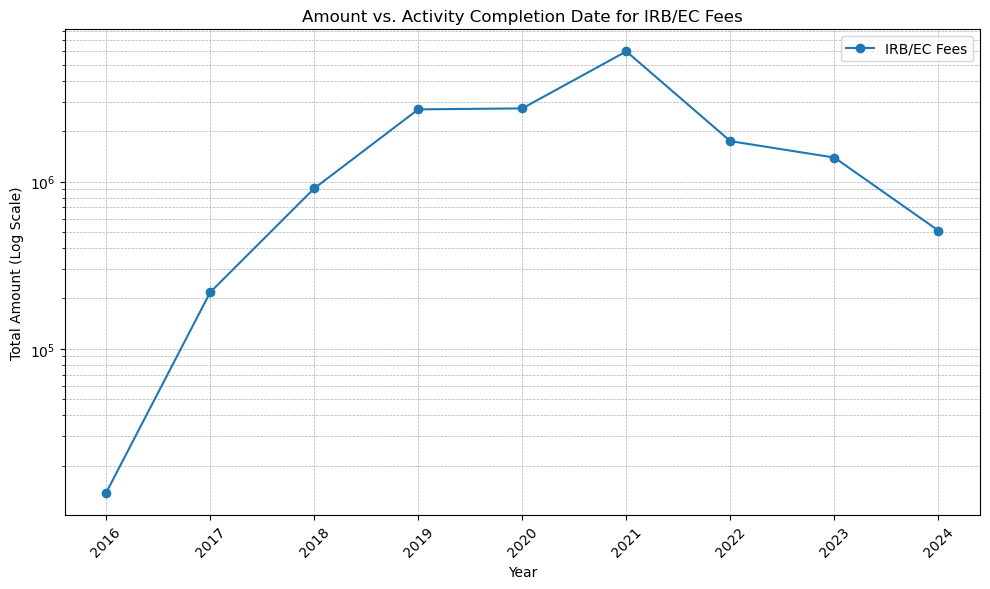

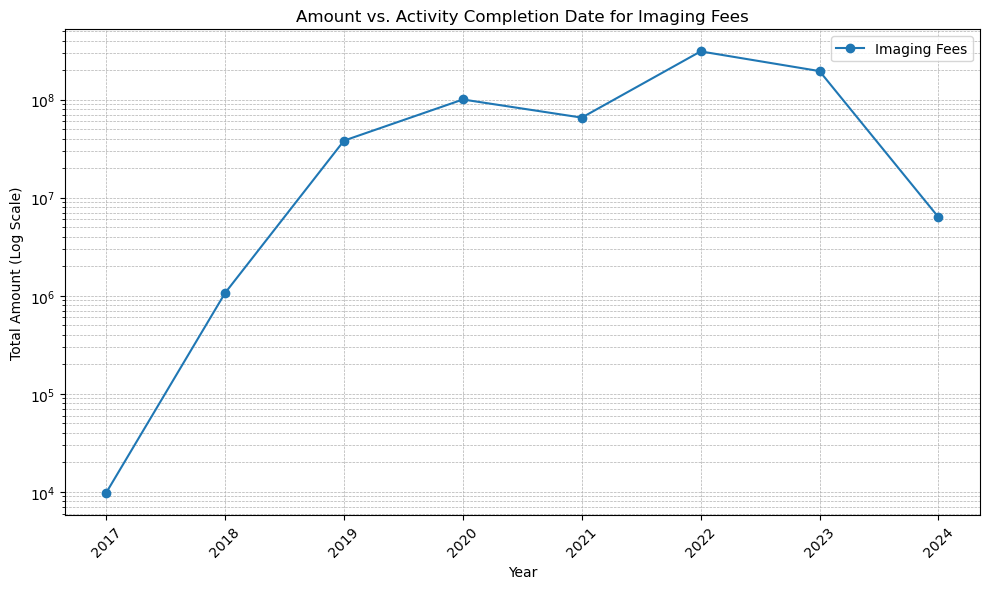

...

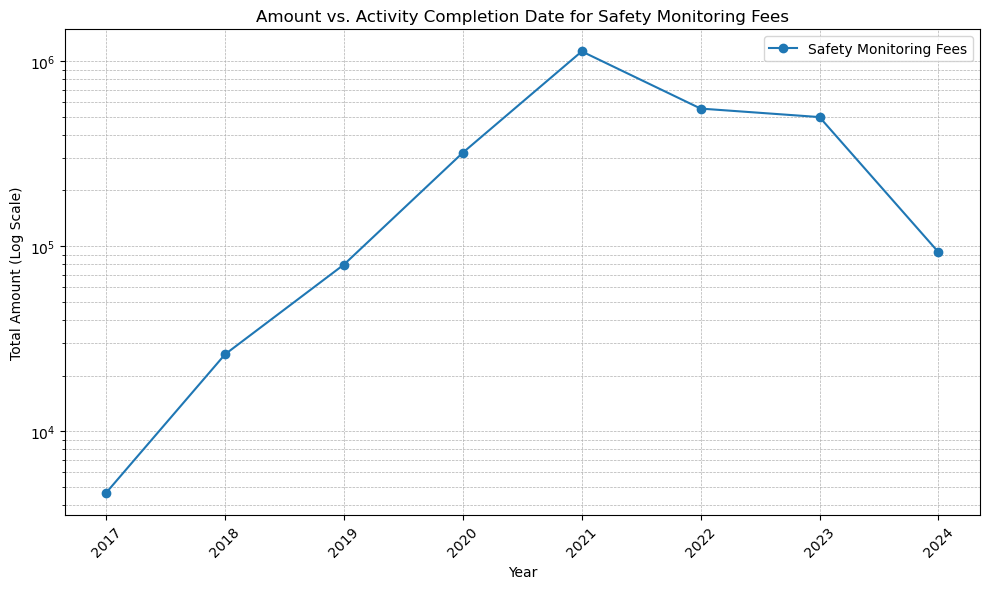

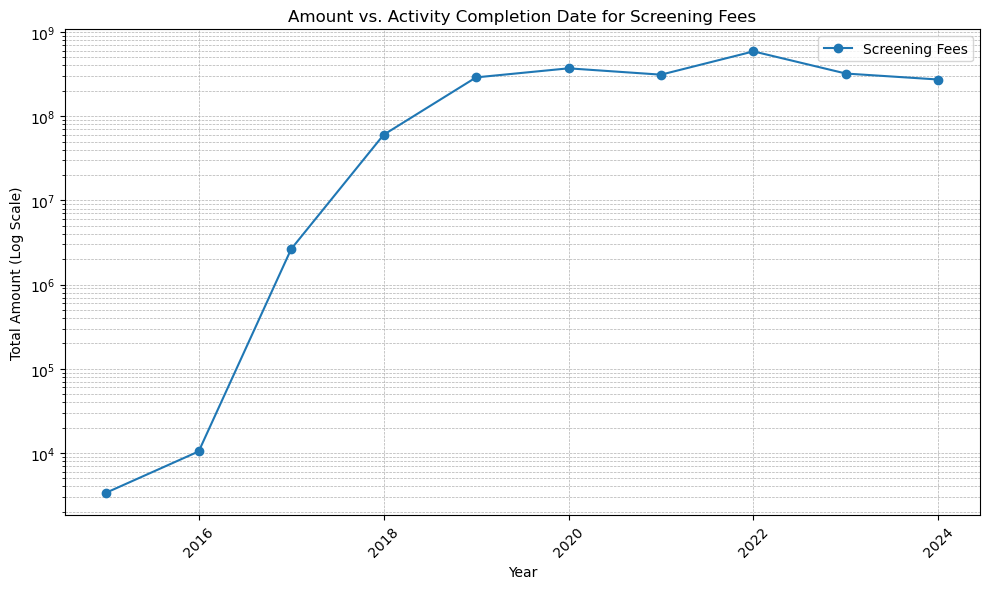

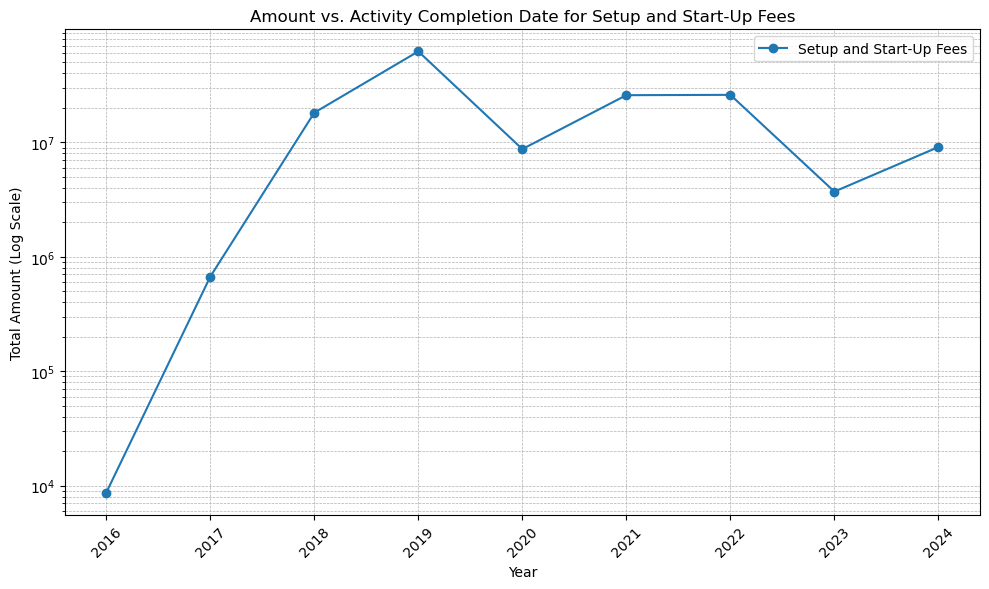

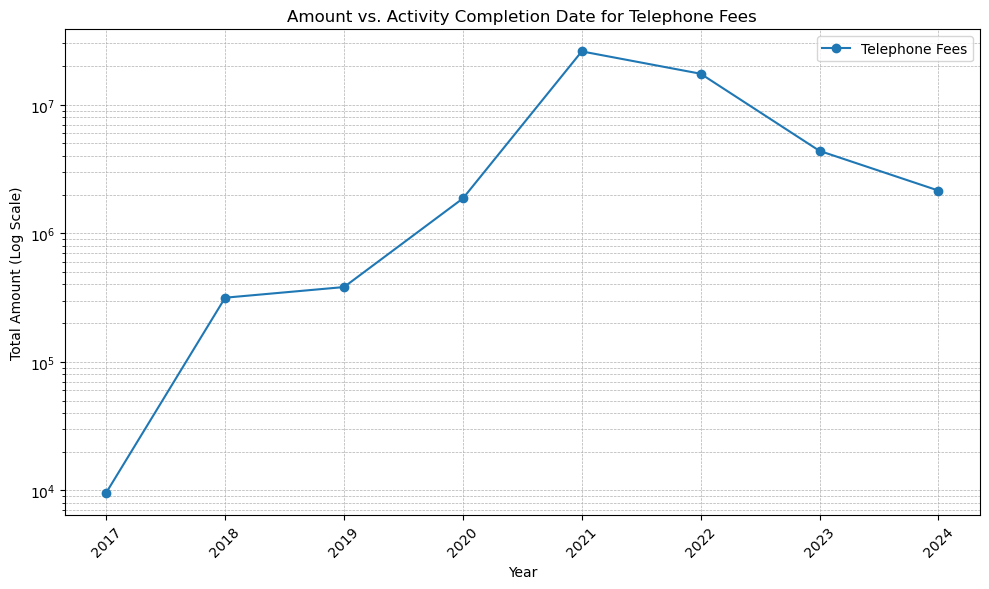

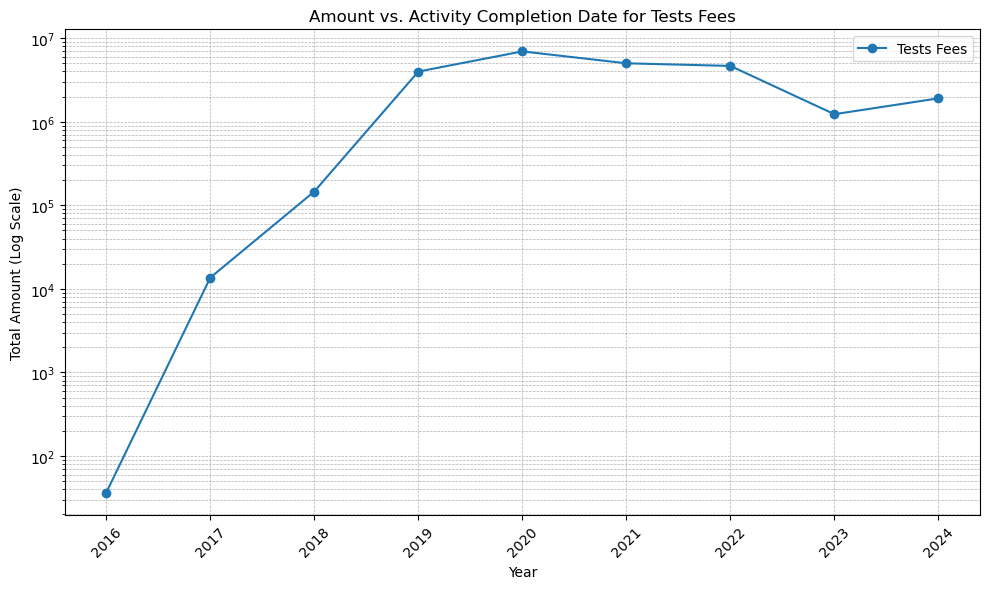

In [70]:

# Convert 'activity_completion_date' to datetime and extract year
filtered_data['activity_completion_date'] = pd.to_datetime(filtered_data['activity_completion_date'], errors='coerce')
filtered_data['year'] = filtered_data['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Plot data for each ontology separately
for category in ontologies_to_plot:
    plt.figure(figsize=(10, 6))
    data_category = filtered_data[filtered_data['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount'].sum().reset_index()
    
    # Plot the line chart with logarithmic scale
    plt.plot(data_yearly['year'], data_yearly['amount'], marker='o', label=category)
    
    plt.xlabel('Year')
    plt.ylabel('Total Amount (Log Scale)')
    plt.title(f'Amount vs. Activity Completion Date for {category}')
    plt.yscale('log')  # Apply logarithmic scale
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

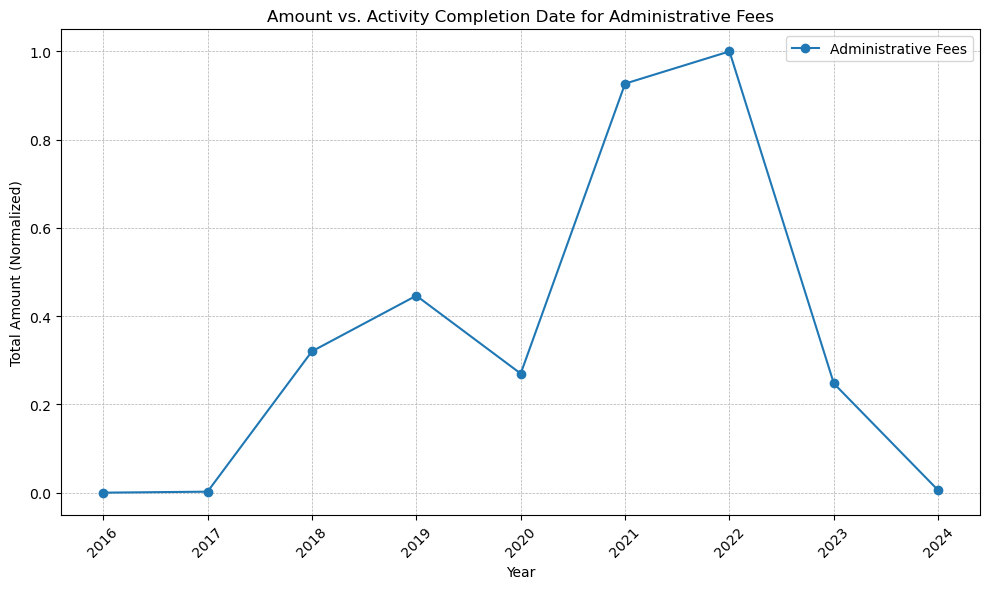

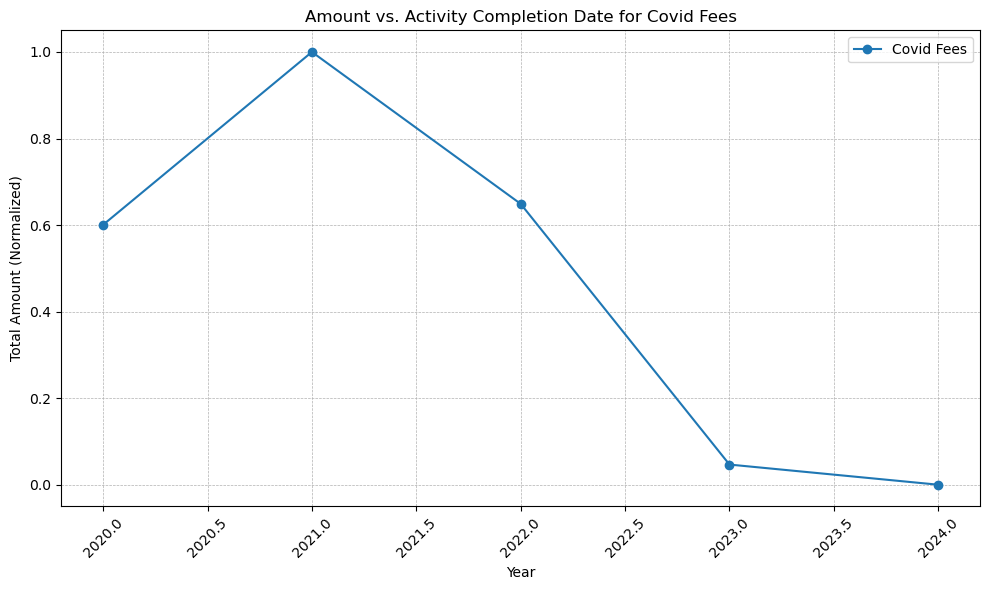

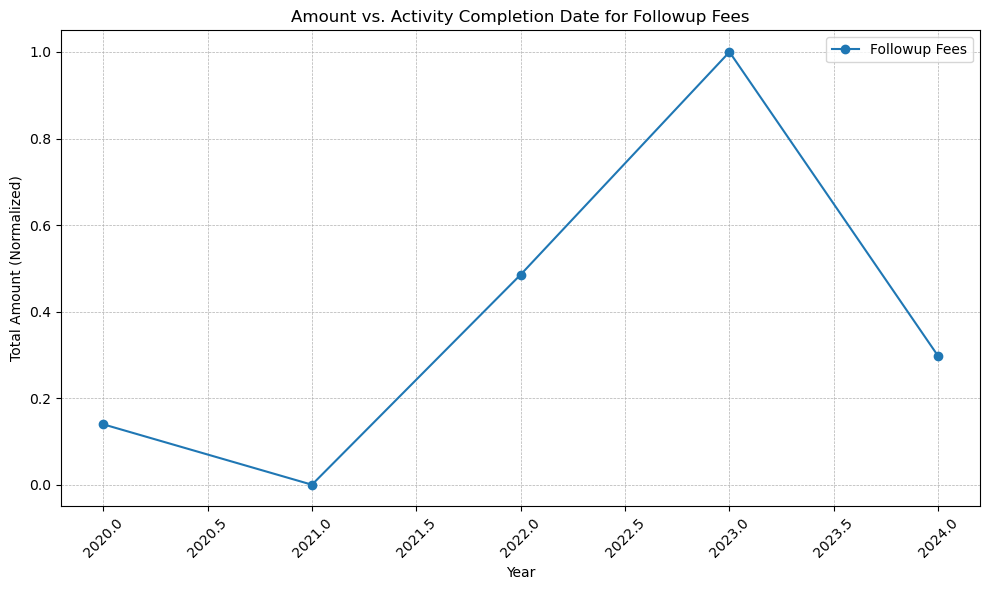

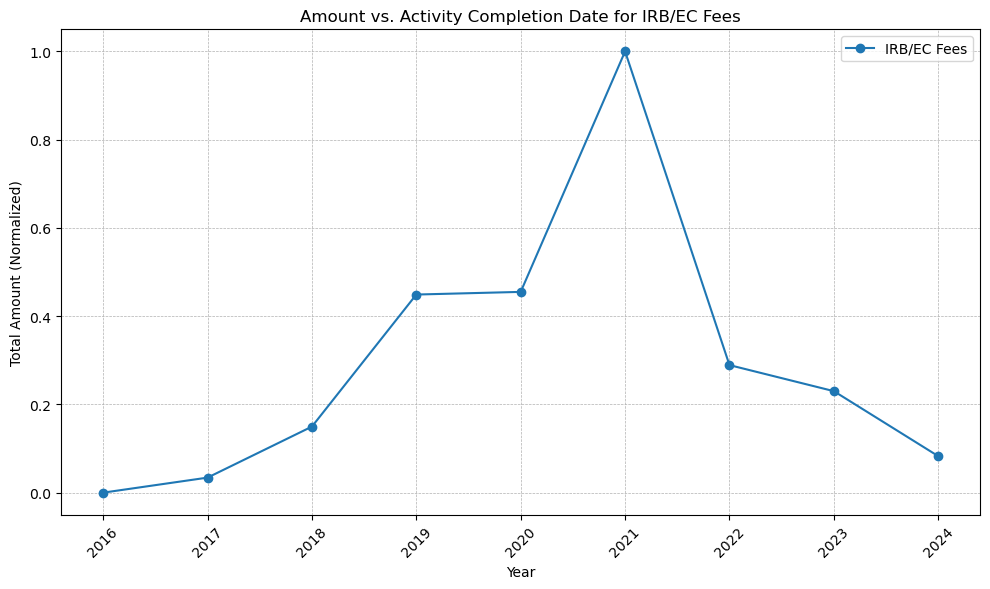

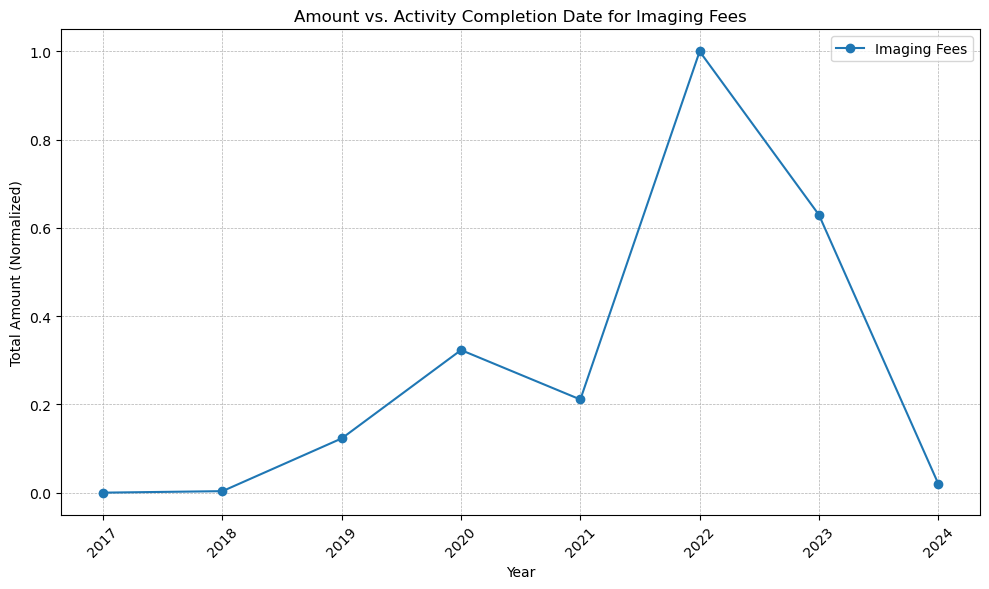

...

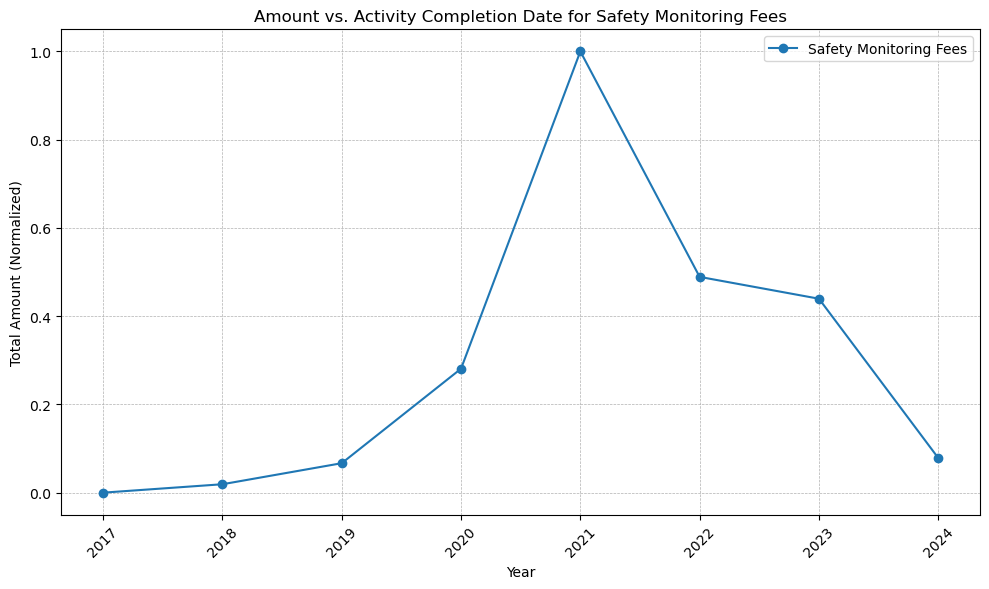

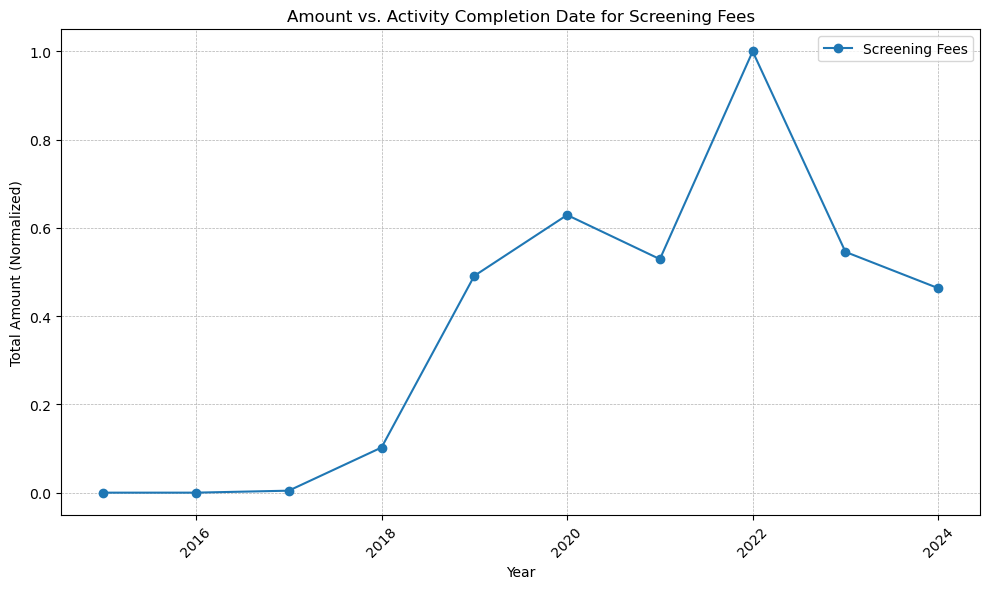

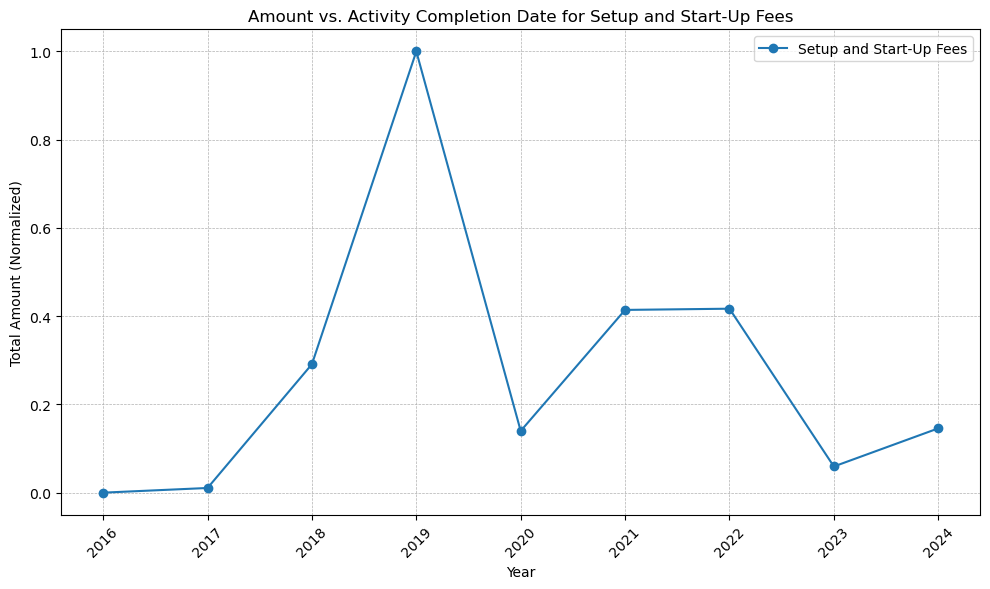

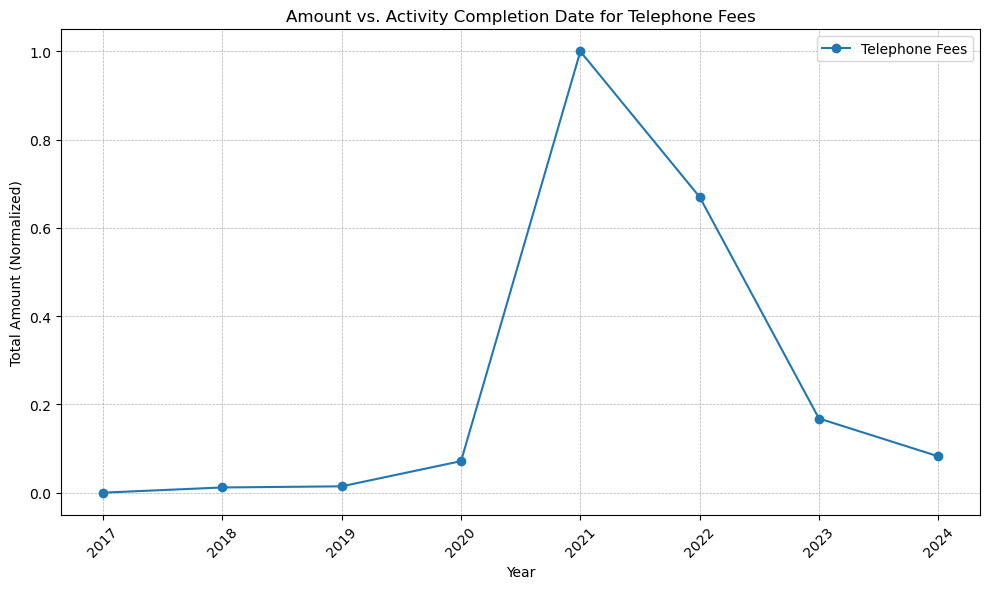

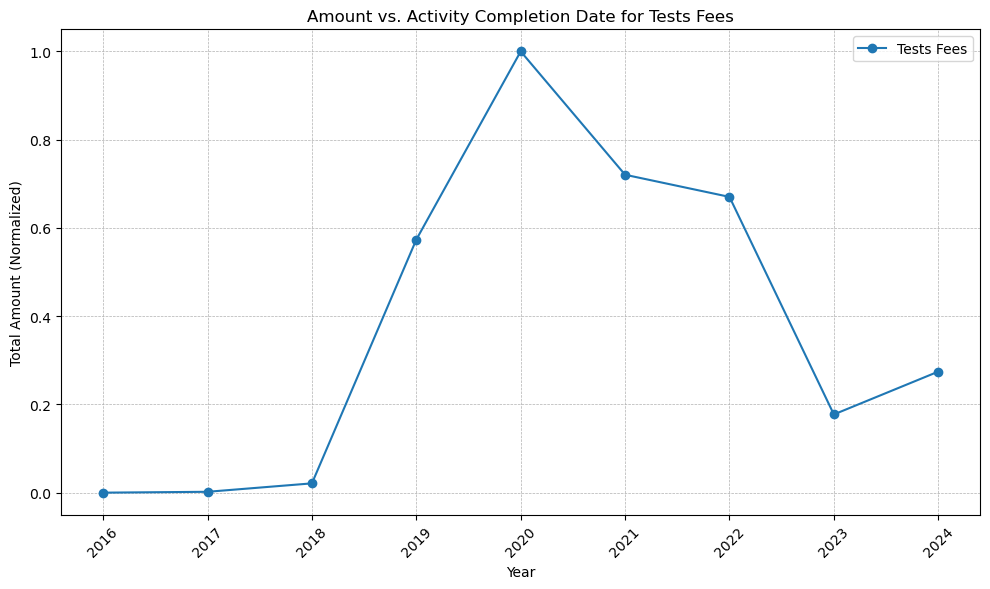

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler 



# Convert 'activity_completion_date' to datetime and extract year
filtered_data['activity_completion_date'] = pd.to_datetime(filtered_data['activity_completion_date'], errors='coerce')
filtered_data['year'] = filtered_data['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Plot data for each ontology separately
for category in ontologies_to_plot:
    plt.figure(figsize=(10, 6))
    data_category = filtered_data[filtered_data['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount'].sum().reset_index()
    
    # Normalize the amount
    scaler = MinMaxScaler()
    data_yearly['amount_normalized'] = scaler.fit_transform(data_yearly[['amount']])
    
    # Plot the line chart with normalized data
    plt.plot(data_yearly['year'], data_yearly['amount_normalized'], marker='o', label=category)
    
    plt.xlabel('Year')
    plt.ylabel('Total Amount (Normalized)')
    plt.title(f'Amount vs. Activity Completion Date for {category}')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


<Figure size 1000x600 with 0 Axes>

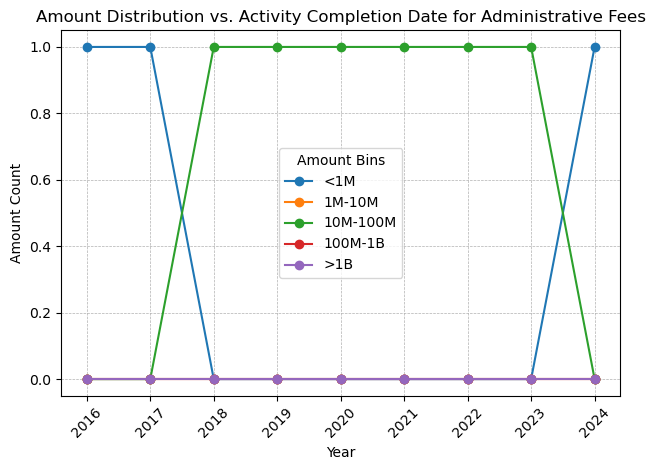

<Figure size 1000x600 with 0 Axes>

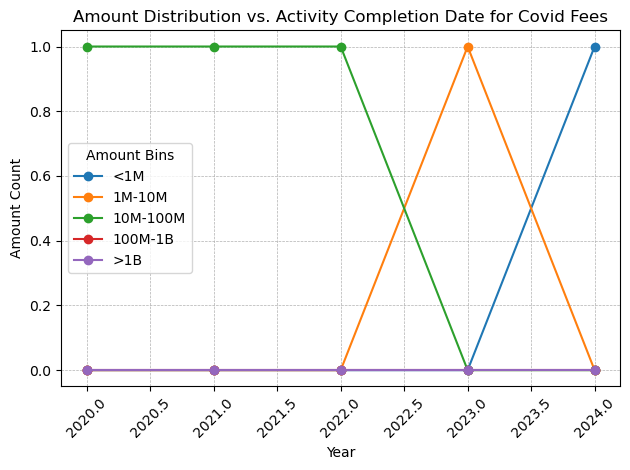

<Figure size 1000x600 with 0 Axes>

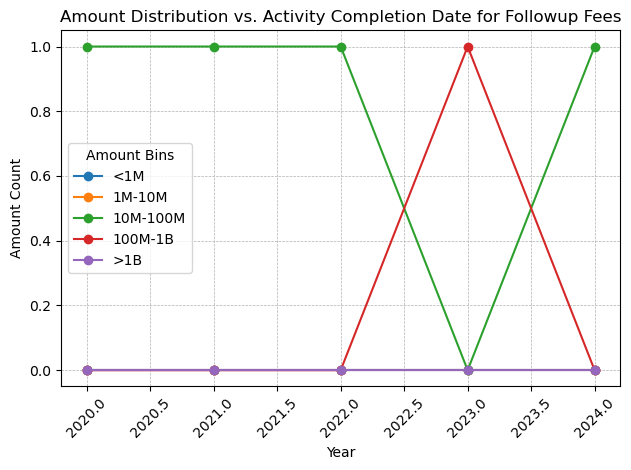

<Figure size 1000x600 with 0 Axes>

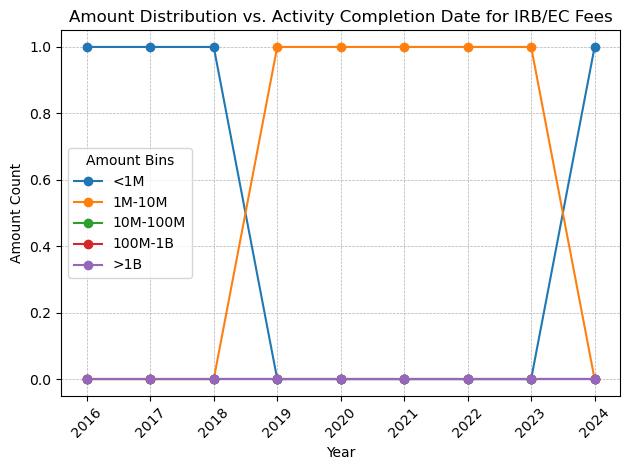

<Figure size 1000x600 with 0 Axes>

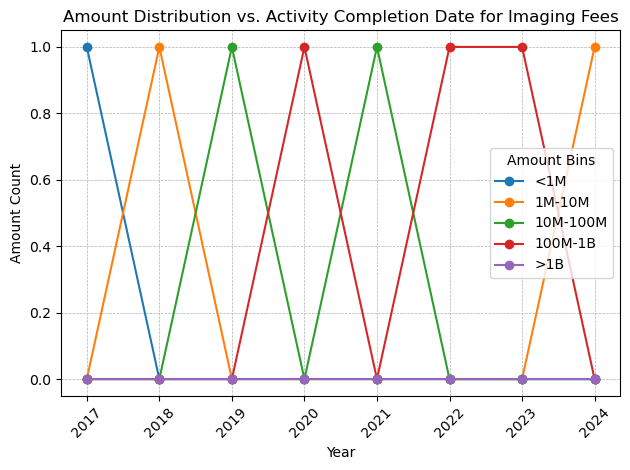

<Figure size 1000x600 with 0 Axes>

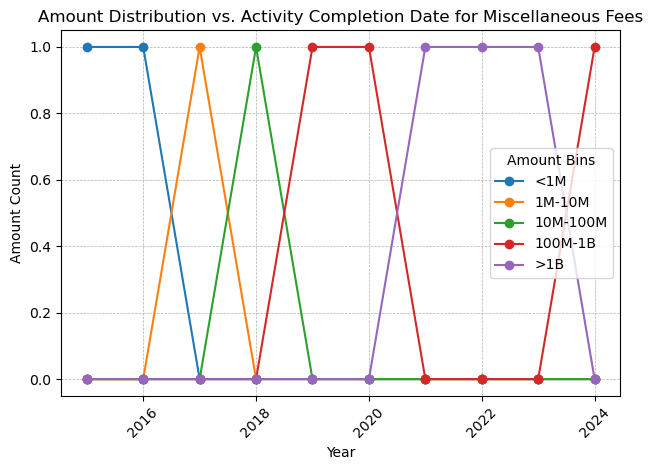

<Figure size 1000x600 with 0 Axes>

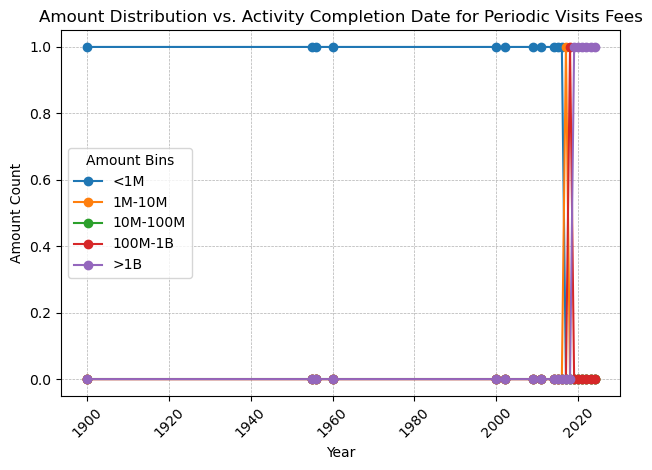

<Figure size 1000x600 with 0 Axes>

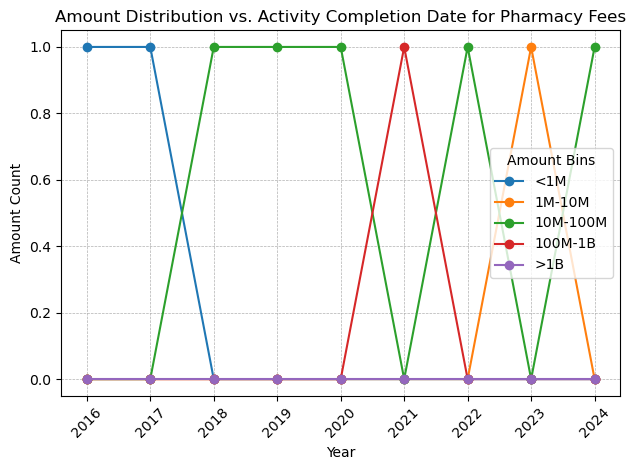

<Figure size 1000x600 with 0 Axes>

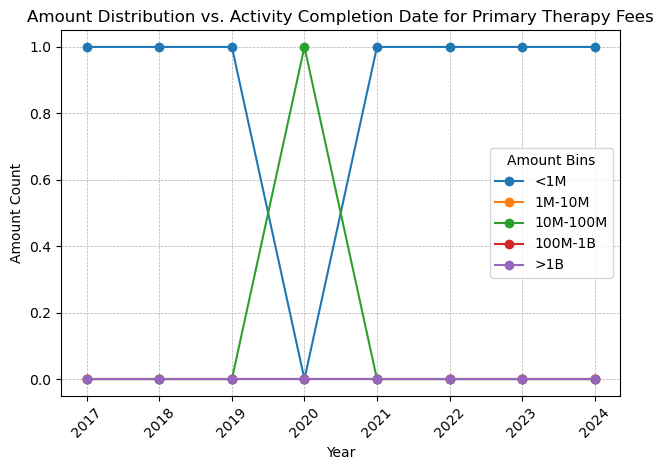

<Figure size 1000x600 with 0 Axes>

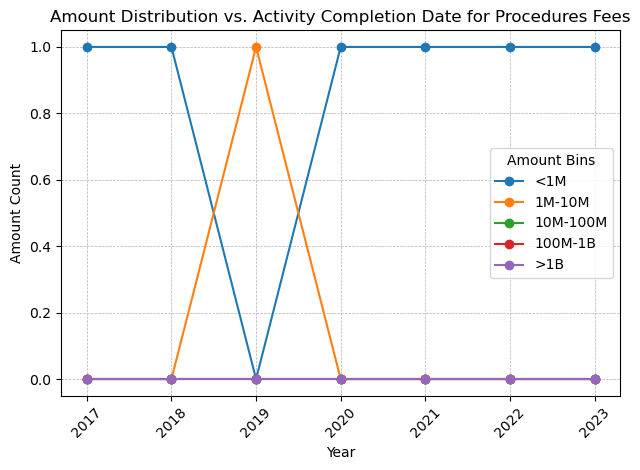

<Figure size 1000x600 with 0 Axes>

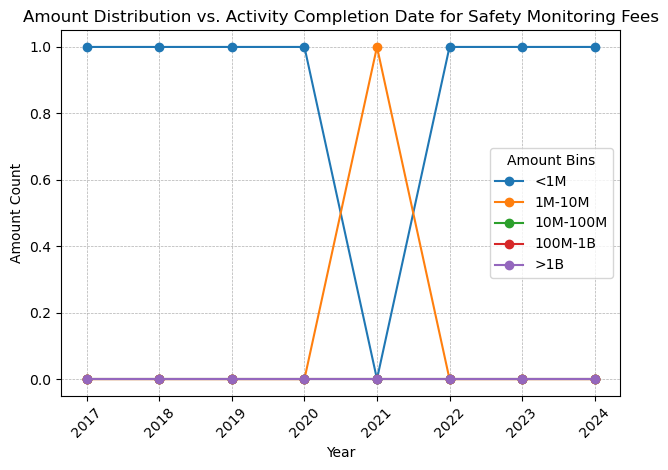

<Figure size 1000x600 with 0 Axes>

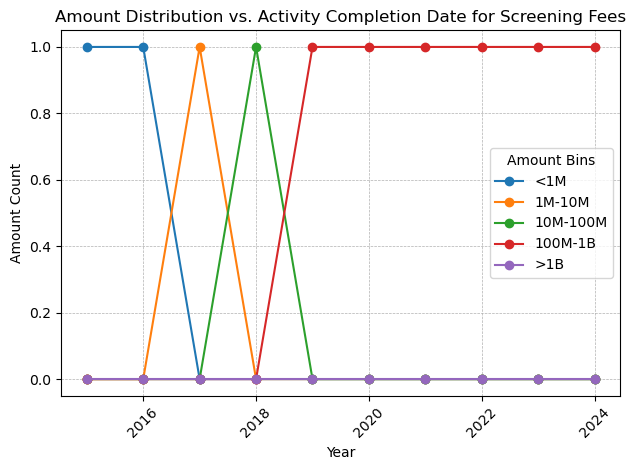

<Figure size 1000x600 with 0 Axes>

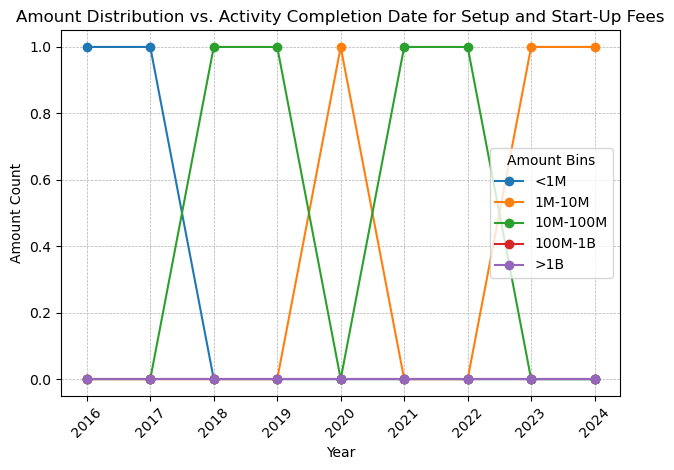

<Figure size 1000x600 with 0 Axes>

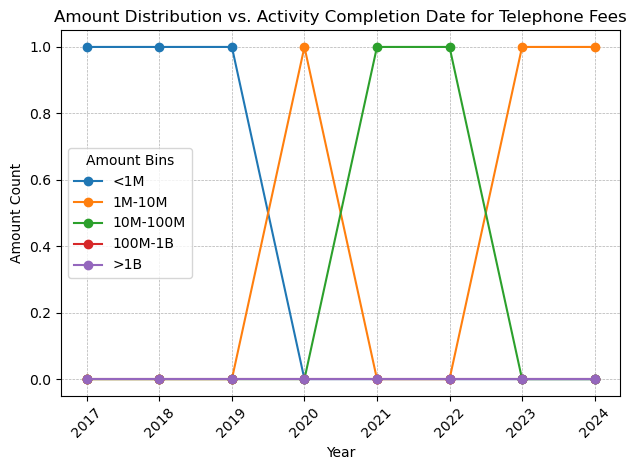

<Figure size 1000x600 with 0 Axes>

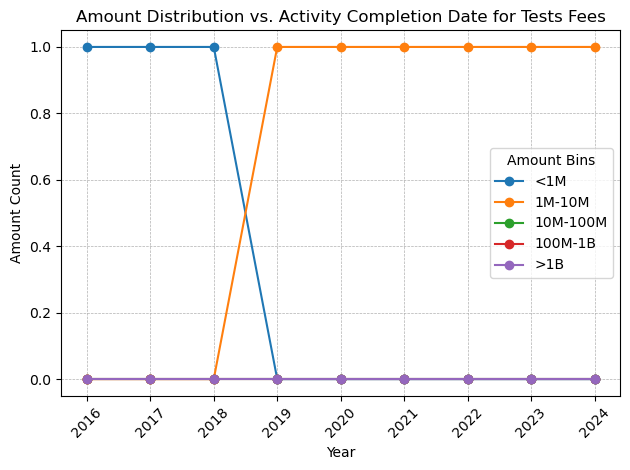

In [74]:
# Convert 'activity_completion_date' to datetime and extract year
filtered_data['activity_completion_date'] = pd.to_datetime(filtered_data['activity_completion_date'], errors='coerce')
filtered_data['year'] = filtered_data['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Plot data for each ontology separately
for category in ontologies_to_plot:
    plt.figure(figsize=(10, 6))
    data_category = filtered_data[filtered_data['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount'].sum().reset_index()
    
    # Bin the amount values into categories
    bins = [0, 1e6, 1e7, 1e8, 1e9, 1e10]
    labels = ['<1M', '1M-10M', '10M-100M', '100M-1B', '>1B']
    data_yearly['amount_bins'] = pd.cut(data_yearly['amount'], bins=bins, labels=labels, right=False)
    
    # Plot the line chart with binned data
    data_binned = data_yearly.groupby('year')['amount_bins'].value_counts().unstack().fillna(0)
    data_binned.plot(kind='line', marker='o')
    
    plt.xlabel('Year')
    plt.ylabel('Amount Count')
    plt.title(f'Amount Distribution vs. Activity Completion Date for {category}')
    plt.legend(title='Amount Bins')
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [78]:




# Define the ontologies you want to analyze
ontologies_to_analyze = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Function to calculate missing values and their percentages
def calculate_missing_values(df):
    missing_values = df.isnull().sum()
    missing_percentage = (missing_values / len(df)) * 100
    return pd.DataFrame({'Missing Values': missing_values, 'Percentage': missing_percentage})

# Calculate missing values for each ontology
missing_summary_by_ontology = {}
for category in ontologies_to_analyze:
    data_category = filtered_data[filtered_data['category'] == category]
    missing_summary_by_ontology[category] = calculate_missing_values(data_category)

# Display the missing values summary for each ontology
for category, summary in missing_summary_by_ontology.items():
    print(f"\nMissing Values Summary for {category}:")
    print(summary)



Missing Values Summary for Administrative Fees:
                            Missing Values  Percentage
cite_inv_id                              0    0.000000
gp_inv_id                                0    0.000000
cite_trial_id                            0    0.000000
gp_study_id                              0    0.000000
gp_study_name                            0    0.000000
gp_study_protocol                        0    0.000000
activity_completion_date                 0    0.000000
amount                                   0    0.000000
currency                                 0    0.000000
description                              0    0.000000
payment_id                               0    0.000000
milestone                             6266   56.051525
milestone_config_id                      0    0.000000
payment_schedule_id                      0    0.000000
record_number                         7365   65.882458
status                                   0    0.000000
subject_id      

In [86]:


# Define the imputation methods
def calculate_data_loss(df):
    # Calculate the total number of rows
    total_rows = len(df)
    
    # Calculate the missing values for each column
    missing_values = df.isnull().sum()
    missing_percentage = (missing_values / total_rows) * 100
    
    # Create a summary DataFrame
    missing_summary = pd.DataFrame({
        'Missing Values': missing_values,
        'Percentage': missing_percentage
    })
    
    return missing_summary

# Calculate missing values summary for the entire dataset
missing_summary_all = calculate_data_loss(filtered_data)
total_rows = len(filtered_data)  # Define total_rows here

# Calculate missing values summary for each ontology category
missing_summary_by_category = filtered_data.groupby('category').apply(calculate_data_loss)

# Calculate overall percentage of data loss
total_missing = missing_summary_all['Missing Values'].sum()
overall_percentage_loss = (total_missing / (total_rows * len(filtered_data.columns))) * 100

# Display the summaries
print("Missing Values Summary for Each Ontology Category:")
print(missing_summary_by_category)
print("\nOverall Percentage of Data Loss:")
print(f"{overall_percentage_loss:.2f}%")

# Display missing summary for all columns
print("\nSummary of Missing Values for All Columns:")
print(missing_summary_all)


Missing Values Summary for Each Ontology Category:
                                       Missing Values  Percentage
category                                                         
Administrative Fees  cite_inv_id                    0         0.0
                     gp_inv_id                      0         0.0
                     cite_trial_id                  0         0.0
                     gp_study_id                    0         0.0
                     gp_study_name                  0         0.0
...                                               ...         ...
Travel Reimbursement organization_id                0         0.0
                     country_name                   0         0.0
                     person_id                      0         0.0
                     ctc_created_date               0         0.0
                     ctc_mod_date                   0         0.0

[648 rows x 2 columns]

Overall Percentage of Data Loss:
3.61%

Summary of Missing Values 

In [ ]:
# Define the imputation methods
def impute_missing_values(df):
    # Numerical columns
    numerical_cols = ['amount', 'amount_usd', 'actual_acctual', 'tt_primary_completion_date']
    for col in numerical_cols:
        if df[col].isnull().sum() > 0:
            median_value = df[col].median()
            df[col].fillna(median_value, inplace=True)

    # Categorical columns
    categorical_cols = ['milestone', 'subject_id', 'record_number', 'industry', 'organization_id', 
                        'country_name', 'person_id', 'ctc_created_date', 'ctc_mod_date']
    for col in categorical_cols:
        if df[col].isnull().sum() > 0:
            mode_value = df[col].mode()[0]
            df[col].fillna(mode_value, inplace=True)

    # Date columns
    date_cols = ['activity_completion_date', 'tt_created_date', 'tt_start_date']
    for col in date_cols:
        if df[col].isnull().sum() > 0:
            df[col] = pd.to_datetime(df[col], errors='coerce')
            df[col].fillna(method='ffill', inplace=True)  # Forward fill

    return df

# Apply imputation
imputed_data = impute_missing_values(filtered_data)

# Save the imputed dataset
imputed_output_path = '/Users/armughan/Downloads/Analyze_New_Data_Imputed.csv'
imputed_data.to_csv(imputed_output_path, index=False)

print(f"Imputed dataset saved to {imputed_output_path}")

In [110]:
import pandas as pd

# Load the data
output_path = '/Users/armughan/Downloads/Analyze_New_Data.csv'
df = pd.read_csv(output_path, low_memory=False)

# 1. Convert 'milestone' to numeric, forcing errors to NaN
df['milestone'] = pd.to_numeric(df['milestone'], errors='coerce')

# 2. Impute numeric columns with mean (only if they contain numeric data)
df['milestone'] = df['milestone'].fillna(df['milestone'].mean())
df['amount_usd'] = df['amount_usd'].fillna(df['amount_usd'].mean())

# 3. Impute categorical columns with mode
df['record_number'] = df['record_number'].fillna(df['record_number'].mode()[0])
df['subject_id'] = df['subject_id'].fillna(df['subject_id'].mode()[0])

# 4. Forward fill or backward fill for date columns
df['tt_primary_completion_date'] = df['tt_primary_completion_date'].fillna(method='ffill')

# 5. Interpolate missing values for time series data
df['amount_usd'] = df['amount_usd'].interpolate(method='linear')

# 6. Impute with a constant value
df['milestone'] = df['milestone'].fillna(-1)



missing_values_summary = df.isnull().sum()

# Define the ontology columns to check for missing values
ontology_columns = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees', 
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees', 
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 
    'Setup and Start-Up Fees', 'Telephone Fees', 'Tests Fees'
]

# Filter the missing values summary to only include existing ontology columns
existing_ontology_columns = [col for col in ontology_columns if col in missing_values_summary.index]
ontology_missing_values_summary = missing_values_summary[existing_ontology_columns]

print(ontology_missing_values_summary)

# 9. Save the imputed DataFrame to a new CSV file
imputed_output_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df.to_csv(imputed_output_path, index=False)


Series([], dtype: int64)


/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/3359519684.py:6: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(imputed_file_path)


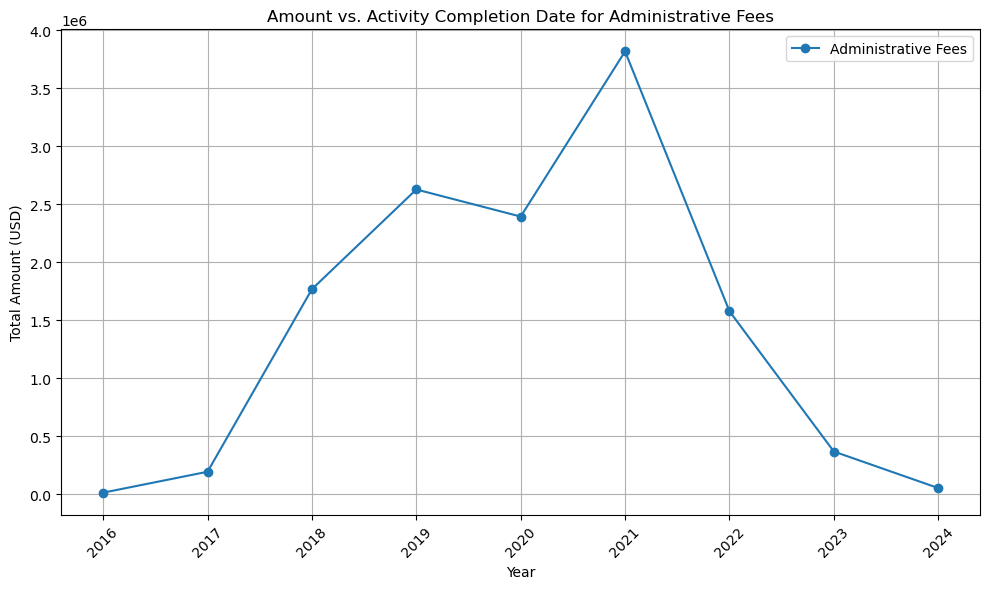

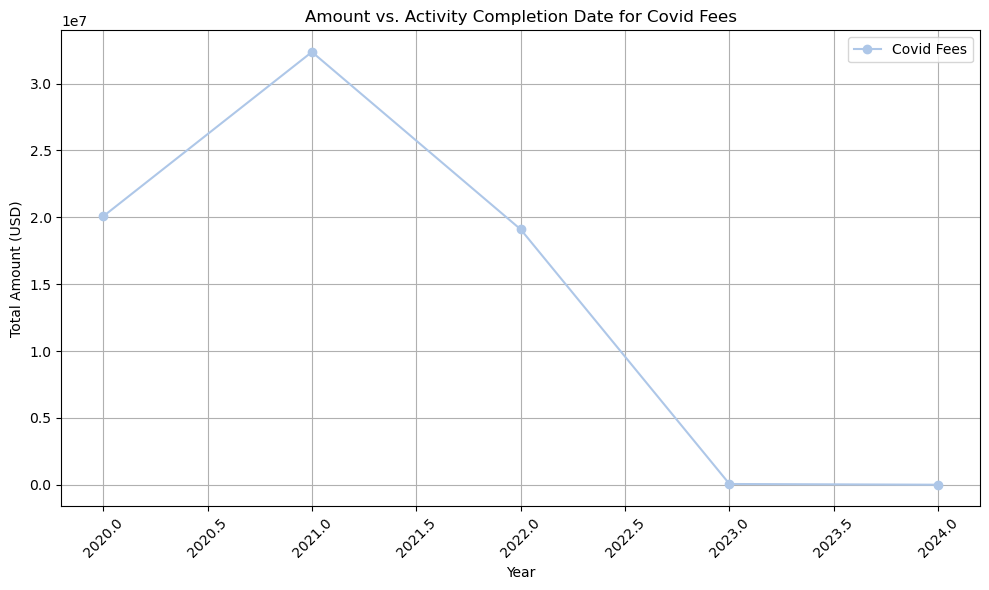

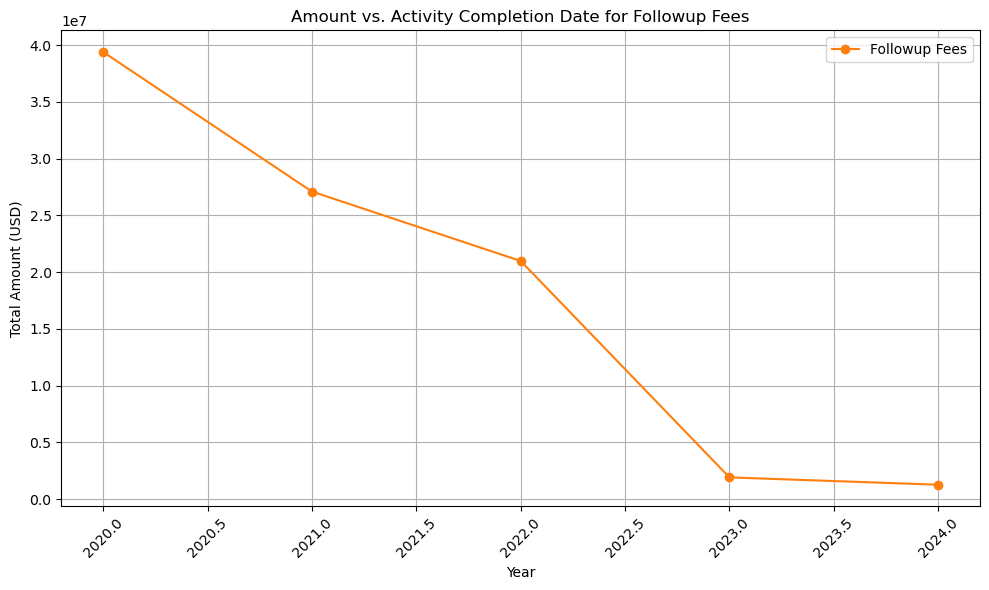

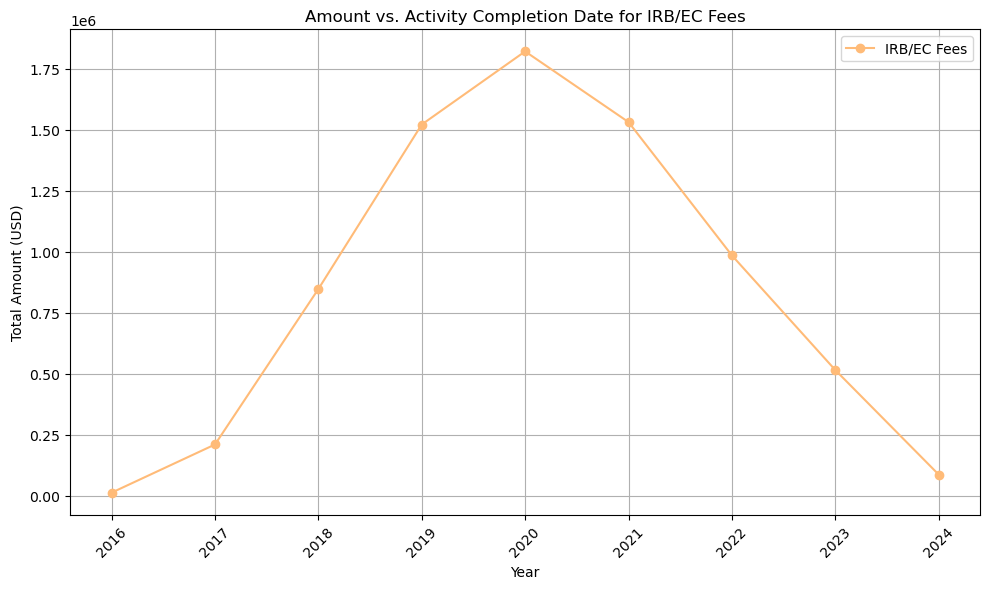

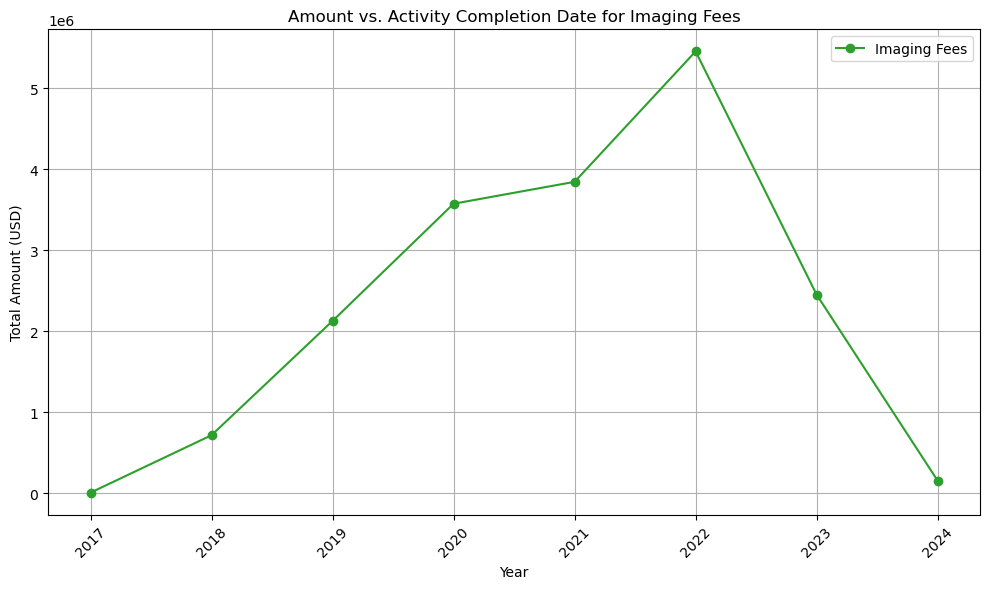

...

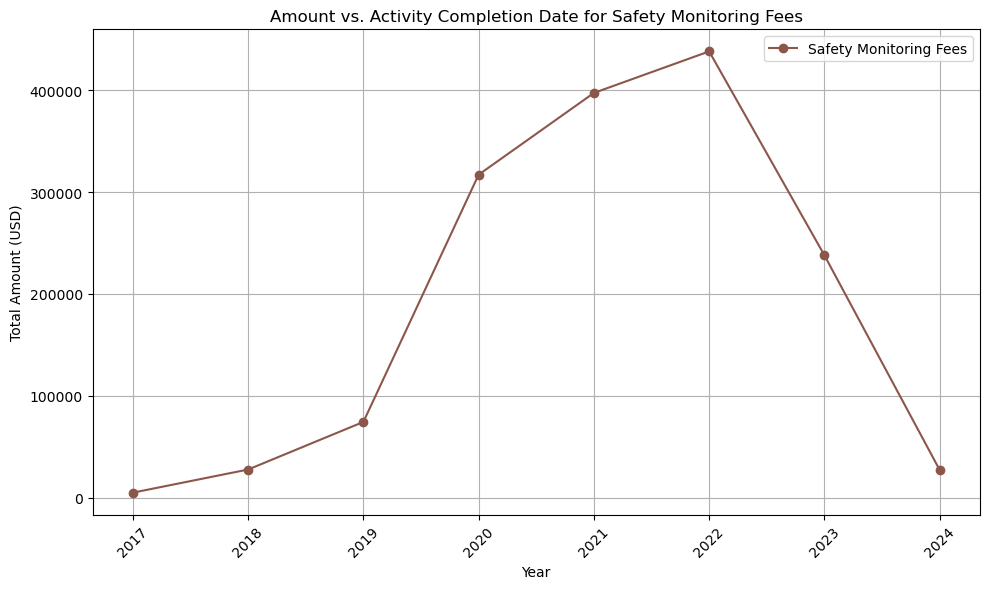

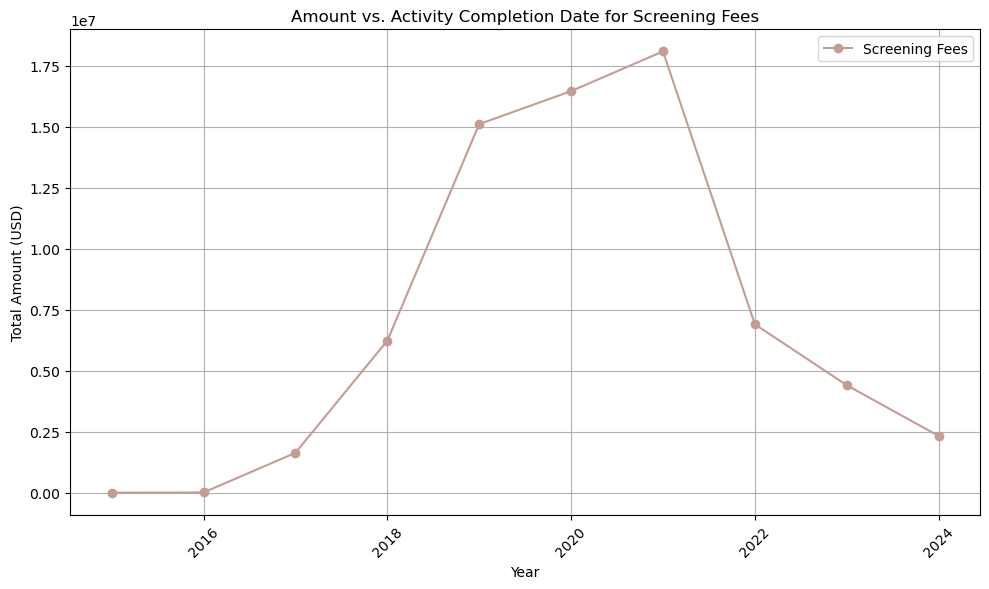

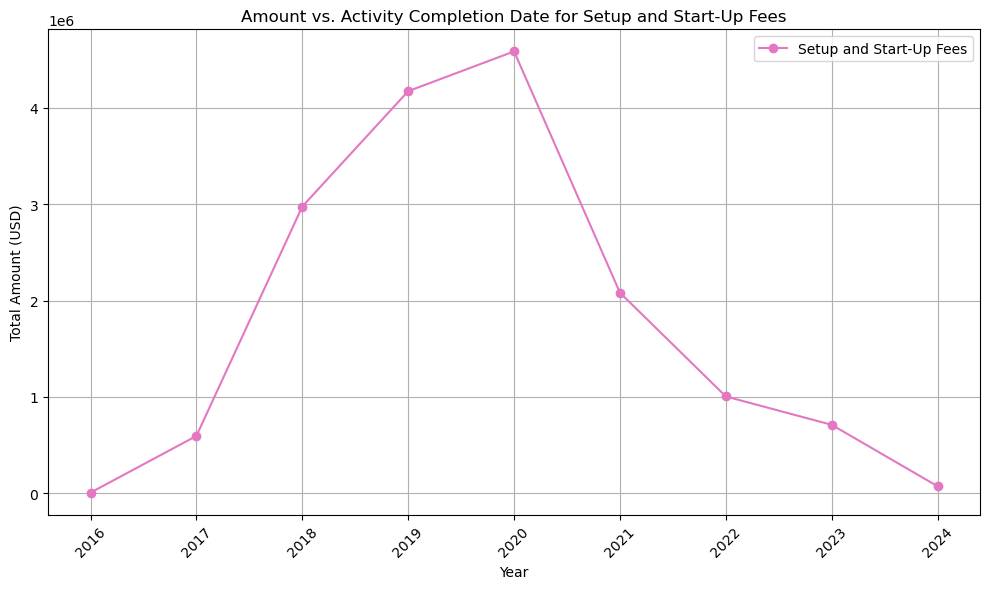

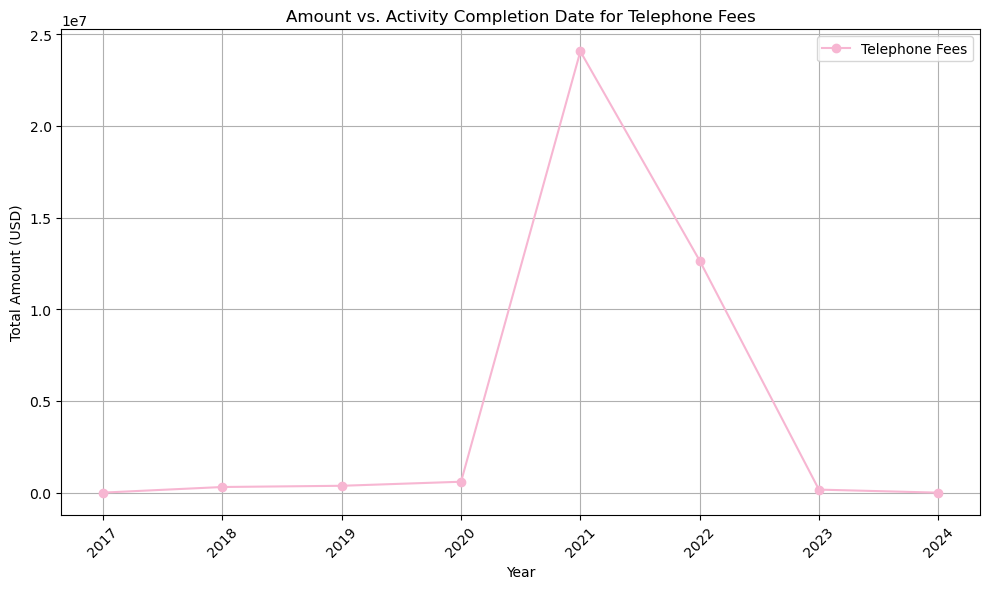

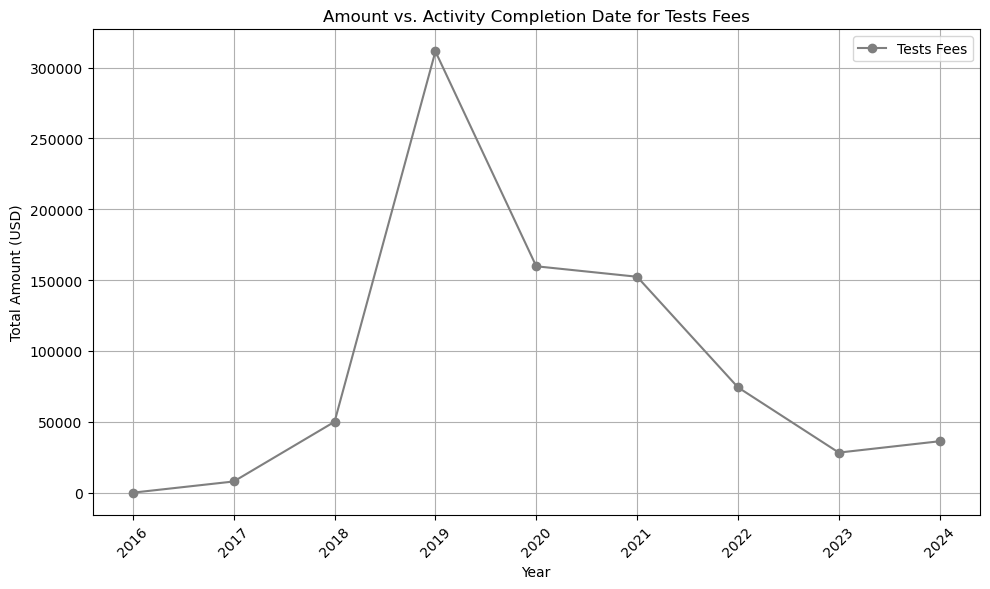

In [118]:
import pandas as pd
import matplotlib.pyplot as plt

# Read the imputed CSV file
imputed_file_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df = pd.read_csv(imputed_file_path)

# Convert 'activity_completion_date' to datetime and extract year
df['activity_completion_date'] = pd.to_datetime(df['activity_completion_date'], errors='coerce')
df['year'] = df['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]


colors = plt.cm.tab20.colors  # Using a colormap for a variety of colors

# Plot data for each ontology separately
for i, category in enumerate(ontologies_to_plot):
    plt.figure(figsize=(10, 6))
    data_category = df[df['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount_usd'].sum().reset_index()
    
    # Plot the line chart with a specific color
    plt.plot(data_yearly['year'], data_yearly['amount_usd'], marker='o', color=colors[i % len(colors)], label=category)
    
    plt.xlabel('Year')
    plt.ylabel('Total Amount (USD)')
    plt.title(f'Amount vs. Activity Completion Date for {category}')
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/3680603873.py:3: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(imputed_file_path)


<Figure size 1000x600 with 0 Axes>

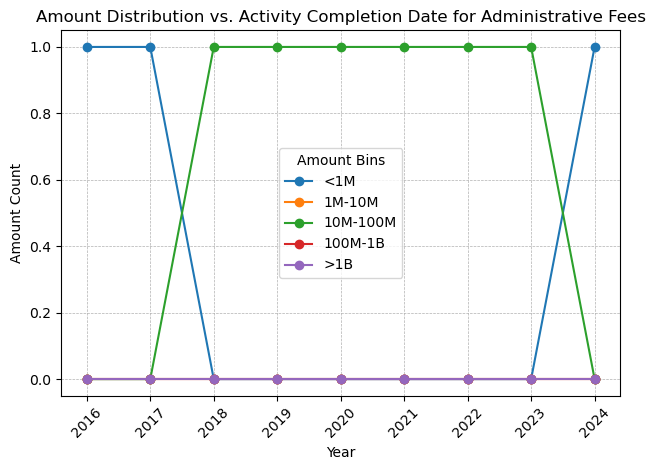

<Figure size 1000x600 with 0 Axes>

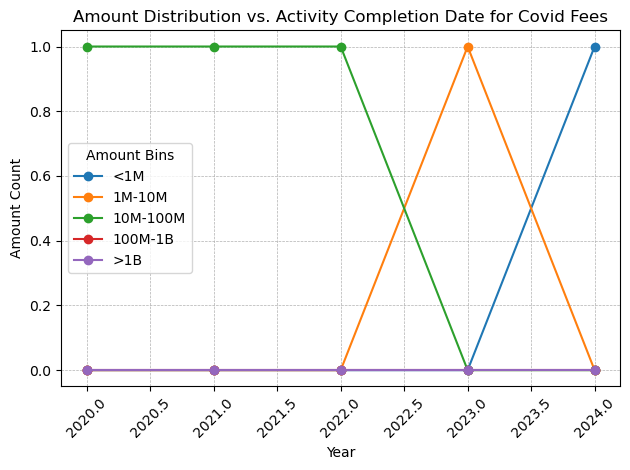

<Figure size 1000x600 with 0 Axes>

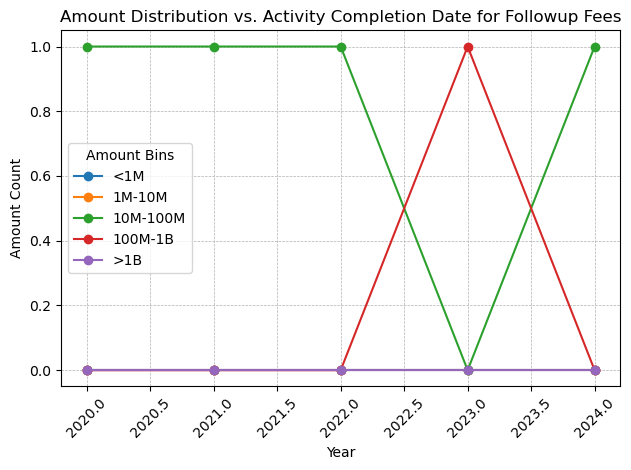

<Figure size 1000x600 with 0 Axes>

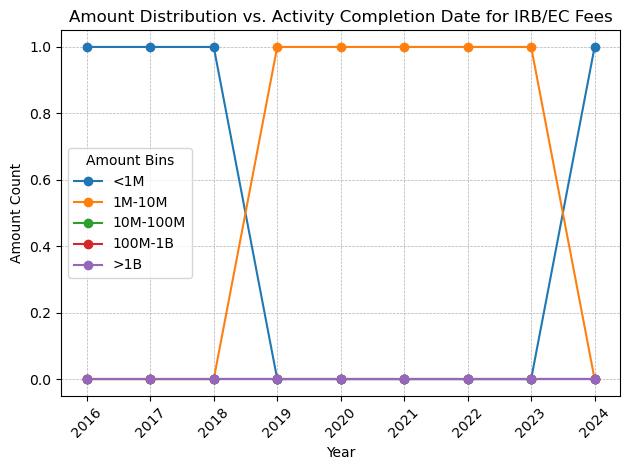

<Figure size 1000x600 with 0 Axes>

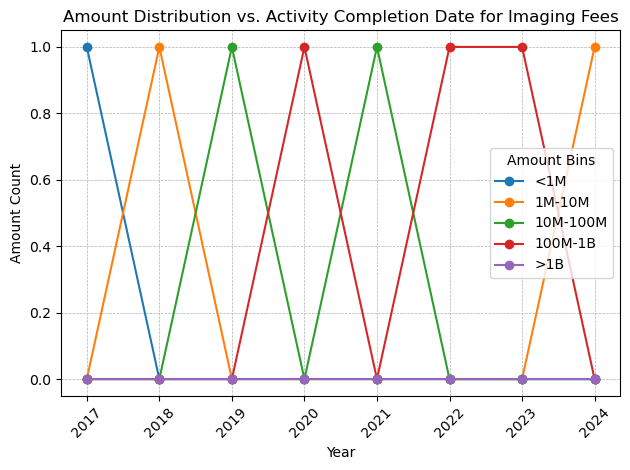

<Figure size 1000x600 with 0 Axes>

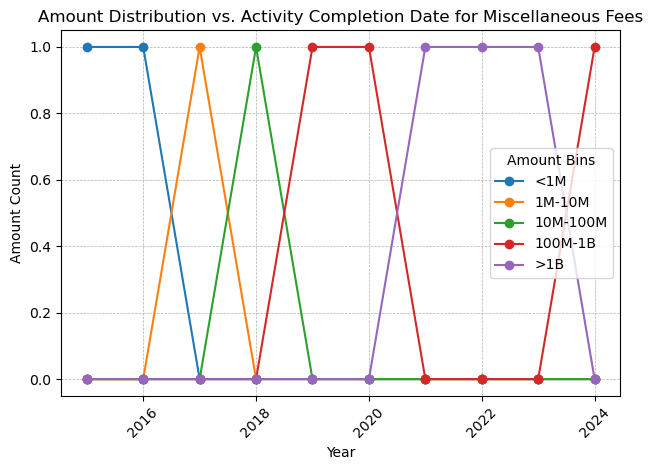

<Figure size 1000x600 with 0 Axes>

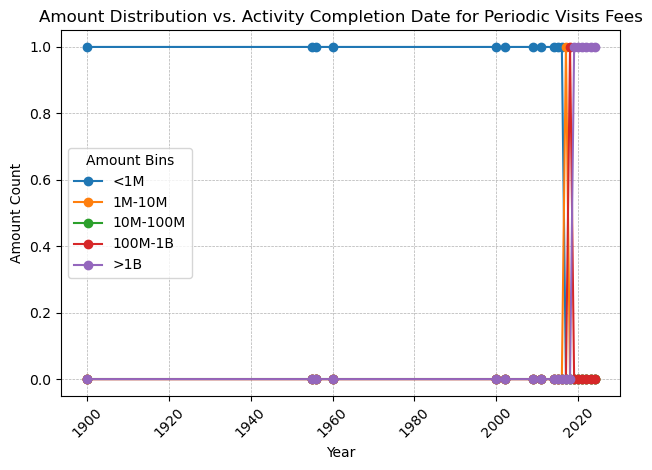

<Figure size 1000x600 with 0 Axes>

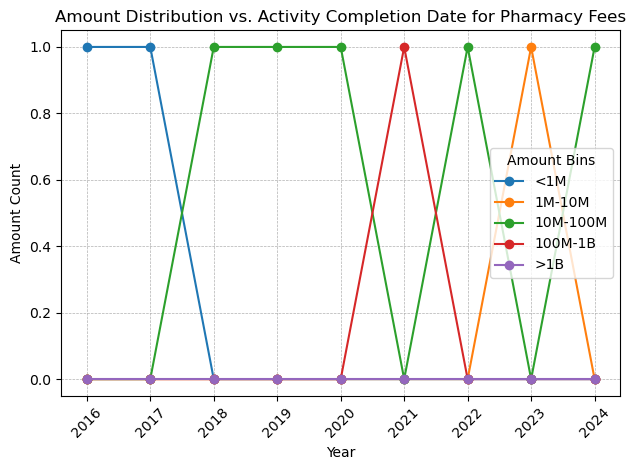

<Figure size 1000x600 with 0 Axes>

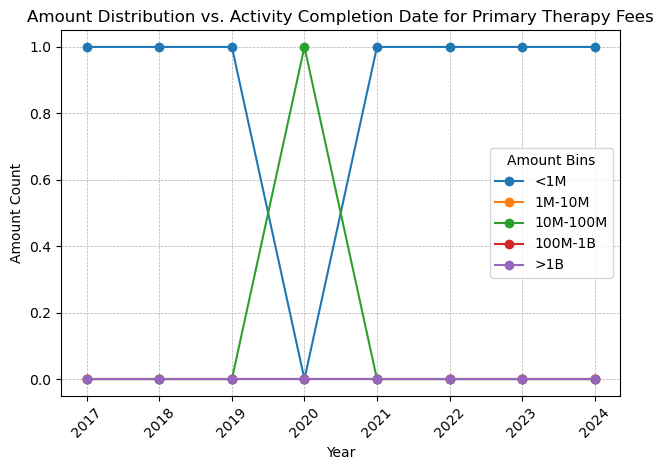

<Figure size 1000x600 with 0 Axes>

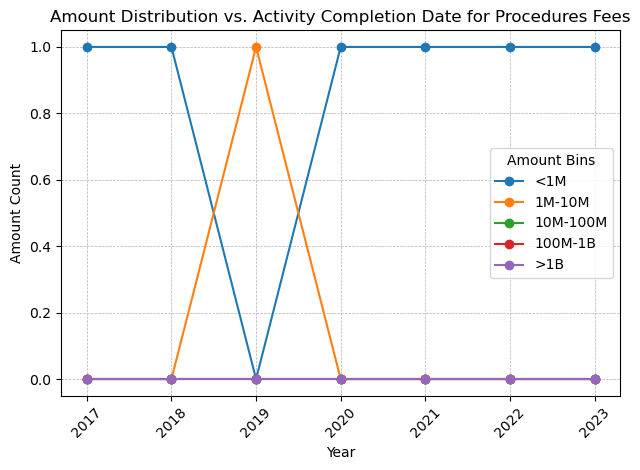

<Figure size 1000x600 with 0 Axes>

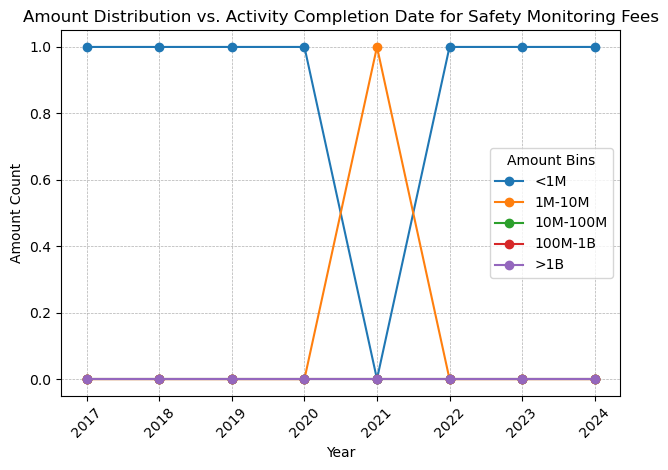

<Figure size 1000x600 with 0 Axes>

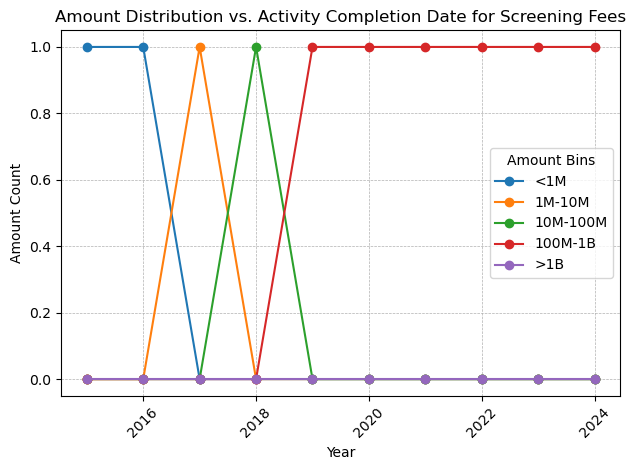

<Figure size 1000x600 with 0 Axes>

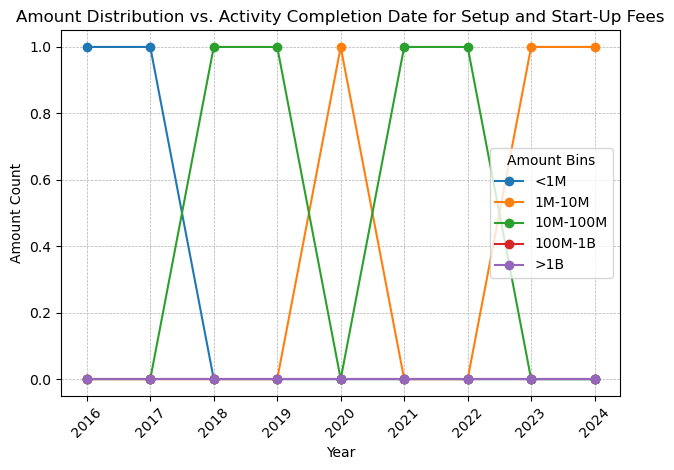

<Figure size 1000x600 with 0 Axes>

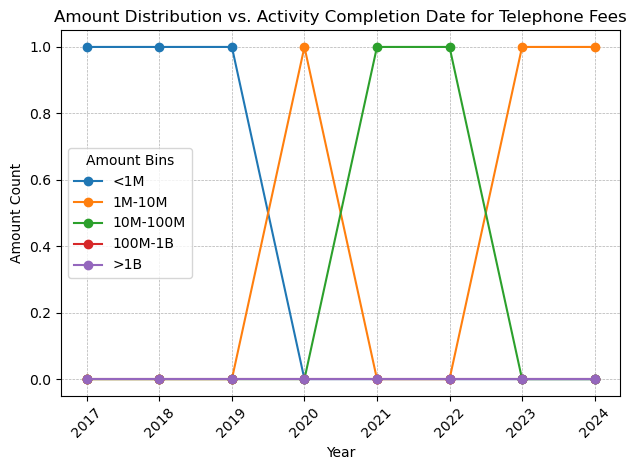

<Figure size 1000x600 with 0 Axes>

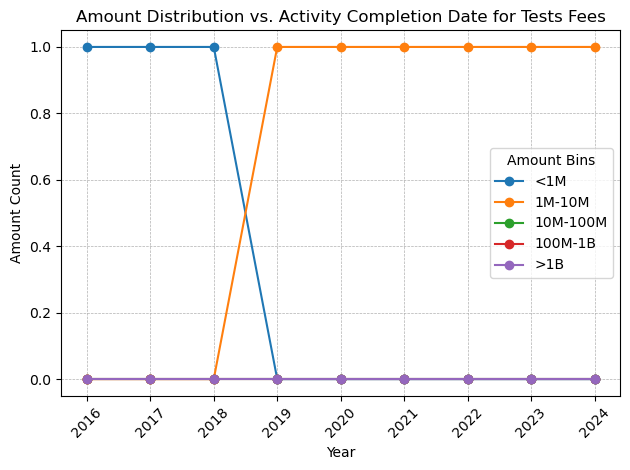

In [116]:
# Read the imputed CSV file
imputed_file_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df = pd.read_csv(imputed_file_path)

# Convert 'activity_completion_date' to datetime and extract year
filtered_data['activity_completion_date'] = pd.to_datetime(filtered_data['activity_completion_date'], errors='coerce')
filtered_data['year'] = filtered_data['activity_completion_date'].dt.year

# Ontologies to plot
ontologies_to_plot = [
    'Administrative Fees', 'Covid Fees', 'Followup Fees', 'IRB/EC Fees', 'Imaging Fees',
    'Miscellaneous Fees', 'Periodic Visits Fees', 'Pharmacy Fees', 'Primary Therapy Fees',
    'Procedures Fees', 'Safety Monitoring Fees', 'Screening Fees', 'Setup and Start-Up Fees',
    'Telephone Fees', 'Tests Fees'
]

# Plot data for each ontology separately
for category in ontologies_to_plot:
    plt.figure(figsize=(10, 6))
    data_category = filtered_data[filtered_data['category'] == category]
    
    # Aggregate amount by year
    data_yearly = data_category.groupby('year')['amount'].sum().reset_index()
    
    # Bin the amount values into categories
    bins = [0, 1e6, 1e7, 1e8, 1e9, 1e10]
    labels = ['<1M', '1M-10M', '10M-100M', '100M-1B', '>1B']
    data_yearly['amount_bins'] = pd.cut(data_yearly['amount'], bins=bins, labels=labels, right=False)
    
    # Plot the line chart with binned data
    data_binned = data_yearly.groupby('year')['amount_bins'].value_counts().unstack().fillna(0)
    data_binned.plot(kind='line', marker='o')
    
    plt.xlabel('Year')
    plt.ylabel('Amount Count')
    plt.title(f'Amount Distribution vs. Activity Completion Date for {category}')
    plt.legend(title='Amount Bins')
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/393260910.py:8: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(imputed_file_path)


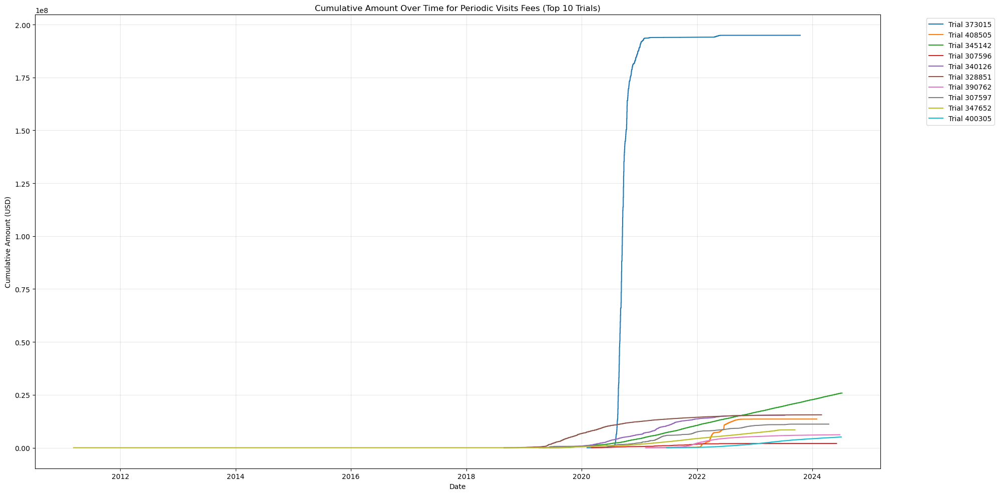

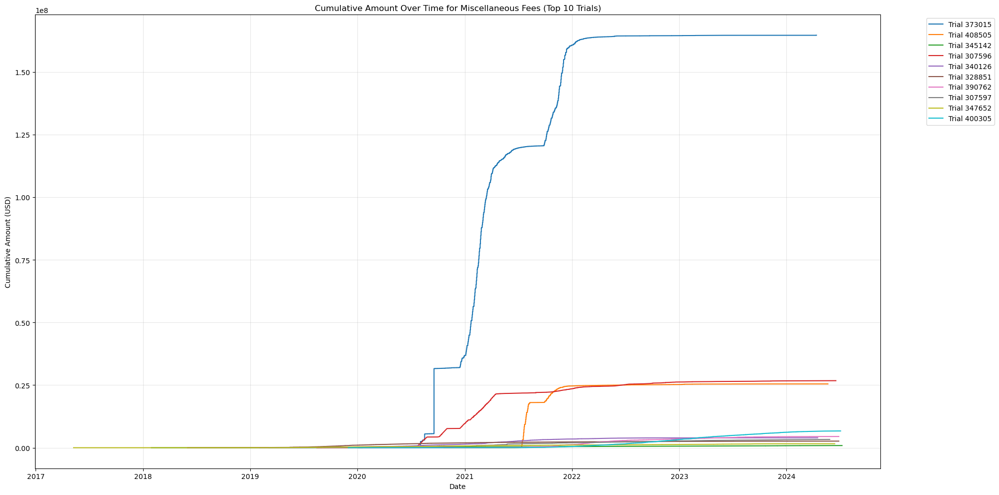

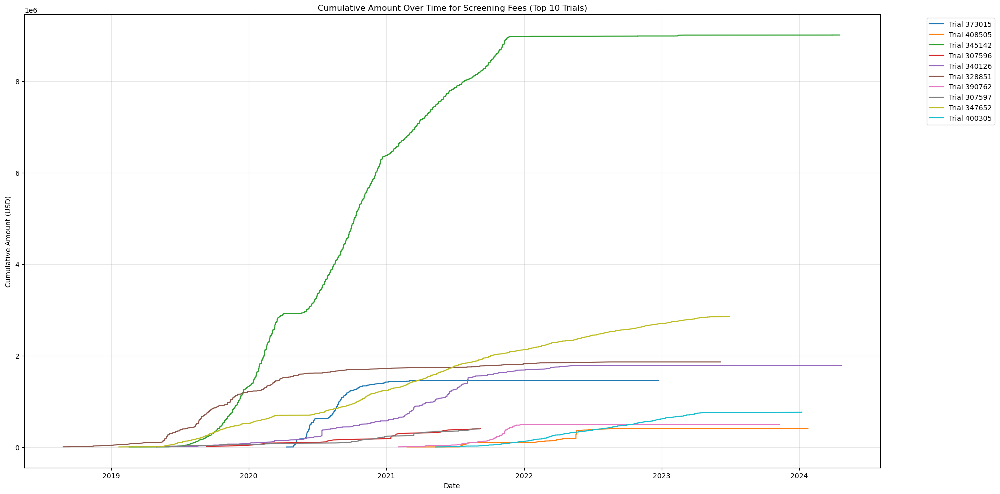

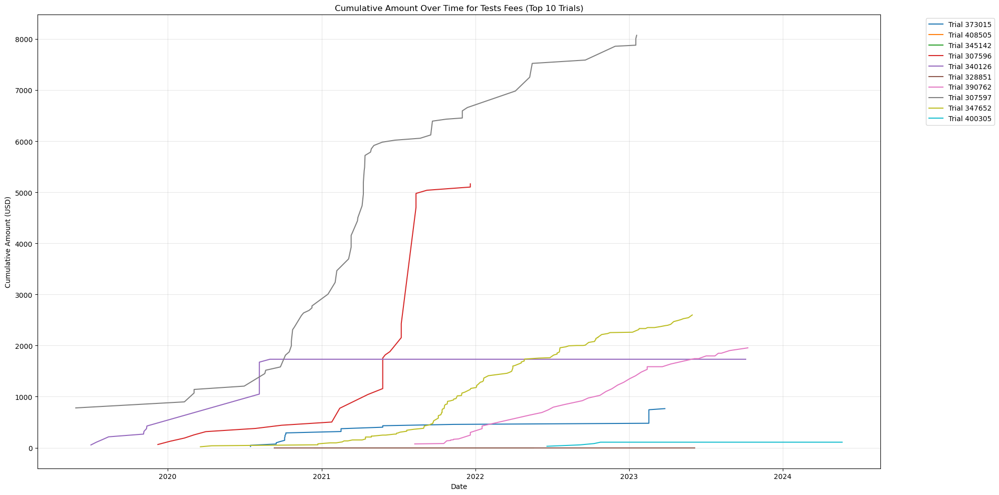

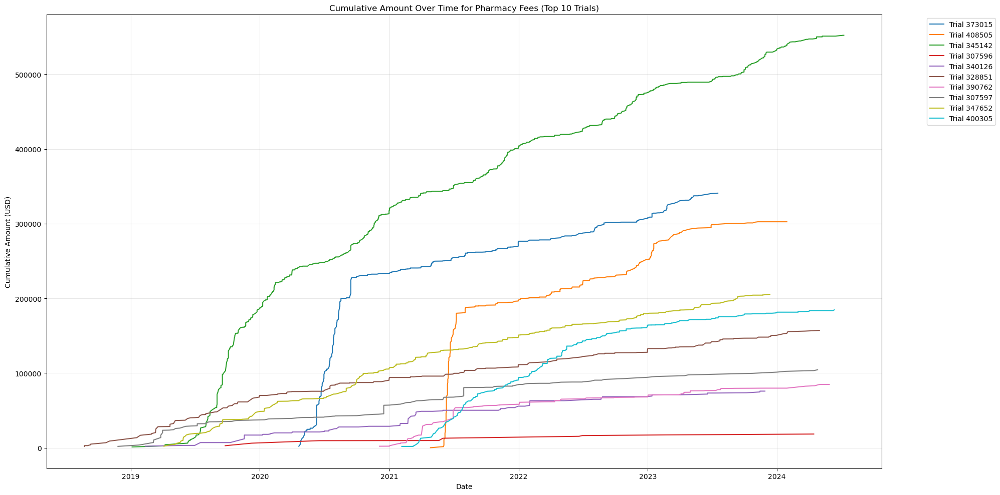

...

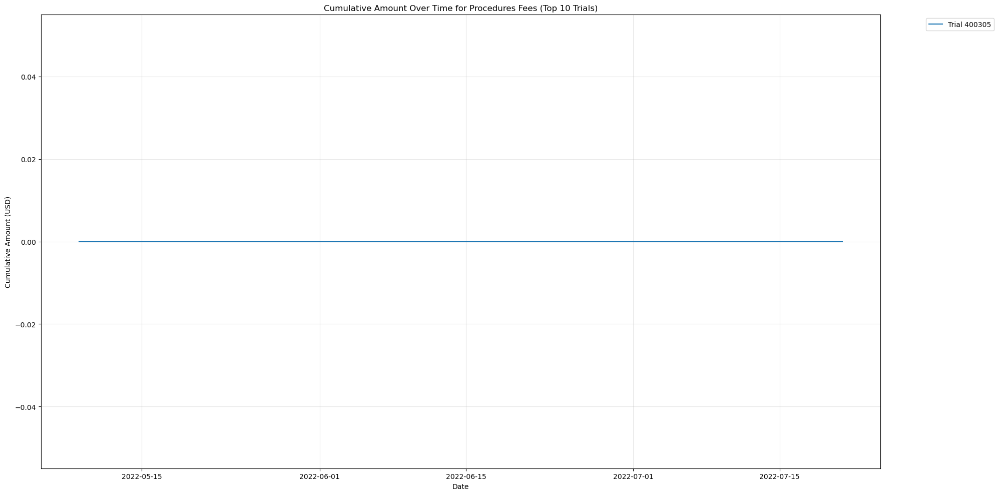

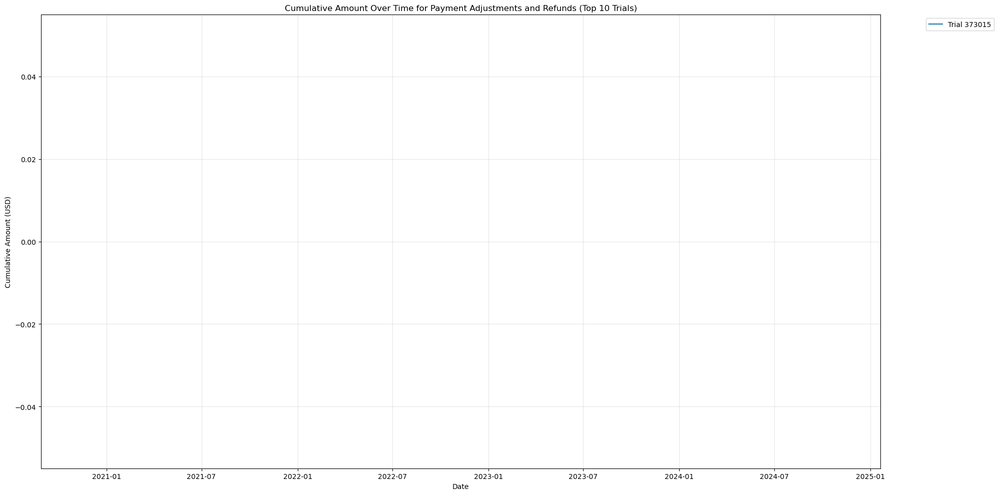

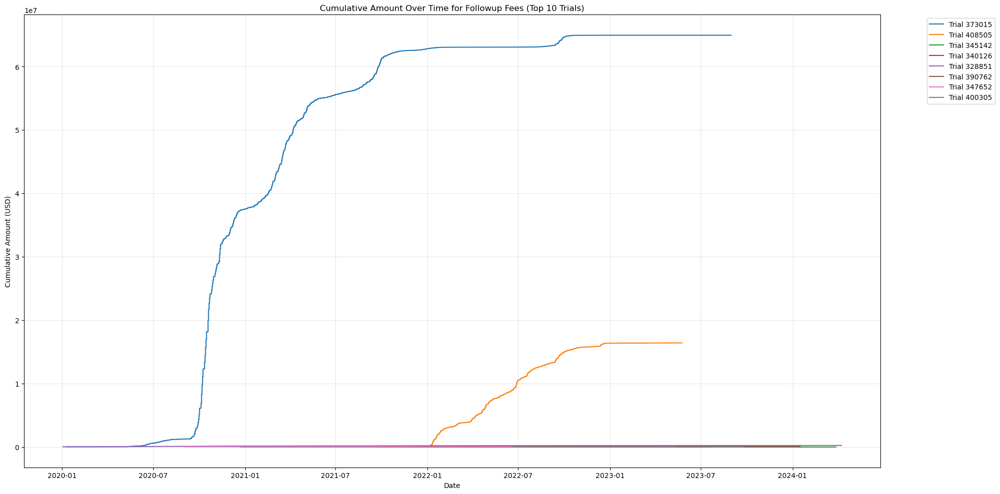

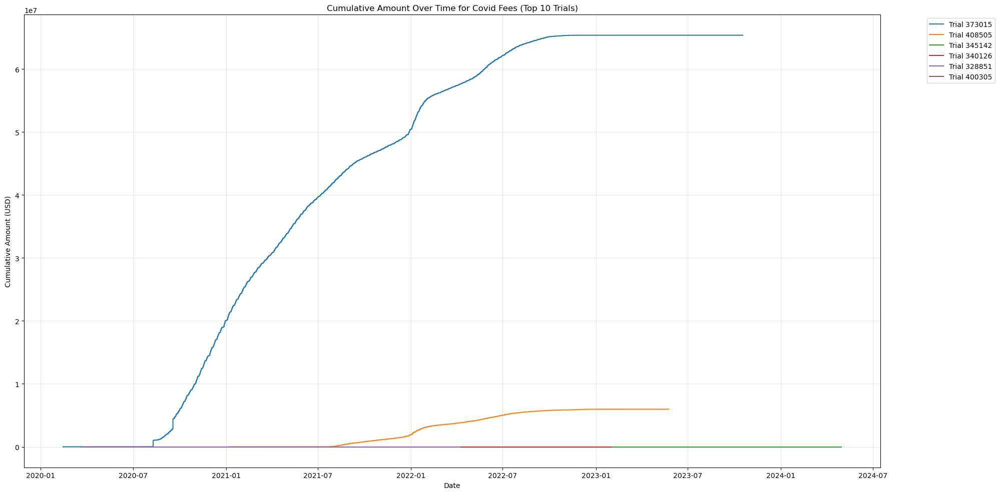

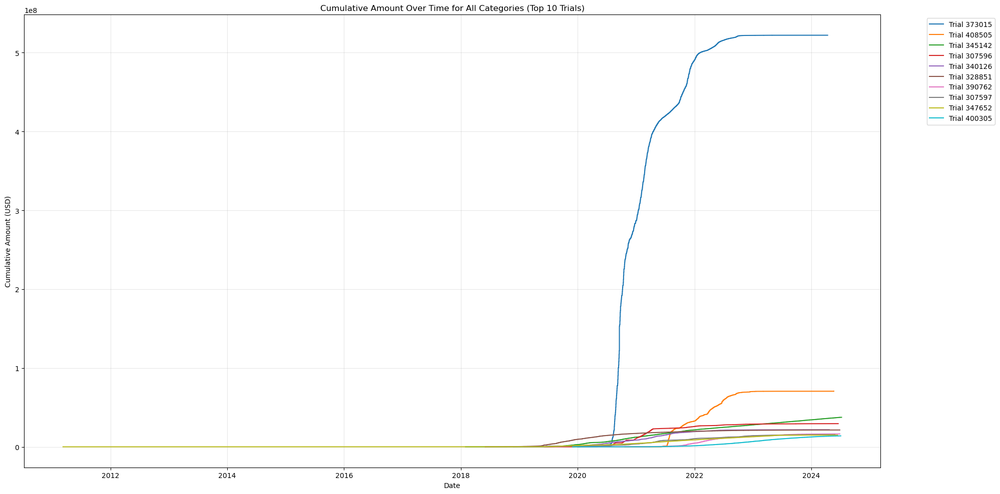

Summary Statistics:
Total number of trials: 357
Total amount spent: $1,241,388,825.99
Date range: 1900-01-01 00:00:00 to 2024-07-09 00:00:00

Top 5 categories by total amount:
category
Periodic Visits Fees    5.432392e+08
Miscellaneous Fees      3.552710e+08
Followup Fees           9.067284e+07
Covid Fees              7.158310e+07
Screening Fees          7.121449e+07
Name: amount_usd, dtype: float64

Top 10 trials by total amount:
cite_trial_id
373015    5.221123e+08
408505    7.051169e+07
345142    3.740701e+07
307596    2.938970e+07
340126    2.164295e+07
328851    2.133883e+07
390762    1.635258e+07
307597    1.542931e+07
347652    1.483516e+07
400305    1.388351e+07
Name: amount_usd, dtype: float64


In [122]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Read the imputed CSV file
imputed_file_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df = pd.read_csv(imputed_file_path)

# Convert 'activity_completion_date' to datetime
df['activity_completion_date'] = pd.to_datetime(df['activity_completion_date'], errors='coerce')

# Sort the dataframe by date
df = df.sort_values('activity_completion_date')

# Function to get top N trials by total amount
def get_top_trials(data, n=10):
    return data.groupby('cite_trial_id')['amount_usd'].sum().nlargest(n).index

# Function to plot curves for a specific category
def plot_category_curves(category, top_trials):
    plt.figure(figsize=(20, 10))
    
    category_data = df[(df['category'] == category) & (df['cite_trial_id'].isin(top_trials))]
    
    for trial in top_trials:
        trial_data = category_data[category_data['cite_trial_id'] == trial]
        if not trial_data.empty:
            cumulative_amount = trial_data['amount_usd'].cumsum()
            plt.plot(trial_data['activity_completion_date'], cumulative_amount, label=f'Trial {trial}')
    
    plt.xlabel('Date')
    plt.ylabel('Cumulative Amount (USD)')
    plt.title(f'Cumulative Amount Over Time for {category} (Top {len(top_trials)} Trials)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Get top 10 trials by total amount
top_trials = get_top_trials(df, 10)

# Plot curves for each category
categories = df['category'].unique()
for category in categories:
    plot_category_curves(category, top_trials)

# Plot cumulative curve for all categories combined
plt.figure(figsize=(20, 10))

for trial in top_trials:
    trial_data = df[df['cite_trial_id'] == trial]
    trial_data = trial_data.sort_values('activity_completion_date')
    cumulative_amount = trial_data['amount_usd'].cumsum()
    plt.plot(trial_data['activity_completion_date'], cumulative_amount, label=f'Trial {trial}')

plt.xlabel('Date')
plt.ylabel('Cumulative Amount (USD)')
plt.title('Cumulative Amount Over Time for All Categories (Top 10 Trials)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Summary statistics
print("Summary Statistics:")
print(f"Total number of trials: {df['cite_trial_id'].nunique()}")
print(f"Total amount spent: ${df['amount_usd'].sum():,.2f}")
print(f"Date range: {df['activity_completion_date'].min()} to {df['activity_completion_date'].max()}")
print("\nTop 5 categories by total amount:")
print(df.groupby('category')['amount_usd'].sum().sort_values(ascending=False).head())
print("\nTop 10 trials by total amount:")
print(df.groupby('cite_trial_id')['amount_usd'].sum().sort_values(ascending=False).head(10))

/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/4271851525.py:8: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(imputed_file_path)


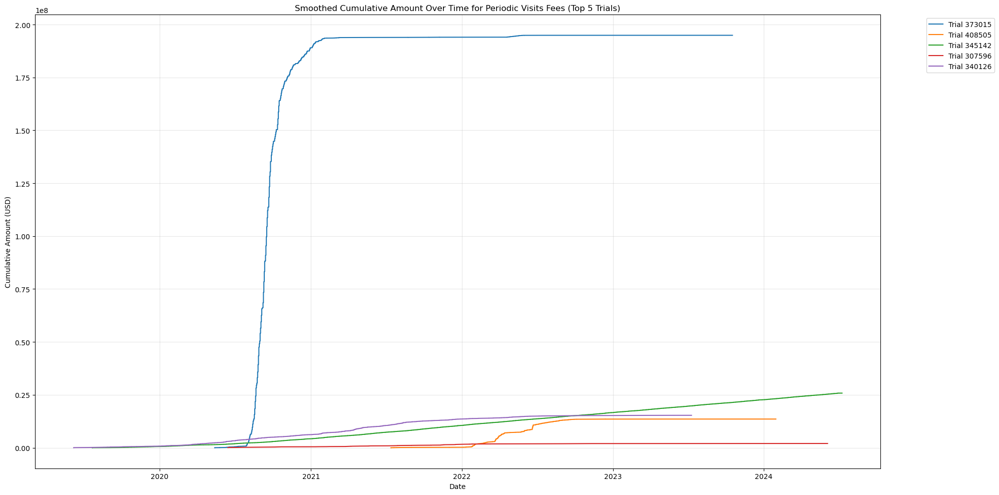

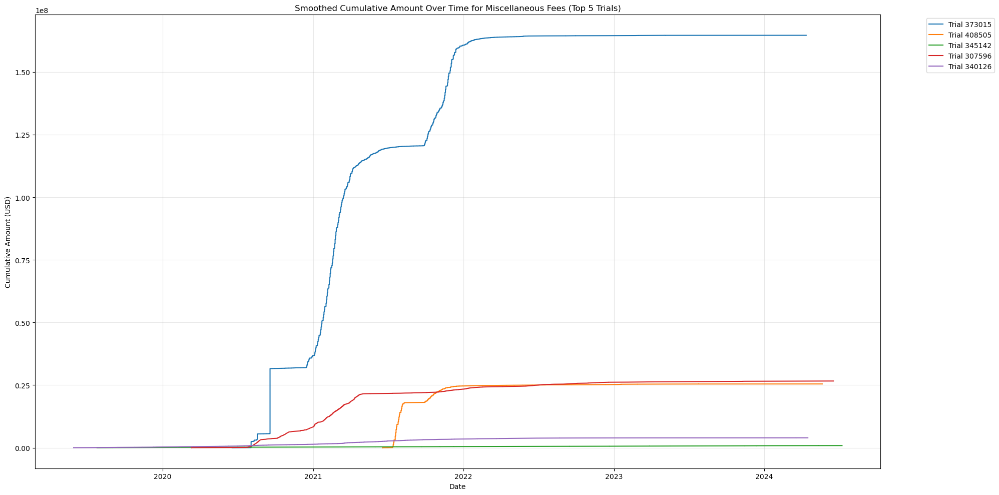

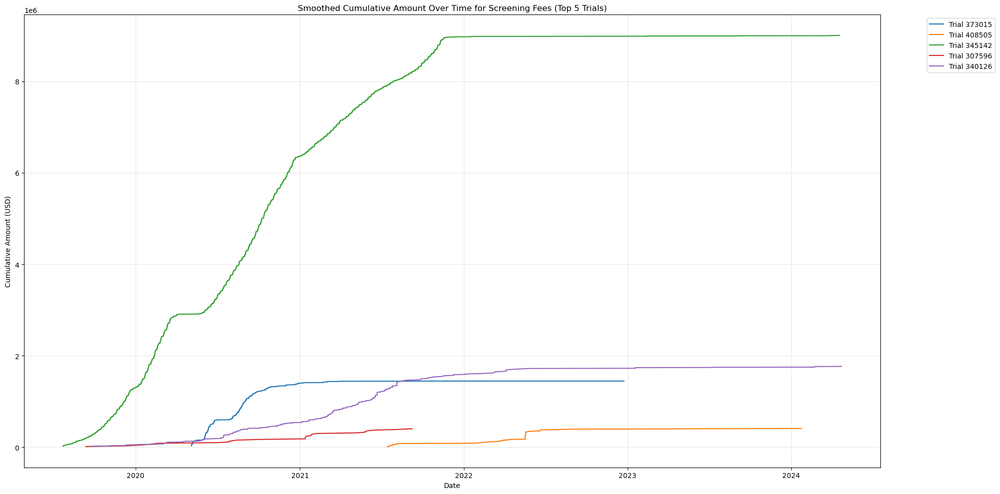

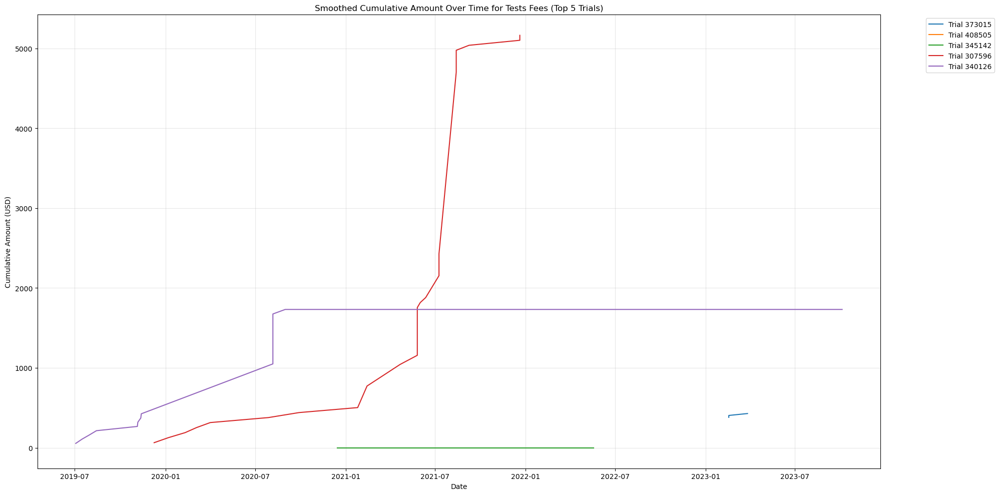

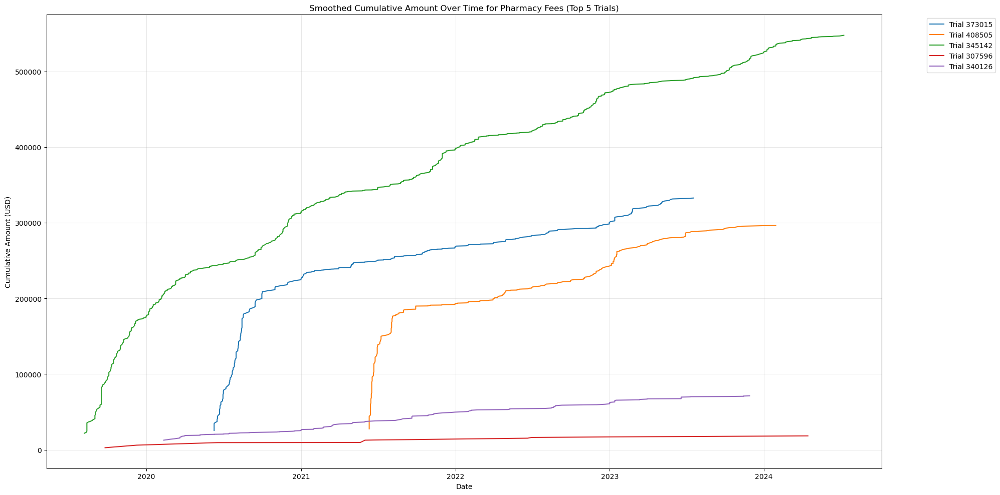

...

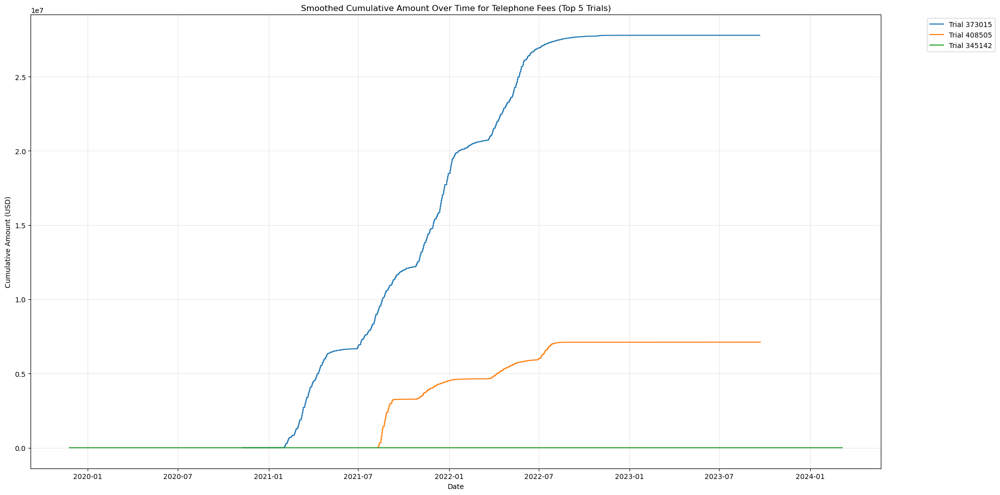

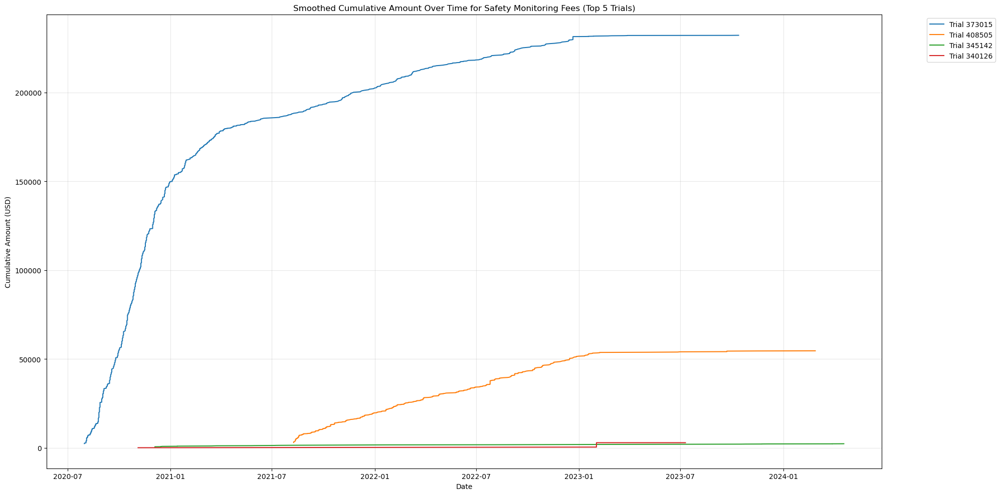

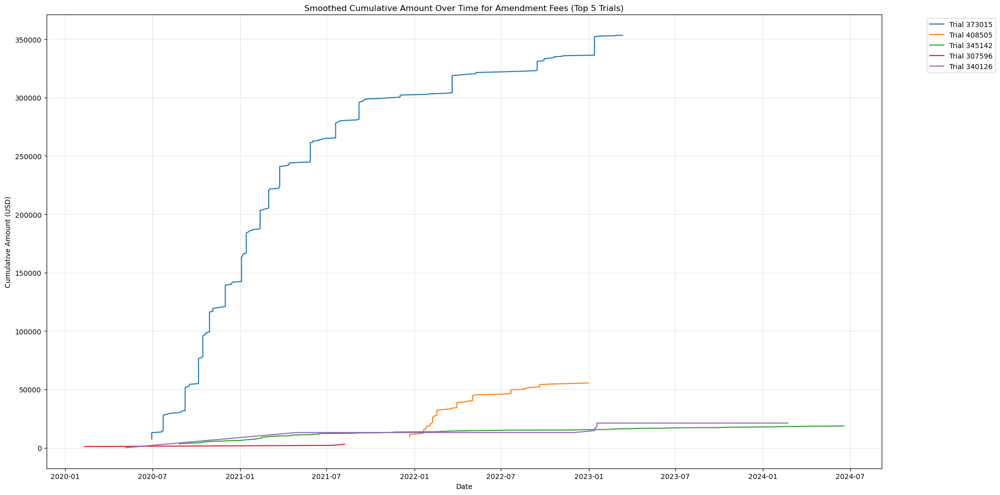

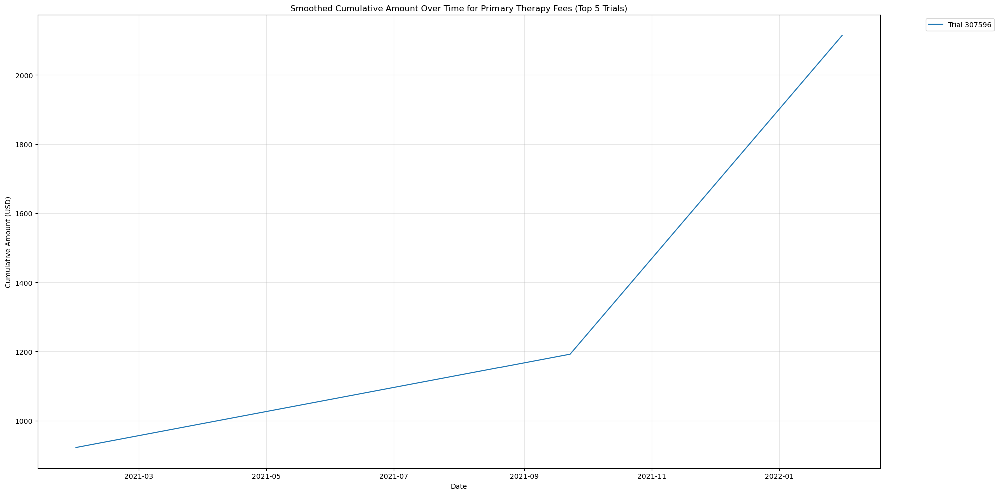

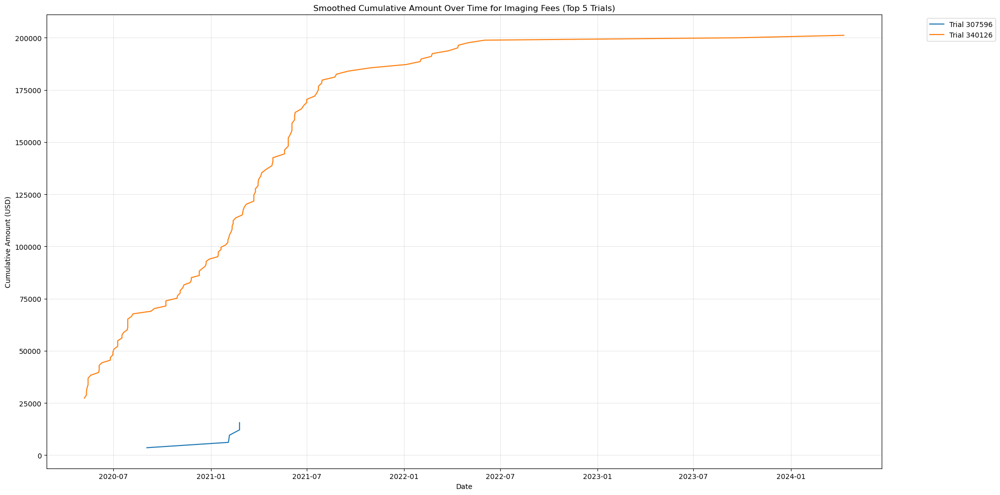

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


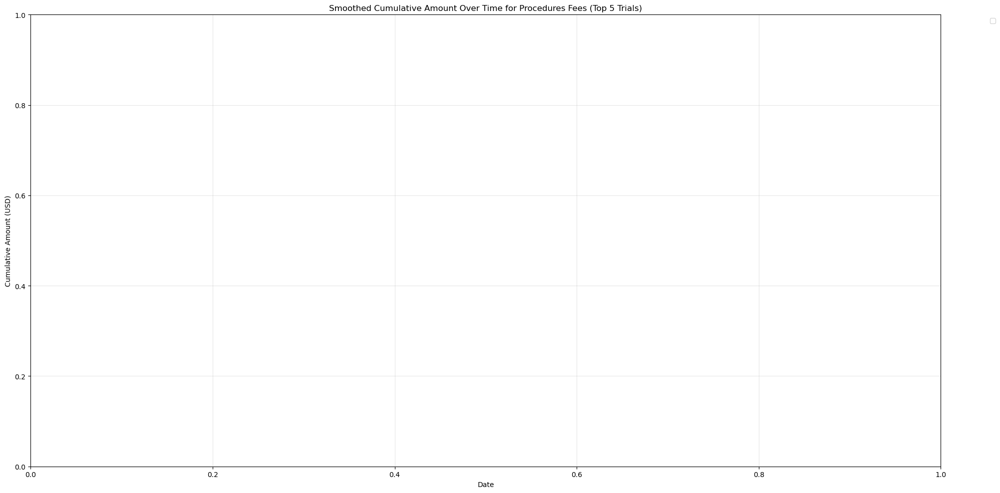

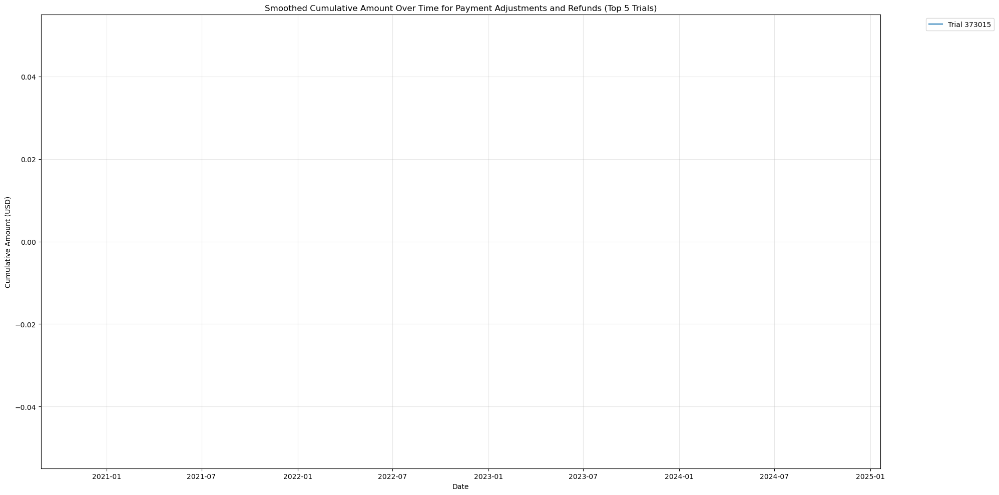

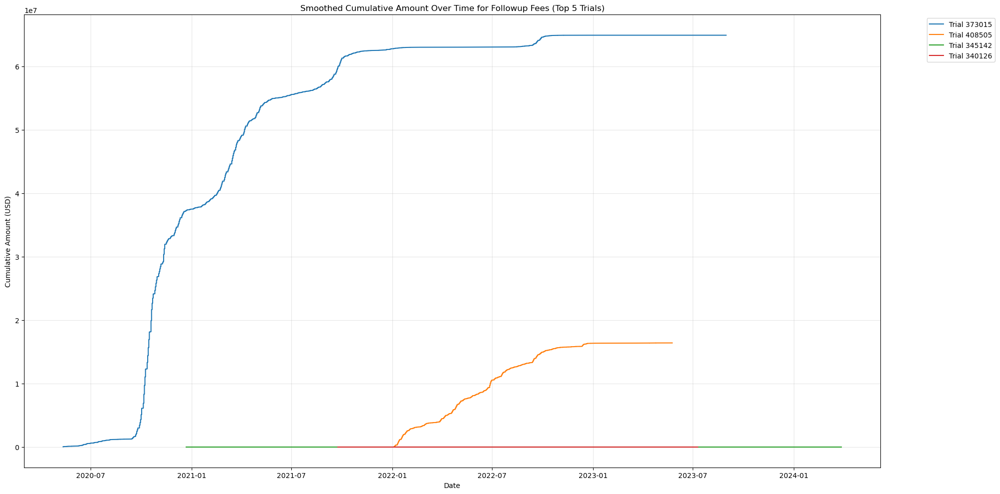

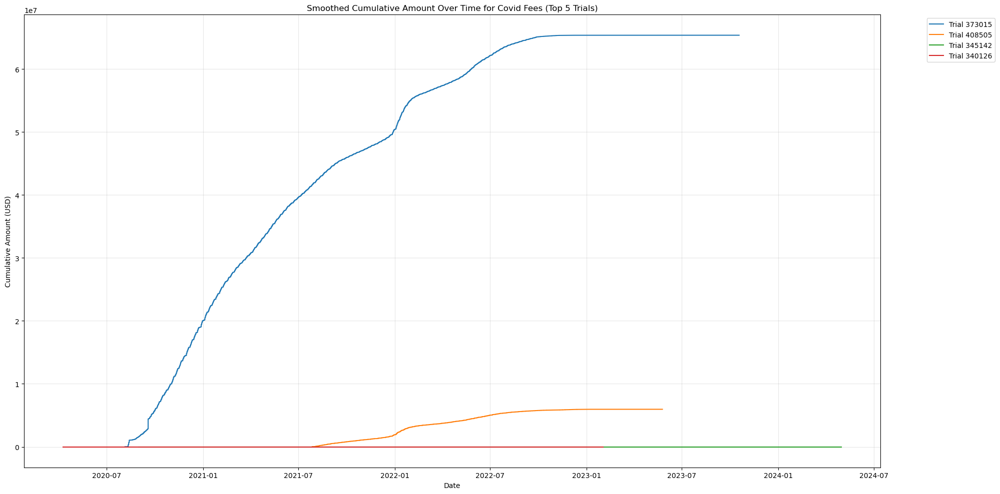

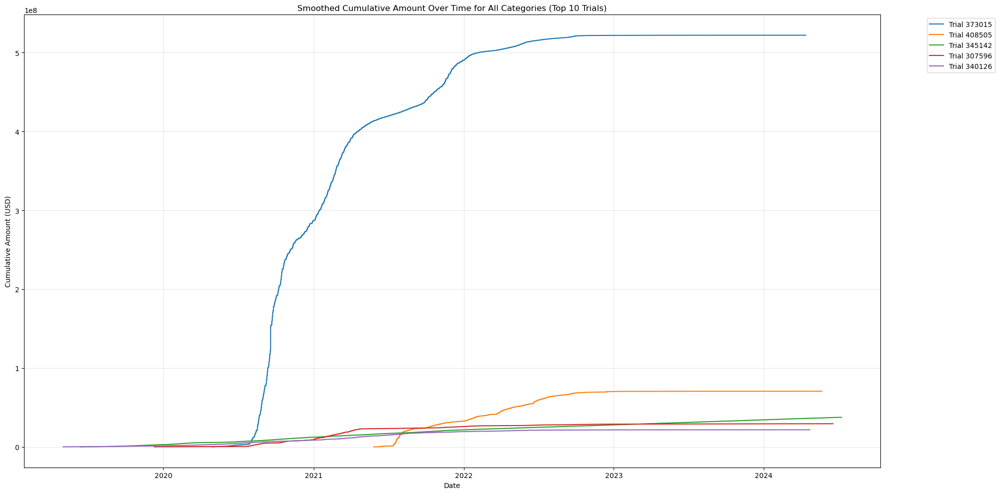

Summary Statistics:
Total number of trials: 357
Total amount spent: $1,241,388,825.99
Date range: 1900-01-01 00:00:00 to 2024-07-09 00:00:00

Top 5 categories by total amount:
category
Periodic Visits Fees    5.432392e+08
Miscellaneous Fees      3.552710e+08
Followup Fees           9.067284e+07
Covid Fees              7.158310e+07
Screening Fees          7.121449e+07
Name: amount_usd, dtype: float64

Top 10 trials by total amount:
cite_trial_id
373015    5.221123e+08
408505    7.051169e+07
345142    3.740701e+07
307596    2.938970e+07
340126    2.164295e+07
328851    2.133883e+07
390762    1.635258e+07
307597    1.542931e+07
347652    1.483516e+07
400305    1.388351e+07
Name: amount_usd, dtype: float64


In [128]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline

# Read the imputed CSV file
imputed_file_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df = pd.read_csv(imputed_file_path)

# Convert 'activity_completion_date' to datetime
df['activity_completion_date'] = pd.to_datetime(df['activity_completion_date'], errors='coerce')

# Sort the dataframe by date
df = df.sort_values('activity_completion_date')

# Function to get top N trials by total amount
def get_top_trials(data, n=10):
    return data.groupby('cite_trial_id')['amount_usd'].sum().nlargest(n).index

# Function to apply moving average smoothing
def smooth_curve(x, y, window_size=30):
    if len(x) < window_size:
        return x, y
    y_smooth = np.convolve(y, np.ones(window_size)/window_size, mode='valid')
    x_smooth = x[window_size-1:]
    return x_smooth, y_smooth

# Function to plot smoothed curves for a specific category
def plot_category_curves(category, top_trials):
    plt.figure(figsize=(20, 10))
    
    category_data = df[(df['category'] == category) & (df['cite_trial_id'].isin(top_trials))]
    
    for trial in top_trials:
        trial_data = category_data[category_data['cite_trial_id'] == trial]
        if not trial_data.empty:
            cumulative_amount = trial_data['amount_usd'].cumsum()
            x = trial_data['activity_completion_date'].astype(int) / 10**9  # Convert to datetime64 to float (nanoseconds)
            y = cumulative_amount.values
            
            # Apply smoothing
            x_smooth, y_smooth = smooth_curve(x, y)
            
            # Convert back to datetime for plotting
            x_smooth = pd.to_datetime(x_smooth * 10**9)
            
            if len(x_smooth) > 0:
                plt.plot(x_smooth, y_smooth, label=f'Trial {trial}')
    
    plt.xlabel('Date')
    plt.ylabel('Cumulative Amount (USD)')
    plt.title(f'Smoothed Cumulative Amount Over Time for {category} (Top {len(top_trials)} Trials)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Get top 10 trials by total amount
top_trials = get_top_trials(df, 5)

# Plot smoothed curves for each category
categories = df['category'].unique()
for category in categories:
    plot_category_curves(category, top_trials)

# Plot smoothed cumulative curve for all categories combined
plt.figure(figsize=(20, 10))
for trial in top_trials:
    trial_data = df[df['cite_trial_id'] == trial]
    trial_data = trial_data.sort_values('activity_completion_date')
    cumulative_amount = trial_data['amount_usd'].cumsum()
    
    x = trial_data['activity_completion_date'].astype(int) / 10**9  # Convert to datetime64 to float (nanoseconds)
    y = cumulative_amount.values
    
    # Apply smoothing
    x_smooth, y_smooth = smooth_curve(x, y)
    
    # Convert back to datetime for plotting
    x_smooth = pd.to_datetime(x_smooth * 10**9)
    
    if len(x_smooth) > 0:
        plt.plot(x_smooth, y_smooth, label=f'Trial {trial}')

plt.xlabel('Date')
plt.ylabel('Cumulative Amount (USD)')
plt.title('Smoothed Cumulative Amount Over Time for All Categories (Top 10 Trials)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Summary statistics (unchanged)
print("Summary Statistics:")
print(f"Total number of trials: {df['cite_trial_id'].nunique()}")
print(f"Total amount spent: ${df['amount_usd'].sum():,.2f}")
print(f"Date range: {df['activity_completion_date'].min()} to {df['activity_completion_date'].max()}")
print("\nTop 5 categories by total amount:")
print(df.groupby('category')['amount_usd'].sum().sort_values(ascending=False).head())
print("\nTop 10 trials by total amount:")
print(df.groupby('cite_trial_id')['amount_usd'].sum().sort_values(ascending=False).head(10))

/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/3856968051.py:10: DtypeWarning: Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(imputed_file_path)


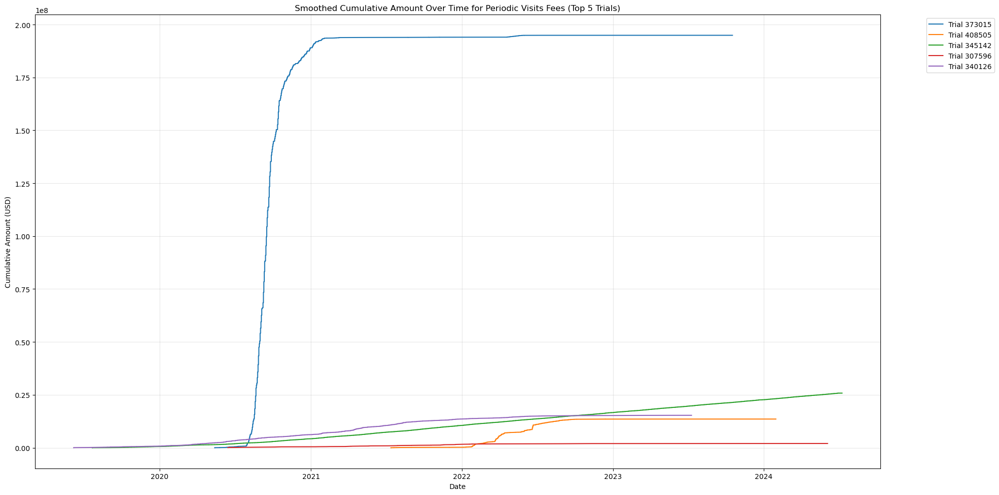

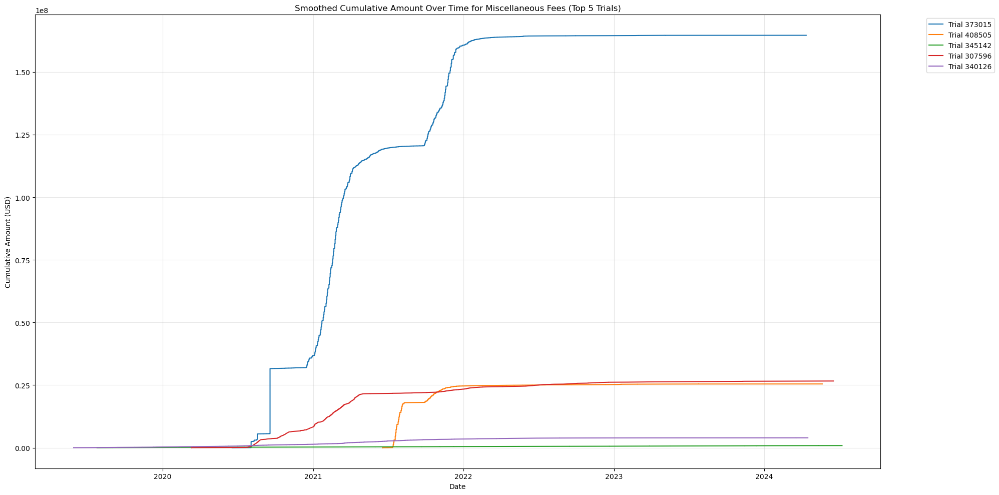

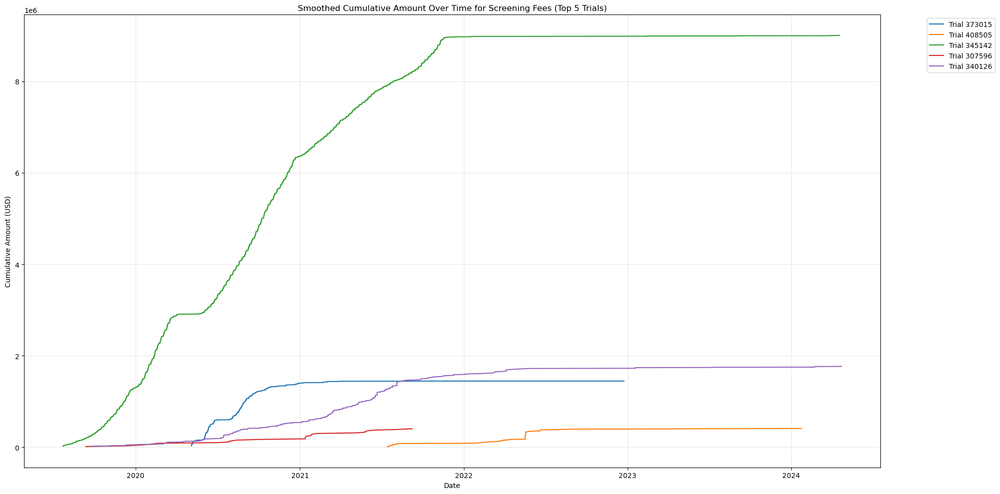

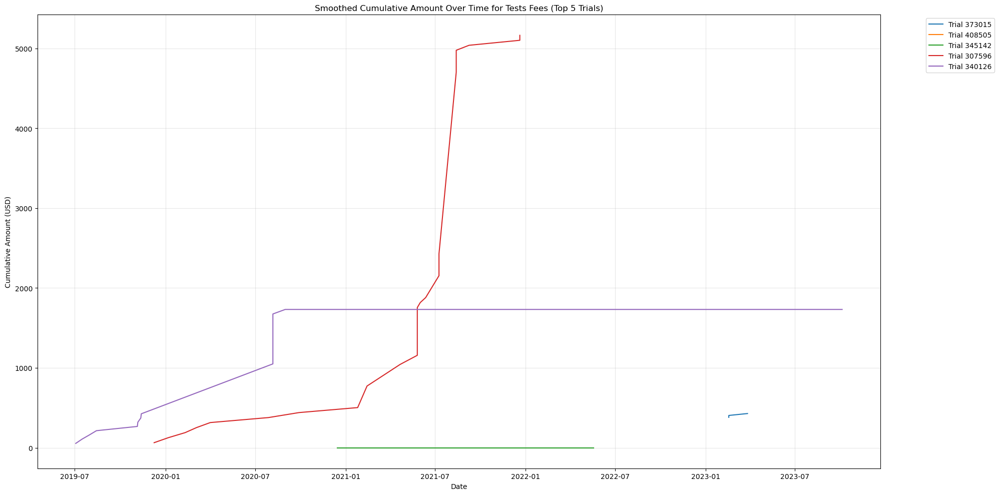

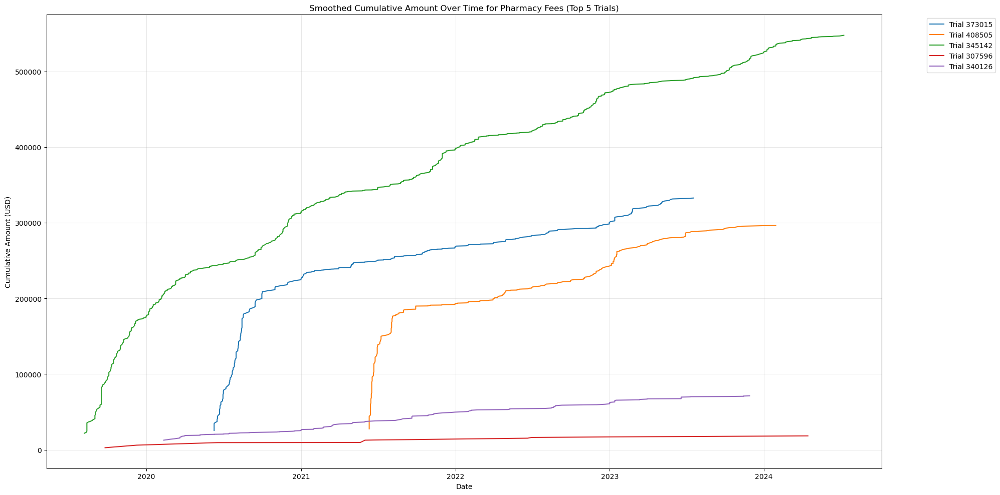

...

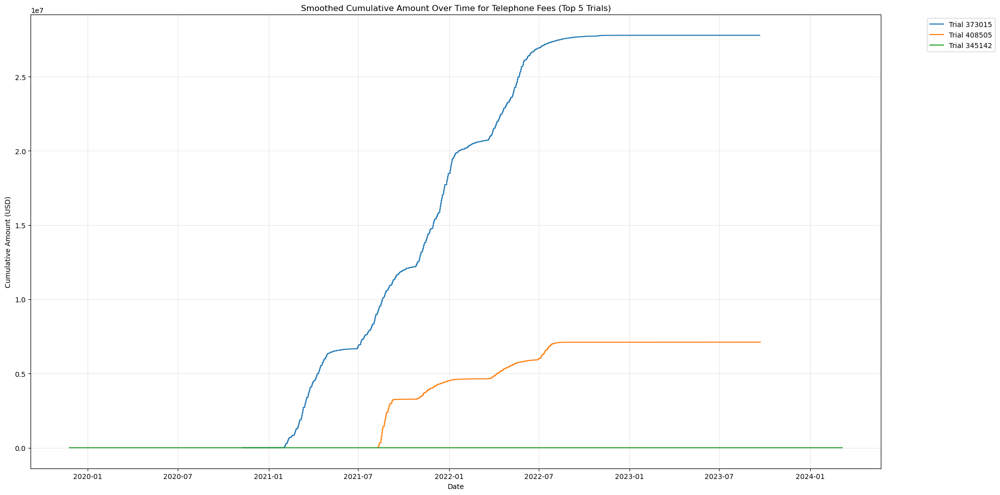

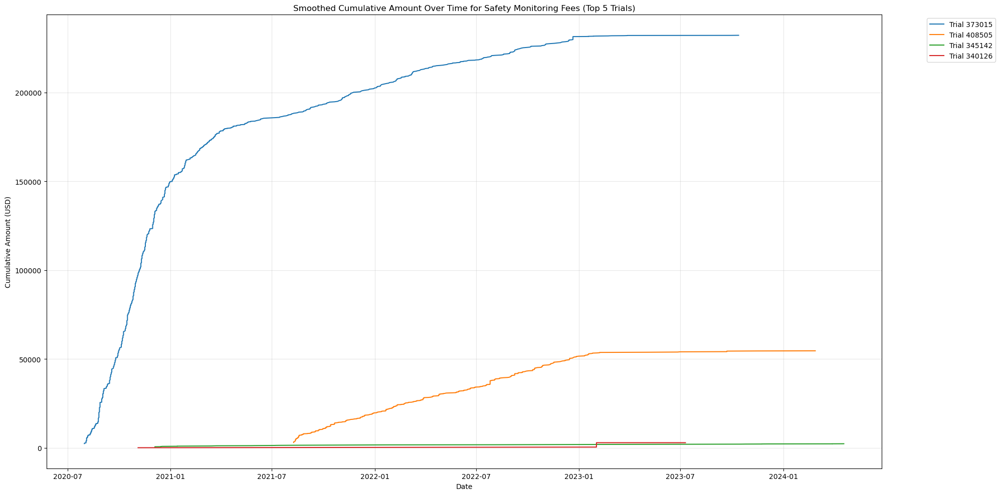

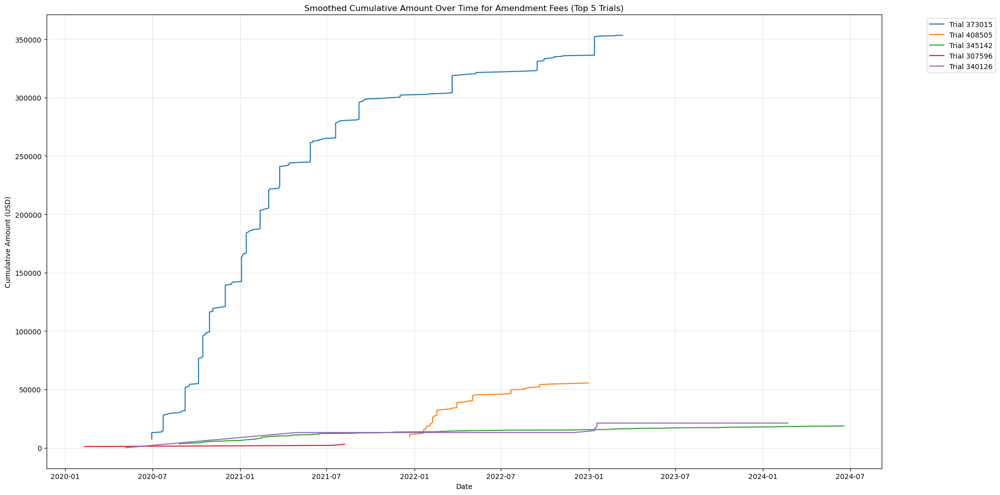

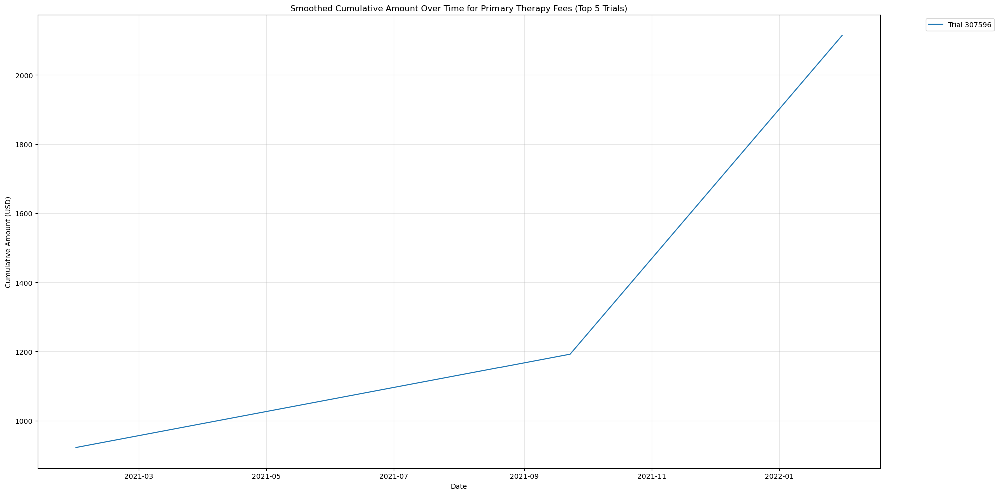

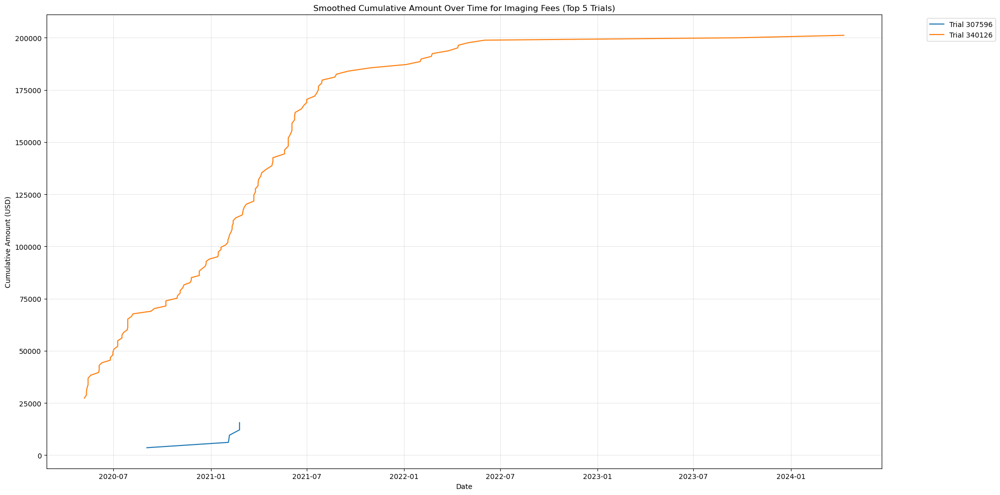

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


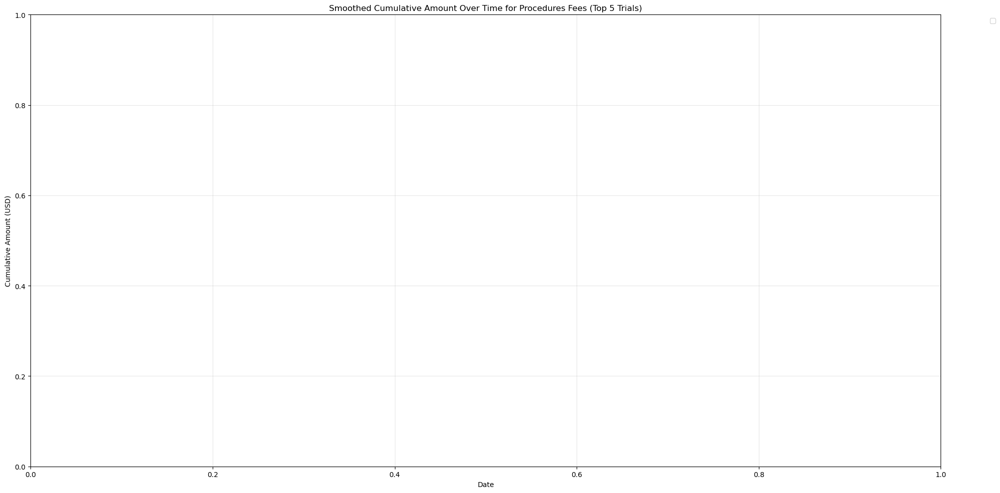

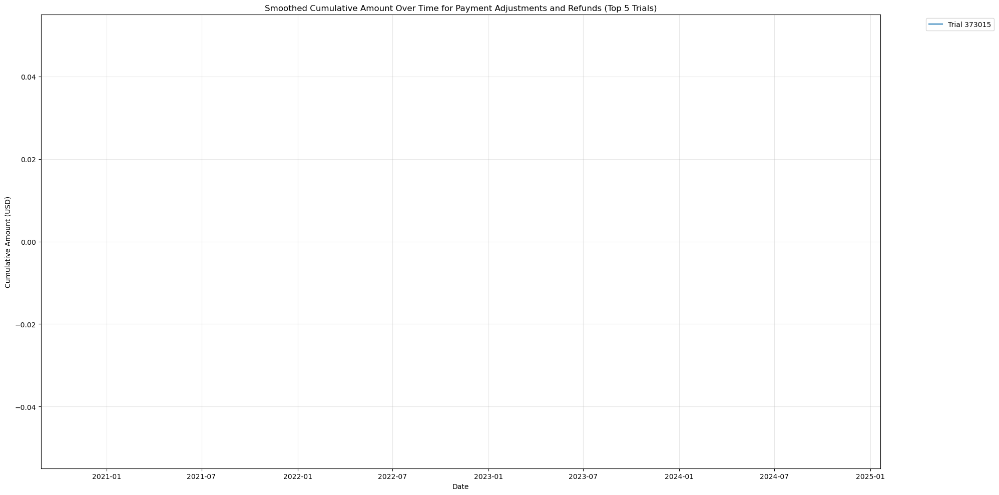

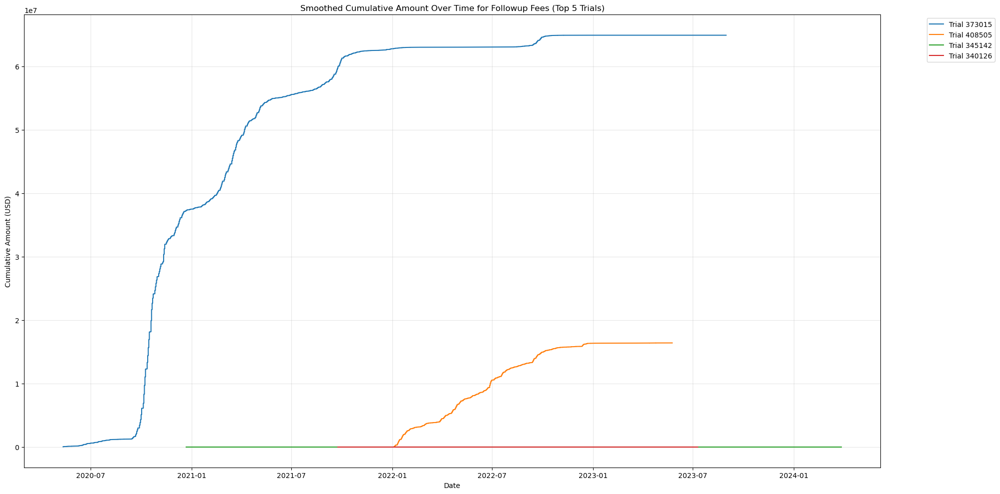

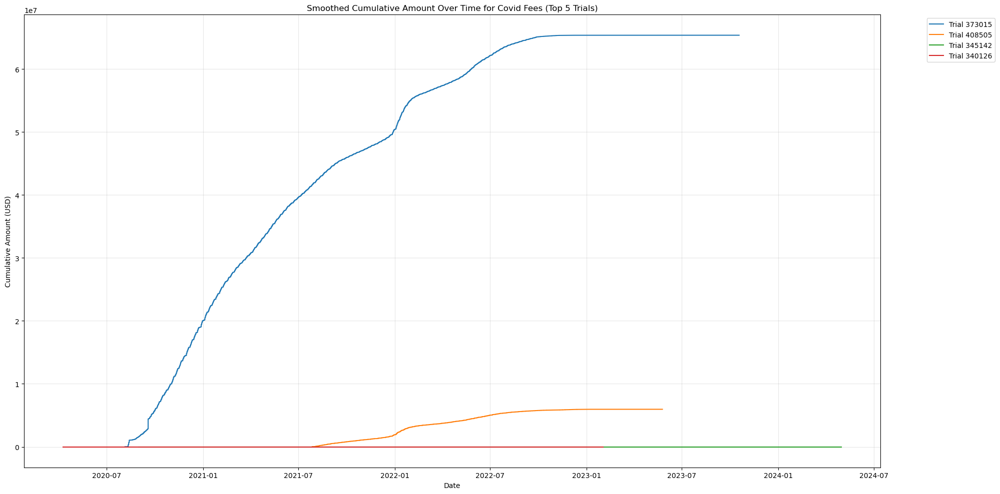

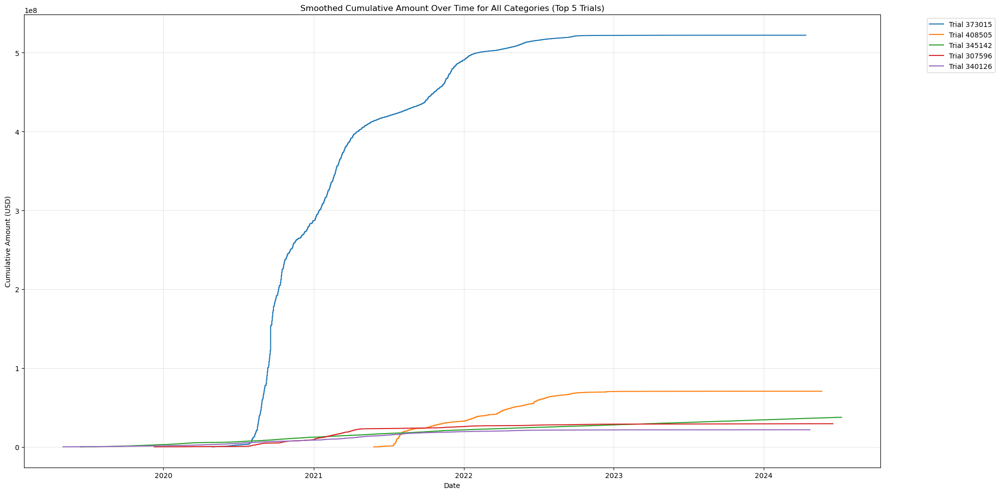

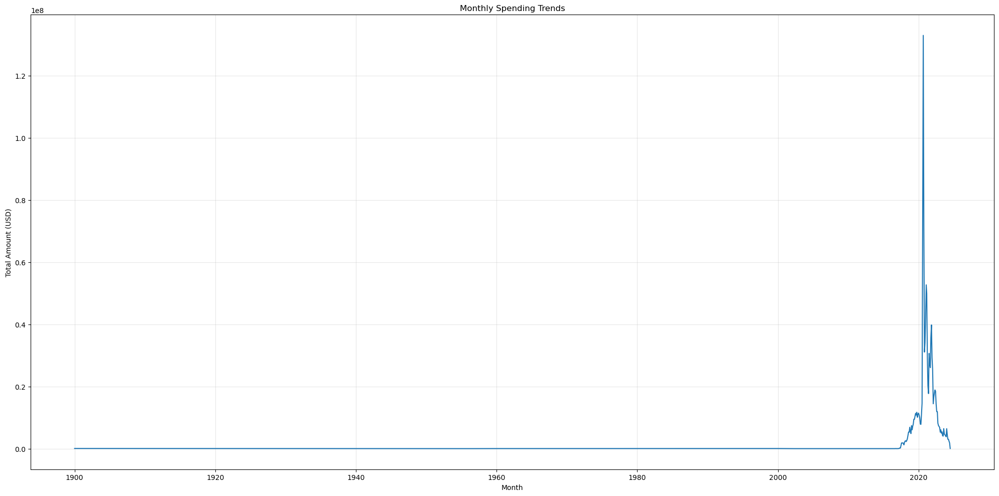

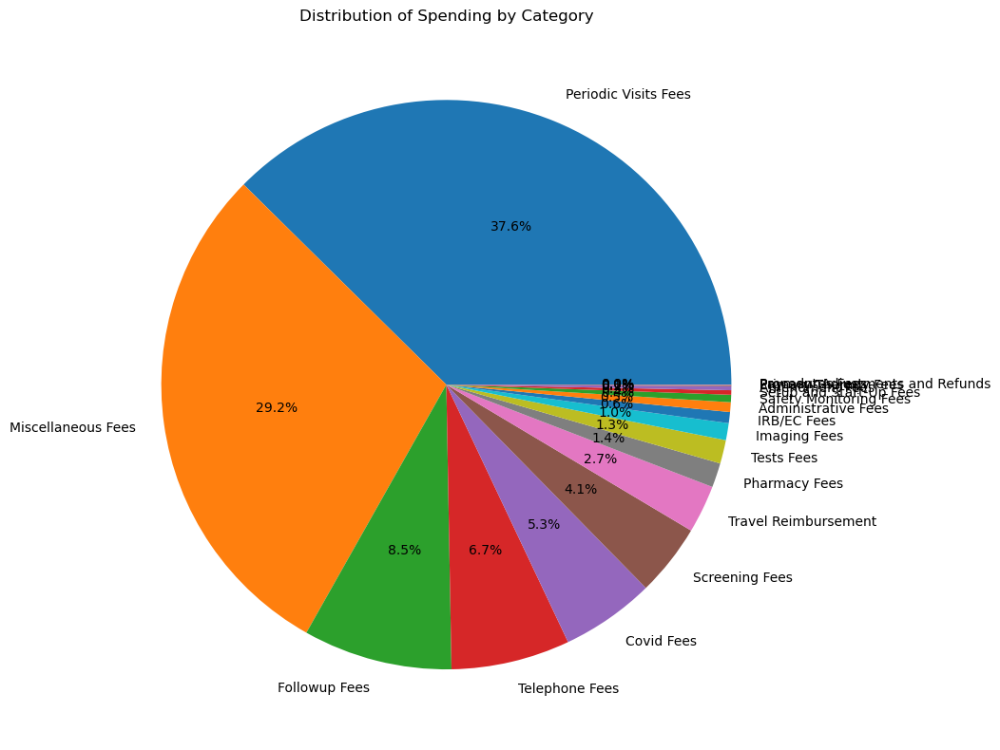

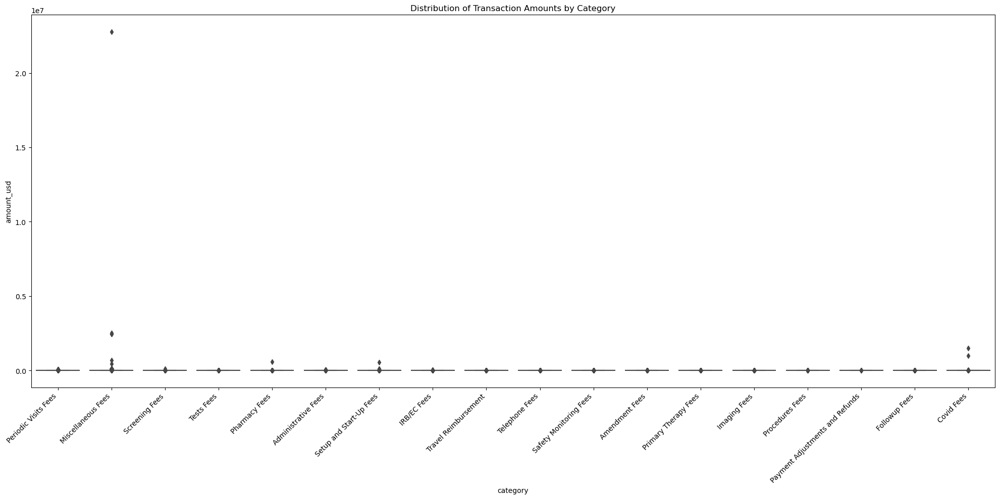

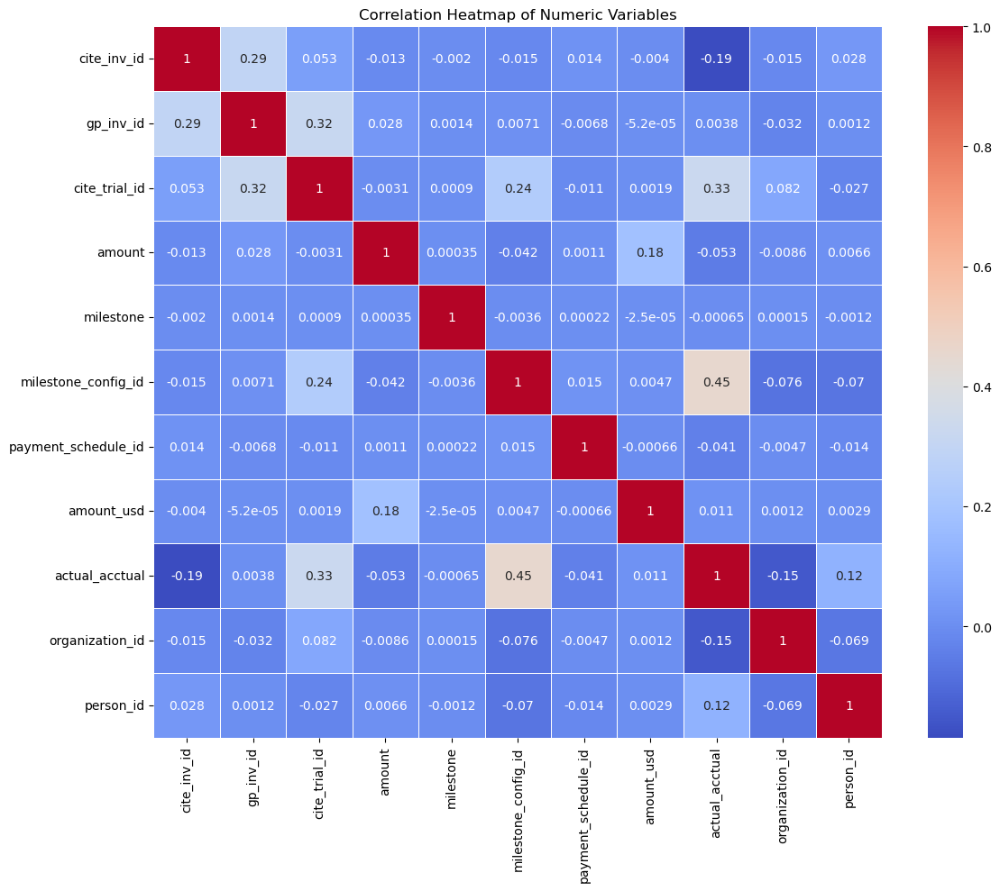

/var/folders/b5/mzdlm1h15y73pzq3scbwtfch0000gn/T/ipykernel_31906/3856968051.py:139: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


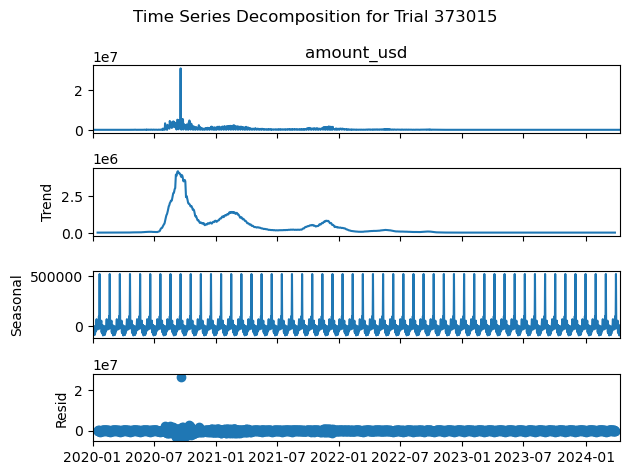


Additional Metrics:
Average transaction amount: $778.23
Median transaction amount: $365.49
Standard deviation of transaction amounts: $18496.82
Total number of transactions: 1595148
Number of unique categories: 18

Top 5 Trials Metrics:

Trial 373015:
  Total amount: $522,112,312.57
  Number of transactions: 442715
  Average transaction amount: $1179.34
  Date range: 2020-01-01 00:00:00 to 2024-04-12 00:00:00
  Duration: 1563 days

Trial 408505:
  Total amount: $70,511,693.14
  Number of transactions: 97038
  Average transaction amount: $726.64
  Date range: 2020-10-22 00:00:00 to 2024-05-21 00:00:00
  Duration: 1307 days

Trial 345142:
  Total amount: $37,407,013.11
  Number of transactions: 166305
  Average transaction amount: $224.93
  Date range: 2018-01-30 00:00:00 to 2024-07-08 00:00:00
  Duration: 2351 days

Trial 307596:
  Total amount: $29,389,704.67
  Number of transactions: 1841
  Average transaction amount: $15963.99
  Date range: 2019-06-07 00:00:00 to 2024-06-17 00:00:00

In [132]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.interpolate import make_interp_spline
from scipy import stats

# Read the imputed CSV file
imputed_file_path = '/Users/armughan/Downloads/Imputed_Analyze_New_Data.csv'
df = pd.read_csv(imputed_file_path)

# Convert 'activity_completion_date' to datetime
df['activity_completion_date'] = pd.to_datetime(df['activity_completion_date'], errors='coerce')

# Sort the dataframe by date
df = df.sort_values('activity_completion_date')

# Function to get top N trials by total amount
def get_top_trials(data, n=5):
    return data.groupby('cite_trial_id')['amount_usd'].sum().nlargest(n).index

# Function to apply moving average smoothing
def smooth_curve(x, y, window_size=30):
    if len(x) < window_size:
        return x, y
    y_smooth = np.convolve(y, np.ones(window_size)/window_size, mode='valid')
    x_smooth = x[window_size-1:]
    return x_smooth, y_smooth

# Function to plot smoothed curves for a specific category
def plot_category_curves(category, top_trials):
    plt.figure(figsize=(20, 10))
    
    category_data = df[(df['category'] == category) & (df['cite_trial_id'].isin(top_trials))]
    
    for trial in top_trials:
        trial_data = category_data[category_data['cite_trial_id'] == trial]
        if not trial_data.empty:
            cumulative_amount = trial_data['amount_usd'].cumsum()
            x = trial_data['activity_completion_date'].astype(int) / 10**9
            y = cumulative_amount.values
            
            x_smooth, y_smooth = smooth_curve(x, y)
            x_smooth = pd.to_datetime(x_smooth * 10**9)
            
            if len(x_smooth) > 0:
                plt.plot(x_smooth, y_smooth, label=f'Trial {trial}')
    
    plt.xlabel('Date')
    plt.ylabel('Cumulative Amount (USD)')
    plt.title(f'Smoothed Cumulative Amount Over Time for {category} (Top {len(top_trials)} Trials)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# Get top 5 trials by total amount
top_trials = get_top_trials(df, 5)

# Plot smoothed curves for each category
categories = df['category'].unique()
for category in categories:
    plot_category_curves(category, top_trials)

# Plot smoothed cumulative curve for all categories combined
plt.figure(figsize=(20, 10))
for trial in top_trials:
    trial_data = df[df['cite_trial_id'] == trial]
    trial_data = trial_data.sort_values('activity_completion_date')
    cumulative_amount = trial_data['amount_usd'].cumsum()
    
    x = trial_data['activity_completion_date'].astype(int) / 10**9
    y = cumulative_amount.values
    
    x_smooth, y_smooth = smooth_curve(x, y)
    x_smooth = pd.to_datetime(x_smooth * 10**9)
    
    if len(x_smooth) > 0:
        plt.plot(x_smooth, y_smooth, label=f'Trial {trial}')

plt.xlabel('Date')
plt.ylabel('Cumulative Amount (USD)')
plt.title('Smoothed Cumulative Amount Over Time for All Categories (Top 5 Trials)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Additional metrics and visualizations

# 1. Monthly spending trends
df['month'] = df['activity_completion_date'].dt.to_period('M')
monthly_spending = df.groupby('month')['amount_usd'].sum().reset_index()
monthly_spending['month'] = monthly_spending['month'].dt.to_timestamp()

plt.figure(figsize=(20, 10))
plt.plot(monthly_spending['month'], monthly_spending['amount_usd'])
plt.title('Monthly Spending Trends')
plt.xlabel('Month')
plt.ylabel('Total Amount (USD)')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# 2. Category distribution
plt.figure(figsize=(12, 8))
df['category'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribution of Spending by Category')
plt.ylabel('')
plt.tight_layout()
plt.show()

# 3. Box plot of amount distribution by category
plt.figure(figsize=(20, 10))
sns.boxplot(x='category', y='amount_usd', data=df)
plt.title('Distribution of Transaction Amounts by Category')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# 4. Correlation heatmap
numeric_cols = df.select_dtypes(include=[np.number]).columns
correlation_matrix = df[numeric_cols].corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numeric Variables')
plt.tight_layout()
plt.show()

# 5. Time series decomposition for the top trial
from statsmodels.tsa.seasonal import seasonal_decompose

top_trial_id = top_trials[0]
top_trial_data = df[df['cite_trial_id'] == top_trial_id].set_index('activity_completion_date')['amount_usd'].resample('D').sum().fillna(0)

result = seasonal_decompose(top_trial_data, model='additive', period=30)
result.plot()
plt.suptitle(f'Time Series Decomposition for Trial {top_trial_id}')
plt.tight_layout()
plt.show()

# Additional metrics
print("\nAdditional Metrics:")
print(f"Average transaction amount: ${df['amount_usd'].mean():.2f}")
print(f"Median transaction amount: ${df['amount_usd'].median():.2f}")
print(f"Standard deviation of transaction amounts: ${df['amount_usd'].std():.2f}")
print(f"Total number of transactions: {len(df)}")
print(f"Number of unique categories: {df['category'].nunique()}")

# Top 5 trials metrics
top_trials_data = df[df['cite_trial_id'].isin(top_trials)]
print("\nTop 5 Trials Metrics:")
for trial in top_trials:
    trial_data = top_trials_data[top_trials_data['cite_trial_id'] == trial]
    print(f"\nTrial {trial}:")
    print(f"  Total amount: ${trial_data['amount_usd'].sum():,.2f}")
    print(f"  Number of transactions: {len(trial_data)}")
    print(f"  Average transaction amount: ${trial_data['amount_usd'].mean():.2f}")
    print(f"  Date range: {trial_data['activity_completion_date'].min()} to {trial_data['activity_completion_date'].max()}")
    print(f"  Duration: {(trial_data['activity_completion_date'].max() - trial_data['activity_completion_date'].min()).days} days")

# Spending rate analysis
total_days = (df['activity_completion_date'].max() - df['activity_completion_date'].min()).days
spending_rate = df['amount_usd'].sum() / total_days
print(f"\nOverall average daily spending rate: ${spending_rate:.2f}")

# Category-wise metrics
category_metrics = df.groupby('category').agg({
    'amount_usd': ['sum', 'mean', 'median', 'std', 'count']
}).reset_index()
category_metrics.columns = ['category', 'total_amount', 'avg_amount', 'median_amount', 'std_amount', 'transaction_count']
category_metrics = category_metrics.sort_values('total_amount', ascending=False)

print("\nCategory-wise Metrics (Top 5):")
print(category_metrics.head().to_string(index=False))

# Summary statistics (unchanged)
print("\nSummary Statistics:")
print(f"Total number of trials: {df['cite_trial_id'].nunique()}")
print(f"Total amount spent: ${df['amount_usd'].sum():,.2f}")
print(f"Date range: {df['activity_completion_date'].min()} to {df['activity_completion_date'].max()}")
print("\nTop 5 categories by total amount:")
print(df.groupby('category')['amount_usd'].sum().sort_values(ascending=False).head())
print("\nTop 5 trials by total amount:")
print(df.groupby('cite_trial_id')['amount_usd'].sum().sort_values(ascending=False).head())